# Simulate Thompson Subsampling

Thompson sampling approach requires updating posteriors for each iteration, however, in each iteration we only know one new label and that may be supply much information for updating. So instead of updating all posteriors we uniformly random sample some entities and relations to update. 

We experiments on how subsampling affects the ROC_AUC_SCORE, cumulative gain as well as running time.

Evaluation metrics:

(1)ROC_AUC_SCORE: calculated between true labels and predictions for each iterations  
(2)Cumulative gain: for each iteration, if the maximum prediction corresponding with the valid labels gain 1, otherwise 0. Show cumulative gain for all iterations.
(3)running time: average running time for each iteration

We chose repeated labelling and Thompson Sampling for 5,000 iterations, and used [NATIONS](https://github.com/dongwookim-ml/kg-data) dataset as an example, there are totally 2,024 valid triples. 

Experiments: 

subn_ent = [2,5,10,n_entities]  
subn_rel = [2,5,10,n_relations]


In [1]:
# direct to parent folder
import sys
sys.path.append("../acton")

from acton.database import GraphReader, GraphDatabase
from acton.predictors import TensorPredictor
from acton.recommenders import ThompsonSamplingRecommender
from acton.labellers import GraphDatabaseLabeller
import acton.acton
import tempfile
import astropy.io.ascii as io_ascii
import os.path
import numpy
import logging
import matplotlib.pyplot as plt
import pickle
from collections import defaultdict

/home/admin-u6015325/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
logging.basicConfig(level = logging.DEBUG)

_path = 'kg-data/nation/triples.txt'
output_path = 'acton.proto'
outfile_path = "ts_subsampling_exper2/"
n_dim = 10
TS= 0.0
RANDOM = 1.0

In [3]:
with GraphReader(_path, n_dim) as reader:
    n_relations = reader.n_relations
    n_entities = reader.n_entities
    totoal_size = n_relations * n_entities * n_entities
    ids = numpy.arange(totoal_size)
    
    N_EPOCHS = 5000
    repeated_labelling = True

    results = defaultdict(list)
    
    subn_ent = [2,5,10,n_entities]
    subn_rel = [2,5,10,n_relations]
    
    # rtrs: repeated train ROC-AUC-SCORE
    # rtes: repeated test ROC-AUC-SCORE
    # rg: repeated cumulative gain
    
    for i in range(len(subn_ent)):
        subn_entities = subn_ent[i]
        subn_relations = subn_rel[i]
    
        label = '_e' + str(subn_entities) + '_r' + str(subn_relations)
        logging.debug(label)
        
        results['TS_rtrs' + label], results['TS_rtes' + label],\
        results['TS_rg' + label], results['time' + label] =  \
            acton.acton.simulate_active_learning(
                ids, reader, {}, output_path,
                n_epochs=N_EPOCHS,
                recommender='ThompsonSamplingRecommender',
                predictor='TensorPredictor',
                labeller='GraphDatabaseLabeller',
                diversity=TS,
                repeated_labelling=repeated_labelling,
                subn_entities = int(subn_entities),
                subn_relations = int(subn_relations)
        )
    
    with open(outfile_path + 'outfile', 'wb') as fp:
        pickle.dump(results,fp)

    

DEBUG:root:New feature E array size: (5, 14, 10)
DEBUG:root:New feature R array size: (5, 56, 10, 10)
DEBUG:root:New label array size: (56, 14, 14)
DEBUG:root:_e2_r2
DEBUG:root:Found 10976 instances.
DEBUG:root:Splitting into training/testing sets.
DEBUG:root:Drawing initial labels.
DEBUG:root:Recommending: [(42, 11, 0), (22, 1, 10), (42, 3, 9), (46, 0, 3), (48, 8, 5), (43, 8, 7), (48, 0, 10), (11, 4, 0), (47, 9, 4), (28, 12, 5)]
DEBUG:root:Writing protobufs to acton.proto.
INFO:root:Epoch 1/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.016 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8770).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(6, 9, 9)]
INFO:root:Epoch 2/5000
DEBUG:root:Labelling recommen

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 4, 10)]
INFO:root:Epoch 18/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.015 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0013 s.)
DEBUG:root:Making predictions (unlabelled, n = 8757).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 0, 0)]
INFO:root:Epoch 19/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 8756).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 5, 5)]
INFO:root:Epoch 20/5

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.01 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making predictions (unlabelled, n = 8749).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(35, 0, 3)]
INFO:root:Epoch 37/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.011 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8748).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 2, 2)]
INFO:root:Epoch 38/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Recommending: [(3, 2, 2)]
INFO:root:Epoch 54/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.018 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8735).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(23, 7, 12)]
INFO:root:Epoch 55/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8734).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 8, 8)]
INFO:root:Epoch 56/5000
DEBUG:root:Labelling recommenda

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8727).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 8, 8)]
INFO:root:Epoch 73/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making predictions (unlabelled, n = 8727).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 10, 10)]
INFO:root:Epoch 74/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Too

DEBUG:root:(Took 0.024 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8715).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 13)]
INFO:root:Epoch 91/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8715).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 3, 5)]
INFO:root:Epoch 92/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.018 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root

DEBUG:root:Making predictions (unlabelled, n = 8706).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 1, 1)]
INFO:root:Epoch 109/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8706).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 0, 11)]
INFO:root:Epoch 110/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8706).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:

DEBUG:root:Making predictions (unlabelled, n = 8700).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 9, 9)]
INFO:root:Epoch 127/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8700).
DEBUG:root:(Took 0.00052 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 7, 6)]
INFO:root:Epoch 128/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 8700).
DEBUG:root:(Took 0.00069 s.)
DEBUG:roo

DEBUG:root:Recommending: [(25, 7, 3)]
INFO:root:Epoch 145/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 8691).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 7, 3)]
INFO:root:Epoch 146/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 8691).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 7, 3)]
INFO:root:Epoch 147/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8683).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 2, 4)]
INFO:root:Epoch 164/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.023 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8682).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 4, 4)]
INFO:root:Epoch 165/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predicto

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8672).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 7, 6)]
INFO:root:Epoch 182/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 8672).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 11, 7)]
INFO:root:Epoch 183/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predicto

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8661).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 2, 0)]
INFO:root:Epoch 200/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8661).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 13, 3)]
INFO:root:Epoch 201/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8653).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 7, 10)]
INFO:root:Epoch 218/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making predictions (unlabelled, n = 8653).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 7, 10)]
INFO:root:Epoch 219/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Too

DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8642).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 6, 0)]
INFO:root:Epoch 236/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8642).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 6, 0)]
INFO:root:Epoch 237/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 2, 9)]
INFO:root:Epoch 254/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0022 s.)
DEBUG:root:Making predictions (unlabelled, n = 8635).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 2, 9)]
INFO:root:Epoch 255/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8635).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 2, 9)]
INFO:root:Epoch 256/5000
DEBUG:root:Labelling recomm

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 8626).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(0, 13, 10)]
INFO:root:Epoch 273/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8625).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(34, 13, 13)]
INFO:root:Epoch 274/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 ent

DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 8613).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 9)]
INFO:root:Epoch 291/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.023 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8613).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 0, 4)]
INFO:root:Epoch 292/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:r

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8601).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 12, 9)]
INFO:root:Epoch 309/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.024 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8601).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 5)]
INFO:root:Epoch 310/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8591).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 0, 5)]
INFO:root:Epoch 327/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8590).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 0)]
INFO:root:Epoch 328/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.022 s.)
DEBUG:root:Making predictions (reference, n = 2

DEBUG:root:Making predictions (unlabelled, n = 8582).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(22, 3, 3)]
INFO:root:Epoch 345/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8581).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 12, 4)]
INFO:root:Epoch 346/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8581).
DE

DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8568).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(31, 7, 9)]
INFO:root:Epoch 363/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8567).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 7, 10)]
INFO:root:Epoch 364/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8567).
DEBUG:r

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8555).
DEBUG:root:(Took 0.00054 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 3, 10)]
INFO:root:Epoch 381/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8554).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 9, 9)]
INFO:root:Epoch 382/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:

DEBUG:root:Making predictions (unlabelled, n = 8546).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 11, 8)]
INFO:root:Epoch 399/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8546).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(48, 11, 2)]
INFO:root:Epoch 400/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8545).
D

DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00055 s.)
DEBUG:root:Making predictions (unlabelled, n = 8534).
DEBUG:root:(Took 0.0021 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 13, 6)]
INFO:root:Epoch 417/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8533).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 10, 0)]
INFO:root:Epoch 418/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Maki

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8526).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 3)]
INFO:root:Epoch 435/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8526).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(12, 4, 4)]
INFO:root:Epoch 436/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8525).
DEBUG:r

DEBUG:root:Making predictions (unlabelled, n = 8516).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 4, 12)]
INFO:root:Epoch 453/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8516).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(10, 0, 9)]
INFO:root:Epoch 454/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8515).
DEBUG:root:(Took 0.00074 s.)
DEBUG:

DEBUG:root:Recommending: [(43, 0, 0)]
INFO:root:Epoch 471/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8505).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 0)]
INFO:root:Epoch 472/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8505).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 0)]
INFO:root:Epoch 473/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label

DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8496).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 4, 1)]
INFO:root:Epoch 490/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8495).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 4)]
INFO:root:Epoch 491/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8487).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 10)]
INFO:root:Epoch 508/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8487).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 2, 2)]
INFO:root:Epoch 509/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.023 s.)
DEBUG:root:Ma

DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 8478).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 4, 12)]
INFO:root:Epoch 526/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making predictions (unlabelled, n = 8477).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 12, 11)]
INFO:root:Epoch 527/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8463).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(10, 10, 10)]
INFO:root:Epoch 544/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8463).
DEBUG:root:(Took 0.00054 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(10, 10, 10)]
INFO:root:Epoch 545/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:ro

DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8457).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 5, 6)]
INFO:root:Epoch 562/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 8456).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 5, 6)]
INFO:root:Epoch 563/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.024 s.)
DEBUG:root:Ma

DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.002 s.)
DEBUG:root:Making predictions (unlabelled, n = 8449).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 8, 5)]
INFO:root:Epoch 580/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8448).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 10, 8)]
INFO:root:Epoch 581/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2

DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making predictions (unlabelled, n = 8439).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 3)]
INFO:root:Epoch 598/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8439).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 3)]
INFO:root:Epoch 599/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Makin

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making predictions (unlabelled, n = 8429).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 7, 9)]
INFO:root:Epoch 616/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8428).
DEBUG:root:(Took 0.0022 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 9, 13)]
INFO:root:Epoch 617/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBU

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8416).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 8)]
INFO:root:Epoch 634/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8416).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 8)]
INFO:root:Epoch 635/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, 

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8409).
DEBUG:root:(Took 0.00048 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 0, 2)]
INFO:root:Epoch 652/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 8408).
DEBUG:root:(Took 0.00023 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 9, 9)]
INFO:root:Epoch 653/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBU

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8400).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 7, 11)]
INFO:root:Epoch 670/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8399).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 7, 11)]
INFO:root:Epoch 671/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0018 s.)
DEBUG:root:Making predictions (unlabelled, n = 8399).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:

DEBUG:root:Making predictions (unlabelled, n = 8392).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 1)]
INFO:root:Epoch 688/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8391).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 11)]
INFO:root:Epoch 689/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8391).
DEBUG:root:(Took 0.00068 s.)
DEBUG:

DEBUG:root:Recommending: [(36, 4, 4)]
INFO:root:Epoch 706/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8387).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 8, 13)]
INFO:root:Epoch 707/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8387).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 8, 11)]
INFO:root:Epoch 708/5000
DEBUG:root:Labelling reco

INFO:root:Epoch 724/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8378).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 1, 5)]
INFO:root:Epoch 725/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 8377).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 10, 5)]
INFO:root:Epoch 726/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8371).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 10)]
INFO:root:Epoch 743/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8371).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 10)]
INFO:root:Epoch 744/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8363).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 1, 5)]
INFO:root:Epoch 761/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8362).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 0)]
INFO:root:Epoch 762/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entiti

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8354).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 11, 0)]
INFO:root:Epoch 779/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making predictions (unlabelled, n = 8353).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 9)]
INFO:root:Epoch 780/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG

DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8345).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 13, 13)]
INFO:root:Epoch 797/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8344).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 3, 9)]
INFO:root:Epoch 798/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:roo

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8335).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 12, 13)]
INFO:root:Epoch 815/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8335).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 9)]
INFO:root:Epoch 816/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8334).
DEBU

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 9, 10)]
INFO:root:Epoch 833/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8328).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 4, 5)]
INFO:root:Epoch 834/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8327).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8321).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 5)]
INFO:root:Epoch 852/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.024 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8321).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 11, 9)]
INFO:root:Epoch 853/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entit

DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8314).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 5)]
INFO:root:Epoch 870/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.024 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8314).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 5)]
INFO:root:Epoch 871/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Maki

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 9)]
INFO:root:Epoch 888/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8310).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 12, 13)]
INFO:root:Epoch 889/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8310).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 12, 13)]
INFO:root:Epoc

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 8303).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 4)]
INFO:root:Epoch 907/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.024 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8302).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 13, 12)]
INFO:root:Epoch 908/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 

INFO:root:Epoch 924/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8294).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 4, 13)]
INFO:root:Epoch 925/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.023 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making predictions (unlabelled, n = 8294).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 12)]
INFO:root:Epoch 926/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8289).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 11, 12)]
INFO:root:Epoch 943/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 8289).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 11, 12)]
INFO:root:Epoch 944/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 ent

DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 8285).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 13)]
INFO:root:Epoch 961/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8284).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 5)]
INFO:root:Epoch 962/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:roo

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8274).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 7)]
INFO:root:Epoch 979/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.024 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8273).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 7)]
INFO:root:Epoch 980/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:ro

DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8265).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 997/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 1 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 8265).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 12)]
INFO:root:Epoch 998/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictio

DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8257).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 12)]
INFO:root:Epoch 1015/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8257).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 7, 7)]
INFO:root:Epoch 1016/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8252).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 13, 13)]
INFO:root:Epoch 1033/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8251).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 13, 13)]
INFO:root:Epoch 1034/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making predictions (unlabelled, n = 8251).
DEBUG:root:(Took 0.0012 s.)
DEBUG:r

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8248).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 10)]
INFO:root:Epoch 1052/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8247).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 11)]
INFO:root:Epoch 1053/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting 

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8240).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 11)]
INFO:root:Epoch 1070/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8239).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 4, 12)]
INFO:root:Epoch 1071/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] 

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8233).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 13, 8)]
INFO:root:Epoch 1088/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8232).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 13)]
INFO:root:Epoch 1089/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG

DEBUG:root:Making predictions (unlabelled, n = 8231).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 7)]
INFO:root:Epoch 1106/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8231).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 5)]
INFO:root:Epoch 1107/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8230).
DEBUG:root:(Took 0.00058 s.)
DEBU

DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8218).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 5)]
INFO:root:Epoch 1124/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 8218).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 0)]
INFO:root:Epoch 1125/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8212).
DEBUG:root:(Took 0.00048 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 5)]
INFO:root:Epoch 1142/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8212).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 12)]
INFO:root:Epoch 1143/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8212).
DEBU

DEBUG:root:Making predictions (unlabelled, n = 8208).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 5)]
INFO:root:Epoch 1160/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8207).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 13, 13)]
INFO:root:Epoch 1161/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8207).
DEBUG:root:(Took 0.001 s.)
DEBUG:ro

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8202).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 1178/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8202).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 1179/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8195).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 3, 5)]
INFO:root:Epoch 1196/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8195).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 12)]
INFO:root:Epoch 1197/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8195).
DEBU

DEBUG:root:Making predictions (unlabelled, n = 8188).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 9)]
INFO:root:Epoch 1214/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8188).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 1, 12)]
INFO:root:Epoch 1215/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8187).

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8182).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 1232/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8182).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 6, 6)]
INFO:root:Epoch 1233/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:r

DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8171).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(23, 4, 10)]
INFO:root:Epoch 1250/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8170).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 13, 4)]
INFO:root:Epoch 1251/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8169).
DEBU

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 12)]
INFO:root:Epoch 1268/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8165).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 12)]
INFO:root:Epoch 1269/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8165).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 12)]
INFO:root:Epoch 1270/5000
DEBUG:root:Labelling

DEBUG:root:Recommending: [(50, 4, 3)]
INFO:root:Epoch 1286/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8159).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 8, 5)]
INFO:root:Epoch 1287/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8158).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 8, 5)]
INFO:root:Epoch 1288/5000
DEBUG:root:Labelling recom

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8153).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 7)]
INFO:root:Epoch 1305/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8152).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 8, 12)]
INFO:root:Epoch 1306/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predi

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8145).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 1, 9)]
INFO:root:Epoch 1323/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 8144).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 4, 5)]
INFO:root:Epoch 1324/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predict

INFO:root:Epoch 1340/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8137).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 1341/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 1 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8137).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 1342/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting l

DEBUG:root:Recommending: [(51, 13, 10)]
INFO:root:Epoch 1358/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8130).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 13, 5)]
INFO:root:Epoch 1359/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8130).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 13, 5)]
INFO:root:Epoch 1360/5000
DEBUG:root:Labelling

DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8123).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 9)]
INFO:root:Epoch 1377/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8123).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 4, 5)]
INFO:root:Epoch 1378/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBU

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8116).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 8, 5)]
INFO:root:Epoch 1395/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8115).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 1396/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 ent

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8108).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 0, 12)]
INFO:root:Epoch 1413/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8108).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 0)]
INFO:root:Epoch 1414/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 1 2 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8101).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 7, 11)]
INFO:root:Epoch 1431/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making predictions (unlabelled, n = 8101).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 13)]
INFO:root:Epoch 1432/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorti

DEBUG:root:Recommending: [(25, 13, 12)]
INFO:root:Epoch 1448/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8096).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 9)]
INFO:root:Epoch 1449/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8096).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 13)]
INFO:root:Epoch 1450/5000
DEBUG:root:Labelling

DEBUG:root:Making predictions (unlabelled, n = 8090).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(49, 3, 11)]
INFO:root:Epoch 1466/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8090).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 1467/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8090).
DEBUG:root:(Took 0.00072 s.)
DEB

DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8083).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 10)]
INFO:root:Epoch 1484/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8082).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 5)]
INFO:root:Epoch 1485/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making prediction

DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8075).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 1502/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8075).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 1503/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Mak

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8067).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 5)]
INFO:root:Epoch 1520/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8067).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 5)]
INFO:root:Epoch 1521/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:

DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8062).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(24, 13, 7)]
INFO:root:Epoch 1538/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8061).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 0, 5)]
INFO:root:Epoch 1539/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:ro

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8057).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 1556/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8057).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 1557/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8057).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root

DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 9)]
INFO:root:Epoch 1574/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8052).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 11)]
INFO:root:Epoch 1575/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8052).
DEBUG:root:(Took 0.00041 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 1 0 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8049).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 12, 10)]
INFO:root:Epoch 1593/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8049).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 1, 13)]
INFO:root:Epoch 1594/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sort

INFO:root:Epoch 1610/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8042).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 12)]
INFO:root:Epoch 1611/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8042).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 12)]
INFO:root:Epoch 1612/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting l

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8037).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 10)]
INFO:root:Epoch 1629/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8037).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(18, 12, 13)]
INFO:root:Epoch 1630/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8030).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 4, 2)]
INFO:root:Epoch 1647/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8029).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 0, 13)]
INFO:root:Epoch 1648/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entit

DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 1664/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 8024).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 11, 13)]
INFO:root:Epoch 1665/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8024).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 13)]
INFO:root:Ep

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 12)]
INFO:root:Epoch 1682/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 8018).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 2, 13)]
INFO:root:Epoch 1683/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8018).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 13)]
INFO:root:Epoch 1

INFO:root:Epoch 1700/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8015).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 1701/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8015).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 2, 2)]
INFO:root:Epoch 1702/5000
DEBUG:root:Labelling recomme

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 8011).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 5)]
INFO:root:Epoch 1719/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8011).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 12)]
INFO:root:Epoch 1720/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsamplin

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8010).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 13)]
INFO:root:Epoch 1737/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8009).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 5, 13)]
INFO:root:Epoch 1738/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 e

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8006).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 3, 12)]
INFO:root:Epoch 1755/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 1 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8006).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 1756/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:r

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8001).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 9)]
INFO:root:Epoch 1773/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8000).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 5)]
INFO:root:Epoch 1774/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:r

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7992).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 1791/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7992).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 9)]
INFO:root:Epoch 1792/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00097 s.)
DEBUG:

DEBUG:root:Making predictions (unlabelled, n = 7988).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 11, 5)]
INFO:root:Epoch 1809/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7987).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 10, 5)]
INFO:root:Epoch 1810/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7986)

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7977).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 12, 8)]
INFO:root:Epoch 1827/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7977).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 12, 8)]
INFO:root:Epoch 1828/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabel

DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7970).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 11, 13)]
INFO:root:Epoch 1845/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making predictions (unlabelled, n = 7969).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 11, 13)]
INFO:root:Epoch 1846/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7969).
DEB

DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7968).
DEBUG:root:(Took 0.00047 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 13)]
INFO:root:Epoch 1863/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7968).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 7)]
INFO:root:Epoch 1864/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7968).
DEB

DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 7959).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 13)]
INFO:root:Epoch 1881/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7959).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 1882/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7959).
DEBUG:root:(Took 0.00066 s.)
DEBUG:ro

DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7953).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 13, 13)]
INFO:root:Epoch 1899/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7953).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(49, 13, 2)]
INFO:root:Epoch 1900/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predicti

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7949).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 4)]
INFO:root:Epoch 1917/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7948).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 12)]
INFO:root:Epoch 1918/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Ma

DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7947).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 12, 7)]
INFO:root:Epoch 1935/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7946).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 12)]
INFO:root:Epoch 1936/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7941).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(11, 13, 7)]
INFO:root:Epoch 1953/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7941).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(11, 13, 7)]
INFO:root:Epoch 1954/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n =

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7934).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 7)]
INFO:root:Epoch 1971/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7934).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 13)]
INFO:root:Epoch 1972/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7929).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 10)]
INFO:root:Epoch 1989/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7929).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 10)]
INFO:root:Epoch 1990/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabel

DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7926).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 9, 13)]
INFO:root:Epoch 2007/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7925).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 9)]
INFO:root:Epoch 2008/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 3 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7925).
DEBUG:roo

DEBUG:root:Making predictions (unlabelled, n = 7920).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 2)]
INFO:root:Epoch 2025/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7920).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 2)]
INFO:root:Epoch 2026/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7920).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DE

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7913).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 13)]
INFO:root:Epoch 2043/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7913).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 9, 10)]
INFO:root:Epoch 2044/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 1 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
D

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7909).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 3)]
INFO:root:Epoch 2061/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7909).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 3)]
INFO:root:Epoch 2062/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 

DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7906).
DEBUG:root:(Took 0.0002 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 8, 12)]
INFO:root:Epoch 2079/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7906).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 2080/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:ro

DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7901).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(4, 5, 10)]
INFO:root:Epoch 2097/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7901).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(4, 5, 10)]
INFO:root:Epoch 2098/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Ma

DEBUG:root:Making predictions (unlabelled, n = 7899).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 9)]
INFO:root:Epoch 2115/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7898).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 3)]
INFO:root:Epoch 2116/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7897).
DEBUG:root:(Took 0.00076 s.)
DEBUG

DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 13)]
INFO:root:Epoch 2133/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7895).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 12, 12)]
INFO:root:Epoch 2134/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7895).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7890).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 5)]
INFO:root:Epoch 2152/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7889).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 10, 13)]
INFO:root:Epoch 2153/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0

DEBUG:root:Recommending: [(41, 4, 13)]
INFO:root:Epoch 2169/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7881).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 13)]
INFO:root:Epoch 2170/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7881).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 9, 9)]
INFO:root:Epoch 2171/5000
DEBUG:root:Labelling re

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7876).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 12, 2)]
INFO:root:Epoch 2188/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7875).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 7, 13)]
INFO:root:Epoch 2189/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

INFO:root:Epoch 2205/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7872).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 0)]
INFO:root:Epoch 2206/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7872).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 13, 0)]
INFO:root:Epoch 2207/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7870).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 3, 13)]
INFO:root:Epoch 2224/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7870).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 5)]
INFO:root:Epoch 2225/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n 

DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7867).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 13)]
INFO:root:Epoch 2242/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7867).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 2243/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root

DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making predictions (unlabelled, n = 7860).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 9)]
INFO:root:Epoch 2260/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7860).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 1)]
INFO:root:Epoch 2261/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predicti

DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7854).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 7)]
INFO:root:Epoch 2278/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7853).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 0, 12)]
INFO:root:Epoch 2279/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7853).
DEBUG

DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7848).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 2296/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7848).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 9)]
INFO:root:Epoch 2297/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predict

DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7845).
DEBUG:root:(Took 0.00036 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 12)]
INFO:root:Epoch 2314/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7845).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 13)]
INFO:root:Epoch 2315/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Makin

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7843).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 13)]
INFO:root:Epoch 2332/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 0 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7843).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 7)]
INFO:root:Epoch 2333/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEB

DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7839).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 13)]
INFO:root:Epoch 2350/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7839).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 12)]
INFO:root:Epoch 2351/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predic

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 7839).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 12)]
INFO:root:Epoch 2368/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7839).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 3)]
INFO:root:Epoch 2369/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n =

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7833).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 0)]
INFO:root:Epoch 2386/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7833).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 0)]
INFO:root:Epoch 2387/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:

DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7831).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 7)]
INFO:root:Epoch 2404/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7831).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 0, 13)]
INFO:root:Epoch 2405/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictio

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7830).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 7)]
INFO:root:Epoch 2422/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7830).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 9)]
INFO:root:Epoch 2423/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEB

DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7824).
DEBUG:root:(Took 0.0032 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 10)]
INFO:root:Epoch 2440/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7824).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 13)]
INFO:root:Epoch 2441/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBU

DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7823).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 5)]
INFO:root:Epoch 2458/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7823).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 12)]
INFO:root:Epoch 2459/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:ro

DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7820).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 3, 7)]
INFO:root:Epoch 2476/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7819).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 12)]
INFO:root:Epoch 2477/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictio

DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7816).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 2, 8)]
INFO:root:Epoch 2494/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7816).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 11, 5)]
INFO:root:Epoch 2495/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predicti

DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7813).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 5)]
INFO:root:Epoch 2512/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7813).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 5)]
INFO:root:Epoch 2513/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:M

DEBUG:root:Making predictions (unlabelled, n = 7810).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 5)]
INFO:root:Epoch 2530/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7810).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 2531/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7810).
DEBUG:root:(Took 0.00088 s.)
DE

DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making predictions (unlabelled, n = 7803).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 2548/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7803).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 13, 1)]
INFO:root:Epoch 2549/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7803).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root

DEBUG:root:Making predictions (unlabelled, n = 7799).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 4, 12)]
INFO:root:Epoch 2566/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7799).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(22, 5, 13)]
INFO:root:Epoch 2567/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7799).

DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7797).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 2584/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7797).
DEBUG:root:(Took 0.0016 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 2585/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7797).
DEBUG:root:(Took 0.00076 s.)
DEBUG:r

DEBUG:root:Making predictions (unlabelled, n = 7791).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 2602/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7791).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 0, 9)]
INFO:root:Epoch 2603/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7791).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG

DEBUG:root:Making predictions (unlabelled, n = 7789).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 2620/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 1 1 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7789).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 12)]
INFO:root:Epoch 2621/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7789).
DEBUG:root:(Took 0.00071 s.)
D

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7787).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 3, 5)]
INFO:root:Epoch 2638/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7786).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 0, 13)]
INFO:root:Epoch 2639/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG

DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 9)]
INFO:root:Epoch 2656/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7783).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 4, 13)]
INFO:root:Epoch 2657/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7783).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending:

DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 2674/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7779).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 2675/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7779).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 12)]
INFO:root:Epoch 2676/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sortin

INFO:root:Epoch 2692/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00056 s.)
DEBUG:root:Making predictions (unlabelled, n = 7776).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 10, 7)]
INFO:root:Epoch 2693/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7775).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 7)]
INFO:root:Epoch 2694/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting lab

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7771).
DEBUG:root:(Took 0.00026 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 13, 5)]
INFO:root:Epoch 2711/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7771).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 11)]
INFO:root:Epoch 2712/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making predictions (unlabelled, n = 7768).
DEBUG:root:(Took 0.00048 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 7, 13)]
INFO:root:Epoch 2729/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 7767).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 4)]
INFO:root:Epoch 2730/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DE

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7762).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 13, 13)]
INFO:root:Epoch 2747/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7762).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 13, 13)]
INFO:root:Epoch 2748/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n =

DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 6)]
INFO:root:Epoch 2765/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7762).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 9, 1)]
INFO:root:Epoch 2766/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7761).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(

DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(35, 9, 1)]
INFO:root:Epoch 2783/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7759).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 7)]
INFO:root:Epoch 2784/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7759).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommen

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7757).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 13)]
INFO:root:Epoch 2801/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7757).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 12)]
INFO:root:Epoch 2802/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).


DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7755).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 12)]
INFO:root:Epoch 2819/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7755).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 13, 2)]
INFO:root:Epoch 2820/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7754).
DEBUG:root:(Took 0.00067 s.)
DEBUG:ro

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 12)]
INFO:root:Epoch 2837/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7751).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 12)]
INFO:root:Epoch 2838/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7751).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

INFO:root:Epoch 2855/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7748).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 5)]
INFO:root:Epoch 2856/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7748).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 2857/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting lab

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 12)]
INFO:root:Epoch 2873/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7745).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 2874/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7745).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 12)]
INFO:root:Ep

DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 2891/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7745).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 2892/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7745).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epo

DEBUG:root:Recommending: [(42, 10, 9)]
INFO:root:Epoch 2909/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7741).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 12)]
INFO:root:Epoch 2910/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7741).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 13)]
INFO:root:Epoch 2911/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorti

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7738).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 2928/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7738).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 7)]
INFO:root:Epoch 2929/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7735).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 9)]
INFO:root:Epoch 2946/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7735).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 13)]
INFO:root:Epoch 2947/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 

INFO:root:Epoch 2963/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 1 0 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7734).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 9)]
INFO:root:Epoch 2964/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7734).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 5)]
INFO:root:Epoch 2965/5000
DEBUG:root:Labelling recomme

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7728).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 12)]
INFO:root:Epoch 2982/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7728).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 4)]
INFO:root:Epoch 2983/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE]

DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7726).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 7, 13)]
INFO:root:Epoch 3000/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7726).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 11)]
INFO:root:Epoch 3001/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:M

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7723).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 7)]
INFO:root:Epoch 3018/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7723).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 7)]
INFO:root:Epoch 3019/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making predictions (unlabelled, n = 7722).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 3036/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7722).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 2, 11)]
INFO:root:Epoch 3037/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:roo

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00043 s.)
DEBUG:root:Making predictions (unlabelled, n = 7717).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 5)]
INFO:root:Epoch 3054/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7717).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 5)]
INFO:root:Epoch 3055/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:ro

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7715).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 9)]
INFO:root:Epoch 3072/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7715).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 9)]
INFO:root:Epoch 3073/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7715).
DEBUG:roo

DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 10, 9)]
INFO:root:Epoch 3090/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7713).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 10, 9)]
INFO:root:Epoch 3091/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7713).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 10, 9)]
INFO:root:Epoch 3092

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00039 s.)
DEBUG:root:Making predictions (unlabelled, n = 7711).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 12)]
INFO:root:Epoch 3109/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 1 1 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7711).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 7, 13)]
INFO:root:Epoch 3110/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting 

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 3, 13)]
INFO:root:Epoch 3126/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7708).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 3)]
INFO:root:Epoch 3127/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7708).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 0, 13)]
INFO:root:Epoc

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7707).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 12)]
INFO:root:Epoch 3145/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7707).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 3)]
INFO:root:Epoch 3146/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sor

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7706).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 12)]
INFO:root:Epoch 3163/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7706).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 10, 7)]
INFO:root:Epoch 3164/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:roo

DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7705).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 0, 13)]
INFO:root:Epoch 3181/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7705).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 8, 5)]
INFO:root:Epoch 3182/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampli

DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7701).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 11)]
INFO:root:Epoch 3199/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7701).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(18, 11, 12)]
INFO:root:Epoch 3200/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
D

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7698).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 6, 13)]
INFO:root:Epoch 3217/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7698).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 6, 13)]
INFO:root:Epoch 3218/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:ro

DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7698).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 11)]
INFO:root:Epoch 3235/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7698).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 7)]
INFO:root:Epoch 3236/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:roo

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7696).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 12)]
INFO:root:Epoch 3253/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7696).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 11)]
INFO:root:Epoch 3254/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7696).
DEB

DEBUG:root:Making predictions (unlabelled, n = 7695).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 12)]
INFO:root:Epoch 3271/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7694).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 11)]
INFO:root:Epoch 3272/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7694).
DEBUG:root:(Took 0.00085 s.)
DEB

DEBUG:root:Recommending: [(43, 11, 5)]
INFO:root:Epoch 3289/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7692).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 3, 9)]
INFO:root:Epoch 3290/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7691).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 10, 13)]
INFO:root:Epo

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7688).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 12)]
INFO:root:Epoch 3307/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7688).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 2)]
INFO:root:Epoch 3308/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7688).
DEB

DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7686).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 11)]
INFO:root:Epoch 3325/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7685).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 11)]
INFO:root:Epoch 3326/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predic

INFO:root:Epoch 3342/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7683).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 6, 13)]
INFO:root:Epoch 3343/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7683).
DEBUG:root:(Took 0.0005 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 2, 13)]
INFO:root:Epoch 3344/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label 

DEBUG:root:Recommending: [(40, 7, 13)]
INFO:root:Epoch 3360/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7680).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 7, 13)]
INFO:root:Epoch 3361/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7680).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 13)]
INFO:root:Epoch 3362/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting

DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 3378/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7680).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 12)]
INFO:root:Epoch 3379/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 1 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 7680).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 12)]
INFO:root:Epoch 3380/5000
DEBUG:root:Labelling

DEBUG:root:Recommending: [(35, 13, 13)]
INFO:root:Epoch 3396/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7676).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(35, 13, 13)]
INFO:root:Epoch 3397/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7676).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(35, 13, 13)]
INFO:root:Epoch 3398/5000
DEBUG:root:Labelli

INFO:root:Epoch 3414/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7674).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 13)]
INFO:root:Epoch 3415/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 2 2 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7674).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 7)]
INFO:root:Epoch 3416/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Recommending: [(5, 13, 7)]
INFO:root:Epoch 3432/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7671).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 7)]
INFO:root:Epoch 3433/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7671).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 7)]
INFO:root:Epoch 3434/5000
DEBUG:root:Labelling reco

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 9, 4)]
INFO:root:Epoch 3450/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7668).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 3451/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7668).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 9)]
INFO:root:Epoch

DEBUG:root:Recommending: [(44, 13, 3)]
INFO:root:Epoch 3468/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7666).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 5)]
INFO:root:Epoch 3469/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 1 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7666).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 7)]
INFO:root:Epoch 3470/5000
DEBUG:root:Labelling re

DEBUG:root:Making predictions (unlabelled, n = 7663).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 12, 9)]
INFO:root:Epoch 3486/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7662).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 0)]
INFO:root:Epoch 3487/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7662).
DEBUG:root:(Took 0.00079 s.)
DEBUG:r

DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7661).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 12)]
INFO:root:Epoch 3504/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7661).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(31, 6, 5)]
INFO:root:Epoch 3505/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predict

DEBUG:root:Making predictions (unlabelled, n = 7657).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 3522/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 7657).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 9)]
INFO:root:Epoch 3523/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7657).
DEBUG:root:(Took 0.00098 s.)
DEBUG:ro

DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7654).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 3540/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7654).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 1, 12)]
INFO:root:Epoch 3541/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7654).
DEBUG

DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7649).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 9)]
INFO:root:Epoch 3558/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00031 s.)
DEBUG:root:Making predictions (unlabelled, n = 7649).
DEBUG:root:(Took 0.00046 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 9)]
INFO:root:Epoch 3559/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7649).
DEBUG:

INFO:root:Epoch 3576/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7647).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 3577/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7647).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 3578/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label

DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7646).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 11)]
INFO:root:Epoch 3595/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7645).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 7)]
INFO:root:Epoch 3596/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7643).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 13)]
INFO:root:Epoch 3613/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7643).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 7)]
INFO:root:Epoch 3614/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7643).
DEB

DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7643).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 10)]
INFO:root:Epoch 3631/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7643).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 1, 12)]
INFO:root:Epoch 3632/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7641).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 13, 0)]
INFO:root:Epoch 3649/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7641).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 12)]
INFO:root:Epoch 3650/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n 

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7640).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 3, 12)]
INFO:root:Epoch 3667/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7640).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 7)]
INFO:root:Epoch 3668/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7639).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 10, 13)]
INFO:root:Epoch 3685/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7639).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 10)]
INFO:root:Epoch 3686/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEB

DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7637).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 3703/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0014 s.)
DEBUG:root:Making predictions (unlabelled, n = 7637).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 13)]
INFO:root:Epoch 3704/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7637).
DEBUG:

DEBUG:root:Making predictions (unlabelled, n = 7635).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 5)]
INFO:root:Epoch 3721/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00055 s.)
DEBUG:root:Making predictions (unlabelled, n = 7635).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 5)]
INFO:root:Epoch 3722/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7635).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEB

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 5, 13)]
INFO:root:Epoch 3739/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7634).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 5, 13)]
INFO:root:Epoch 3740/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7634).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 9)]
INFO:root:Epoch 3741/5000
DEBUG:root:Labelling r

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 5)]
INFO:root:Epoch 3757/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7632).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 5)]
INFO:root:Epoch 3758/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7632).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 5)]
INFO:root:Epoch 3759/5000
DEBUG:root:Labelling re

INFO:root:Epoch 3775/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7630).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 12)]
INFO:root:Epoch 3776/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7630).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 5)]
INFO:root:Epoch 3777/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predicto

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7628).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 13)]
INFO:root:Epoch 3794/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7628).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 5)]
INFO:root:Epoch 3795/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pred

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7627).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 3812/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00036 s.)
DEBUG:root:Making predictions (unlabelled, n = 7627).
DEBUG:root:(Took 0.00038 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 12)]
INFO:root:Epoch 3813/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sor

DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7627).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 2)]
INFO:root:Epoch 3830/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 7627).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 2)]
INFO:root:Epoch 3831/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7627).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 3848/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7627).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 4, 13)]
INFO:root:Epoch 3849/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:ro

DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7624).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 3866/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7624).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 5)]
INFO:root:Epoch 3867/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 1 0 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making prediction

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7621).
DEBUG:root:(Took 0.00051 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(12, 13, 7)]
INFO:root:Epoch 3884/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 2 0 2 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7620).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 13)]
INFO:root:Epoch 3885/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7617).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 3902/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7617).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 13)]
INFO:root:Epoch 3903/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7614).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 13)]
INFO:root:Epoch 3920/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7614).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 7)]
INFO:root:Epoch 3921/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting 

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7613).
DEBUG:root:(Took 0.00035 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 13)]
INFO:root:Epoch 3938/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7613).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 6, 13)]
INFO:root:Epoch 3939/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] 

DEBUG:root:[RESAMPLE] [0 1 0 3 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7612).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 7)]
INFO:root:Epoch 3956/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00056 s.)
DEBUG:root:Making predictions (unlabelled, n = 7612).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 9)]
INFO:root:Epoch 3957/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling

INFO:root:Epoch 3973/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 1 1 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7612).
DEBUG:root:(Took 0.0013 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 12)]
INFO:root:Epoch 3974/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7612).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 13, 0)]
INFO:root:Epoch 3975/5000
DEBUG:root:Labelling recomm

DEBUG:root:Making predictions (unlabelled, n = 7611).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 2)]
INFO:root:Epoch 3991/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7610).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 2)]
INFO:root:Epoch 3992/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7610).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DE

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7608).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 13)]
INFO:root:Epoch 4009/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7607).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 13)]
INFO:root:Epoch 4010/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7607).
DEBUG:

DEBUG:root:Making predictions (unlabelled, n = 7607).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 4027/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making predictions (unlabelled, n = 7607).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 4028/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7607).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBU

DEBUG:root:Making predictions (unlabelled, n = 7605).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 12)]
INFO:root:Epoch 4045/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7605).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 6)]
INFO:root:Epoch 4046/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7605).
DEBUG:root:(Took 0.00087 s.)
DEB

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7602).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 10)]
INFO:root:Epoch 4063/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7602).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 12)]
INFO:root:Epoch 4064/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7602).
DE

DEBUG:root:Making predictions (unlabelled, n = 7600).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 13)]
INFO:root:Epoch 4081/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7600).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 10, 12)]
INFO:root:Epoch 4082/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7600

DEBUG:root:Making predictions (unlabelled, n = 7598).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 9)]
INFO:root:Epoch 4099/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7598).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 9)]
INFO:root:Epoch 4100/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7598).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DE

DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7598).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 7, 13)]
INFO:root:Epoch 4117/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7598).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 12)]
INFO:root:Epoch 4118/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 7598).
DEB

DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7595).
DEBUG:root:(Took 0.00034 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 3)]
INFO:root:Epoch 4135/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7595).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 2)]
INFO:root:Epoch 4136/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7591).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 10, 13)]
INFO:root:Epoch 4153/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7591).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 12)]
INFO:root:Epoch 4154/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:roo

DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7589).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 7, 13)]
INFO:root:Epoch 4171/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7589).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 0, 12)]
INFO:root:Epoch 4172/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making predictions (unlabelled, n = 7586).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 8, 13)]
INFO:root:Epoch 4189/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7585).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 4190/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:roo

DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7584).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 0)]
INFO:root:Epoch 4207/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7584).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 9)]
INFO:root:Epoch 4208/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7584).
DEBUG

DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7582).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 10, 7)]
INFO:root:Epoch 4225/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making predictions (unlabelled, n = 7582).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 10, 7)]
INFO:root:Epoch 4226/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7582).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root

DEBUG:root:Making predictions (unlabelled, n = 7582).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 5)]
INFO:root:Epoch 4243/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7582).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 4244/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7582)

DEBUG:root:Making predictions (unlabelled, n = 7581).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 4, 12)]
INFO:root:Epoch 4261/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7581).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 0, 11)]
INFO:root:Epoch 4262/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7581).
DEBUG:root:(Took 0.00073 s.)
DEB

DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 0)]
INFO:root:Epoch 4279/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 0)]
INFO:root:Epoch 4280/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:r

DEBUG:root:Recommending: [(45, 4, 11)]
INFO:root:Epoch 4297/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 11, 13)]
INFO:root:Epoch 4298/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 1 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 11)]
INFO:root:Epo

DEBUG:root:Recommending: [(43, 3, 0)]
INFO:root:Epoch 4315/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.027 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7579).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 5)]
INFO:root:Epoch 4316/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7579).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(11, 11, 13)]
INFO:root:Epoch 4317/5000
DEBUG:root:Labelling 

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 9)]
INFO:root:Epoch 4333/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7579).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 3, 0)]
INFO:root:Epoch 4334/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7579).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending:

DEBUG:root:Recommending: [(36, 5, 7)]
INFO:root:Epoch 4351/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7578).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 0)]
INFO:root:Epoch 4352/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7577).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 11)]
INFO:root:Epoch 4353/5000
DEBUG:root:Labelling rec

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7574).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 5)]
INFO:root:Epoch 4370/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 1 0 1 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7574).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 7, 0)]
INFO:root:Epoch 4371/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorti

INFO:root:Epoch 4387/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7574).
DEBUG:root:(Took 0.00049 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 13, 7)]
INFO:root:Epoch 4388/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7573).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 4389/5000
DEBUG:root:Labelling recomme

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7573).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 12)]
INFO:root:Epoch 4406/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 7573).
DEBUG:root:(Took 0.0017 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 7)]
INFO:root:Epoch 4407/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting 

DEBUG:root:Recommending: [(50, 10, 13)]
INFO:root:Epoch 4423/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.044 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7572).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 0)]
INFO:root:Epoch 4424/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7572).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 7)]
INFO:root:Epoch

DEBUG:root:(Took 0.00038 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 5)]
INFO:root:Epoch 4441/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00027 s.)
DEBUG:root:Making predictions (unlabelled, n = 7571).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 4442/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 7571).
DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making recomme

DEBUG:root:Making predictions (unlabelled, n = 7569).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 4459/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7569).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 4460/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0004 s.)
DEBUG:root:Making predictions (unlabelled, n = 7569).
DEBUG:root:(Took 0.0012 s.)
DEBUG:

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 4477/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making predictions (unlabelled, n = 7569).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 4478/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 1 0 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making predictions (unlabelled, n = 7569).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recomme

DEBUG:root:(Took 0.00046 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 4495/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7567).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 9)]
INFO:root:Epoch 4496/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7566).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recomm

DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 0, 13)]
INFO:root:Epoch 4513/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making predictions (unlabelled, n = 7566).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 0, 13)]
INFO:root:Epoch 4514/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.047 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00034 s.)
DEBUG:root:Making predictions (unlabelled, n = 7566).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 9)]
INFO:root:Epoch 45

INFO:root:Epoch 4531/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7564).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 9)]
INFO:root:Epoch 4532/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00034 s.)
DEBUG:root:Making predictions (unlabelled, n = 7564).
DEBUG:root:(Took 0.00049 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 8, 5)]
INFO:root:Epoch 4533/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label 

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0025 s.)
DEBUG:root:Making predictions (unlabelled, n = 7564).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 9)]
INFO:root:Epoch 4550/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7564).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 5)]
INFO:root:Epoch 4551/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(T

DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00027 s.)
DEBUG:root:Making predictions (unlabelled, n = 7564).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 13)]
INFO:root:Epoch 4568/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00027 s.)
DEBUG:root:Making predictions (unlabelled, n = 7564).
DEBUG:root:(Took 0.00034 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 10)]
INFO:root:Epoch 4569/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predict

DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 7563).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 3)]
INFO:root:Epoch 4586/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7563).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 10)]
INFO:root:Epoch 4587/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBU

DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making predictions (unlabelled, n = 7563).
DEBUG:root:(Took 0.0015 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 13)]
INFO:root:Epoch 4604/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7563).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 13)]
INFO:root:Epoch 4605/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:ro

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7561).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 4, 13)]
INFO:root:Epoch 4622/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7561).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 10, 13)]
INFO:root:Epoch 4623/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:r

DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7559).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 5, 13)]
INFO:root:Epoch 4640/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7559).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 12)]
INFO:root:Epoch 4641/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 13, 7)]
INFO:root:Epoch 4658/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7559).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 13)]
INFO:root:Epoch 4659/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7559).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 0, 9)]
INFO:root:Epoch 

DEBUG:root:Recommending: [(41, 5, 13)]
INFO:root:Epoch 4676/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7557).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 4, 13)]
INFO:root:Epoch 4677/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7557).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 2)]
INFO:root:Epoch 4678/5000
DEBUG:root:Labelling reco

DEBUG:root:Recommending: [(42, 4, 13)]
INFO:root:Epoch 4694/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 13)]
INFO:root:Epoch 4695/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 13)]
INFO:root:Epoch 4696/5000
DEBUG:root:Labelling re

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 5)]
INFO:root:Epoch 4712/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.029 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7553).
DEBUG:root:(Took 0.0013 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(35, 13, 5)]
INFO:root:Epoch 4713/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7553).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommen

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 12)]
INFO:root:Epoch 4730/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7552).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 12)]
INFO:root:Epoch 4731/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7552).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 8)]
INFO:root:Epoch 47

INFO:root:Epoch 4748/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7552).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 4749/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7552).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 4, 13)]
INFO:root:Epoch 4750/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7548).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 8)]
INFO:root:Epoch 4767/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.026 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7548).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 8)]
INFO:root:Epoch 4768/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7547).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 0)]
INFO:root:Epoch 4785/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7547).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 11)]
INFO:root:Epoch 4786/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predict

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7547).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 12)]
INFO:root:Epoch 4803/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7547).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 4, 13)]
INFO:root:Epoch 4804/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:ro

DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7543).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 9)]
INFO:root:Epoch 4821/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 1 2 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7543).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 3, 12)]
INFO:root:Epoch 4822/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:Making predictions (unlabelled, n = 7540).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 4)]
INFO:root:Epoch 4839/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 1 0 0 1]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7540).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 5, 0)]
INFO:root:Epoch 4840/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7539).


DEBUG:root:Making predictions (unlabelled, n = 7538).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 12)]
INFO:root:Epoch 4857/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7538).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 13)]
INFO:root:Epoch 4858/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making predictions (unlabelled, n = 7538).
DEBUG:root:(Took 0.00093 s.)
DEB

DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making predictions (unlabelled, n = 7535).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 3, 7)]
INFO:root:Epoch 4875/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7535).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 3, 13)]
INFO:root:Epoch 4876/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 1 0 3]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7535).
DEBUG:roo

DEBUG:root:Making predictions (unlabelled, n = 7533).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 12, 13)]
INFO:root:Epoch 4893/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.028 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7533).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 7)]
INFO:root:Epoch 4894/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7533).
DEBUG:root:(Took 0.00082 s.)
DE

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7531).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 11)]
INFO:root:Epoch 4911/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7531).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 5)]
INFO:root:Epoch 4912/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabe

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7529).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 4, 5)]
INFO:root:Epoch 4929/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7529).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 7, 13)]
INFO:root:Epoch 4930/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7529).
DEBUG:ro

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making predictions (unlabelled, n = 7527).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 12)]
INFO:root:Epoch 4947/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7527).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 12)]
INFO:root:Epoch 4948/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 3 0 1 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEB

DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7526).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 13)]
INFO:root:Epoch 4965/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7526).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 13)]
INFO:root:Epoch 4966/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.03 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7526).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:

DEBUG:root:Making predictions (unlabelled, n = 7525).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 13, 2)]
INFO:root:Epoch 4983/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7524).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 4984/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 2 entities and 2 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7524).
DEBUG:root:(Took 0.00079 s.)
DEB

DEBUG:root:_e5_r5
DEBUG:root:Found 10976 instances.
DEBUG:root:Splitting into training/testing sets.
DEBUG:root:Drawing initial labels.
DEBUG:root:Recommending: [(42, 11, 0), (22, 1, 10), (42, 3, 9), (46, 0, 3), (48, 8, 5), (43, 8, 7), (48, 0, 10), (11, 4, 0), (47, 9, 4), (28, 12, 5)]
DEBUG:root:Writing protobufs to acton.proto.
INFO:root:Epoch 1/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.025 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8770).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(6, 9, 9)]
INFO:root:Epoch 2/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.019 s.)
DE

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8761).
DEBUG:root:(Took 0.0017 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 12)]
INFO:root:Epoch 19/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.052 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 8760).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 12)]
INFO:root:Epoch 20/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled,

DEBUG:root:(Took 0.0014 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 0, 0)]
INFO:root:Epoch 37/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 8749).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(15, 9, 9)]
INFO:root:Epoch 38/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.046 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8748).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendati

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 5, 7)]
INFO:root:Epoch 55/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8738).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(49, 11, 11)]
INFO:root:Epoch 56/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.051 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8738).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8725).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 8, 8)]
INFO:root:Epoch 73/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8725).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 6, 5)]
INFO:root:Epoch 74/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8724).
DEBUG:root

DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8712).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 1, 0)]
INFO:root:Epoch 91/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8711).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 0, 7)]
INFO:root:Epoch 92/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(T

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8698).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 2, 11)]
INFO:root:Epoch 109/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8697).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 2, 2)]
INFO:root:Epoch 110/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 4, 10)]
INFO:root:Epoch 126/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8683).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 4, 8)]
INFO:root:Epoch 127/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8683).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: 

DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8669).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 7, 13)]
INFO:root:Epoch 144/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8668).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 7, 7)]
INFO:root:Epoch 145/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predicti

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.052 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8657).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 11, 10)]
INFO:root:Epoch 162/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.051 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8657).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(35, 6, 6)]
INFO:root:Epoch 163/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:roo

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8645).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 12)]
INFO:root:Epoch 180/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8645).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(49, 12, 3)]
INFO:root:Epoch 181/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8634).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 5)]
INFO:root:Epoch 198/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8633).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 4, 4)]
INFO:root:Epoch 199/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predicto

DEBUG:root:Recommending: [(8, 6, 6)]
INFO:root:Epoch 215/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8621).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 12, 12)]
INFO:root:Epoch 216/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8620).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 0, 2)]
INFO:root:Epoch 21

DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8606).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 12, 12)]
INFO:root:Epoch 233/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8605).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 8, 8)]
INFO:root:Epoch 234/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions 

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8594).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 12)]
INFO:root:Epoch 251/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8593).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 12, 9)]
INFO:root:Epoch 252/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorti

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(22, 7, 2)]
INFO:root:Epoch 268/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8579).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(4, 6, 6)]
INFO:root:Epoch 269/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8579).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 5, 5)]
INFO:root:Epoch 286/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8568).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 11)]
INFO:root:Epoch 287/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8568).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 13, 7)]
INFO:root:Epoch 288/5000

DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8555).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(12, 11, 1)]
INFO:root:Epoch 304/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8554).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 13)]
INFO:root:Epoch 305/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predict

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8544).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 9, 12)]
INFO:root:Epoch 322/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8543).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(22, 4, 4)]
INFO:root:Epoch 323/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 11, 11)]
INFO:root:Epoch 339/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8532).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 11, 11)]
INFO:root:Epoch 340/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8532).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 11, 2)]
INFO:root:Epoch 341/5000
DEBUG:root:Labelling re

DEBUG:root:Making predictions (unlabelled, n = 8522).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 12, 6)]
INFO:root:Epoch 357/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.09 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making predictions (unlabelled, n = 8522).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(0, 5, 8)]
INFO:root:Epoch 358/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8521).
DEBUG:root:(Took 0.00079 s.)
DEBUG:ro

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8509).
DEBUG:root:(Took 0.0005 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 2, 9)]
INFO:root:Epoch 375/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.076 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8508).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 11, 11)]
INFO:root:Epoch 376/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.072 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:roo

DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8495).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 10, 6)]
INFO:root:Epoch 393/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making predictions (unlabelled, n = 8494).
DEBUG:root:(Took 0.00039 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 12, 4)]
INFO:root:Epoch 394/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictio

DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8481).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(11, 7, 7)]
INFO:root:Epoch 411/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8480).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 6, 6)]
INFO:root:Epoch 412/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:ro

INFO:root:Epoch 428/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.071 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8469).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 7, 12)]
INFO:root:Epoch 429/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.073 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8469).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 12)]
INFO:root:Epoch 430/5000
DEBUG:root:Labelling recommen

DEBUG:root:Recommending: [(25, 7, 7)]
INFO:root:Epoch 446/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8461).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 3, 3)]
INFO:root:Epoch 447/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8461).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 0, 3)]
INFO:root:Epoch 448/5000
DEBUG:root:Labelling recomm

DEBUG:root:Making predictions (unlabelled, n = 8454).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 12, 12)]
INFO:root:Epoch 464/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8453).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 12, 12)]
INFO:root:Epoch 465/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00051 s.)
DEBUG:root:Making predictions (unlabelled, n = 8453).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DE

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 8438).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(24, 3, 13)]
INFO:root:Epoch 482/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8438).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 13)]
INFO:root:Epoch 483/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 1 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:ro

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8425).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 1)]
INFO:root:Epoch 500/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8424).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 12, 4)]
INFO:root:Epoch 501/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 enti

INFO:root:Epoch 517/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 8413).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 10, 12)]
INFO:root:Epoch 518/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8412).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 13)]
INFO:root:Epoch 519/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label I

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 9, 13)]
INFO:root:Epoch 535/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.07 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8403).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 10, 13)]
INFO:root:Epoch 536/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.074 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8403).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommen

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8392).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(49, 5, 13)]
INFO:root:Epoch 553/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.07 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8392).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 12, 4)]
INFO:root:Epoch 554/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.086 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:M

DEBUG:root:(Took 0.07 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 8382).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 6, 4)]
INFO:root:Epoch 571/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 8382).
DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 1, 1)]
INFO:root:Epoch 572/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions 

INFO:root:Epoch 588/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.072 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 8369).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 2, 12)]
INFO:root:Epoch 589/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 2 2 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making predictions (unlabelled, n = 8368).
DEBUG:root:(Took 0.00031 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 4)]
INFO:root:Epoch 590/5000
DEBUG:root:Labelling recommen

DEBUG:root:Making predictions (unlabelled, n = 8359).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 3, 9)]
INFO:root:Epoch 606/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 8358).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 5, 5)]
INFO:root:Epoch 607/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8357).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root

DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 8346).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 7)]
INFO:root:Epoch 624/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0015 s.)
DEBUG:root:Making predictions (unlabelled, n = 8346).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 0, 10)]
INFO:root:Epoch 625/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:M

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.072 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8336).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 5, 13)]
INFO:root:Epoch 642/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.073 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8335).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 3, 7)]
INFO:root:Epoch 643/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predic

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 12, 13)]
INFO:root:Epoch 659/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 8321).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 12)]
INFO:root:Epoch 660/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0014 s.)
DEBUG:root:Making predictions (unlabelled, n = 8320).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 1, 13)]
INFO:root:Epoch 661/5000
DEBUG:root:Labelling reco

DEBUG:root:Recommending: [(44, 5, 5)]
INFO:root:Epoch 677/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8311).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 5)]
INFO:root:Epoch 678/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8311).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 1, 12)]
INFO:root:Epoch 679/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 4, 8)]
INFO:root:Epoch 695/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8298).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 12, 12)]
INFO:root:Epoch 696/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8297).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recomme

DEBUG:root:Making predictions (unlabelled, n = 8287).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 12)]
INFO:root:Epoch 713/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8287).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 4)]
INFO:root:Epoch 714/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8286).
D

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8278).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 5, 5)]
INFO:root:Epoch 731/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8278).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 13)]
INFO:root:Epoch 732/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Makin

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 13)]
INFO:root:Epoch 748/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8267).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 13)]
INFO:root:Epoch 749/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 8267).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 5)]
INFO:root:Epoc

DEBUG:root:Making predictions (unlabelled, n = 8258).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 3, 13)]
INFO:root:Epoch 766/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8258).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 12, 13)]
INFO:root:Epoch 767/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making predictions (unlabelled, n = 8258).


DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00049 s.)
DEBUG:root:Making predictions (unlabelled, n = 8249).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 9, 13)]
INFO:root:Epoch 784/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8249).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 7, 13)]
INFO:root:Epoch 785/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsamplin

DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 12)]
INFO:root:Epoch 801/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 8238).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 12)]
INFO:root:Epoch 802/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8237).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: 

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(34, 13, 13)]
INFO:root:Epoch 819/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 8231).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 12)]
INFO:root:Epoch 820/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 8231).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8222).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 12, 5)]
INFO:root:Epoch 837/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8221).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 12)]
INFO:root:Epoch 838/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEB

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8215).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 5, 12)]
INFO:root:Epoch 855/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 1 0 0 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8214).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 7, 7)]
INFO:root:Epoch 856/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 3, 11)]
INFO:root:Epoch 872/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8208).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 9, 12)]
INFO:root:Epoch 873/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.073 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 8207).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 2)]
INFO:root:Epoc

DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making predictions (unlabelled, n = 8201).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 9)]
INFO:root:Epoch 890/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 8200).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 3)]
INFO:root:Epoch 891/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8199).
DEBUG:ro

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 8192).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 6, 12)]
INFO:root:Epoch 908/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.071 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making predictions (unlabelled, n = 8191).
DEBUG:root:(Took 0.00031 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 10)]
INFO:root:Epoch 909/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 5 e

DEBUG:root:(Took 0.00031 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 3)]
INFO:root:Epoch 925/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 8182).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 7)]
INFO:root:Epoch 926/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making predictions (unlabelled, n = 8181).
DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: 

DEBUG:root:Making predictions (unlabelled, n = 8176).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 8, 12)]
INFO:root:Epoch 943/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8175).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 13)]
INFO:root:Epoch 944/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 8175).
DEBUG:root:(Took 0.00073 s.)
DEBUG:

DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making predictions (unlabelled, n = 8169).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 10, 12)]
INFO:root:Epoch 961/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.07 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00031 s.)
DEBUG:root:Making predictions (unlabelled, n = 8168).
DEBUG:root:(Took 0.00031 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 10, 1)]
INFO:root:Epoch 962/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.071 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 8167).
DEBUG:r

DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8159).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 9)]
INFO:root:Epoch 979/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.073 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8158).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 7, 12)]
INFO:root:Epoch 980/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.07 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(To

DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making predictions (unlabelled, n = 8151).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 10, 13)]
INFO:root:Epoch 997/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 3 0 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 8151).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 9)]
INFO:root:Epoch 998/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.085 s.)
DEBUG:root:Ma

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.083 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8144).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 0, 3)]
INFO:root:Epoch 1015/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 8143).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 10, 13)]
INFO:root:Epoch 1016/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 4, 12)]
INFO:root:Epoch 1032/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00027 s.)
DEBUG:root:Making predictions (unlabelled, n = 8136).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 6, 9)]
INFO:root:Epoch 1033/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making predictions (unlabelled, n = 8135).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommend

DEBUG:root:Making predictions (unlabelled, n = 8126).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 7, 13)]
INFO:root:Epoch 1050/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.085 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8125).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 13)]
INFO:root:Epoch 1051/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making predictions (unlabelled, n = 8125)

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 8119).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 9)]
INFO:root:Epoch 1068/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8119).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 12)]
INFO:root:Epoch 1069/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.072 s.)
DEBUG:root:Making predictions (reference, n = 2196).


DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 8114).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 2, 5)]
INFO:root:Epoch 1086/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8113).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 1087/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 

DEBUG:root:Recommending: [(42, 5, 13)]
INFO:root:Epoch 1103/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8108).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 2, 12)]
INFO:root:Epoch 1104/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 8107).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 2, 12)]
INFO:root:Epoch 

DEBUG:root:(Took 0.00022 s.)
DEBUG:root:Making predictions (unlabelled, n = 8102).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 1)]
INFO:root:Epoch 1121/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 8102).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 7)]
INFO:root:Epoch 1122/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8101).
DEBU

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8098).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 13)]
INFO:root:Epoch 1139/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 3 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 8098).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 13, 2)]
INFO:root:Epoch 1140/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00056 s.)
DEBUG:root:Making pred

DEBUG:root:[RESAMPLE] [1 0 2 1 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8090).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 10)]
INFO:root:Epoch 1157/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8089).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 5, 13)]
INFO:root:Epoch 1158/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEB

DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8083).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 9)]
INFO:root:Epoch 1175/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8083).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 9)]
INFO:root:Epoch 1176/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBU

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8078).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 7)]
INFO:root:Epoch 1193/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8078).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 4, 12)]
INFO:root:Epoch 1194/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting 

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(0, 9, 9)]
INFO:root:Epoch 1210/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8071).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 9)]
INFO:root:Epoch 1211/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8071).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 8, 9)]
INFO:root:Epoch 

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8062).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 1228/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 1 0 0 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8061).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 1229/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 2 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196)

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8056).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 0)]
INFO:root:Epoch 1246/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8056).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 9)]
INFO:root:Epoch 1247/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling

INFO:root:Epoch 1263/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.074 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8048).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 5)]
INFO:root:Epoch 1264/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.071 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00038 s.)
DEBUG:root:Making predictions (unlabelled, n = 8048).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 12)]
INFO:root:Epoch 1265/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting lab

DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making predictions (unlabelled, n = 8043).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 10, 12)]
INFO:root:Epoch 1281/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 8042).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 9, 12)]
INFO:root:Epoch 1282/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8041).
DEBU

DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 8033).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 1, 1)]
INFO:root:Epoch 1299/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.082 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making predictions (unlabelled, n = 8032).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 7)]
INFO:root:Epoch 1300/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.073 s.)
DEBUG:root:Making prediction

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.073 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making predictions (unlabelled, n = 8027).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 1317/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 2 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00036 s.)
DEBUG:root:Making predictions (unlabelled, n = 8026).
DEBUG:root:(Took 0.00037 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 13, 5)]
INFO:root:Epoch 1318/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sor

DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 8020).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 12)]
INFO:root:Epoch 1334/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8019).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 5, 12)]
INFO:root:Epoch 1335/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.07 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8019).
DEBUG

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making predictions (unlabelled, n = 8011).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 0, 12)]
INFO:root:Epoch 1352/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8010).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 1353/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 

DEBUG:root:Recommending: [(42, 12, 9)]
INFO:root:Epoch 1369/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00027 s.)
DEBUG:root:Making predictions (unlabelled, n = 8003).
DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 9)]
INFO:root:Epoch 1370/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 8003).
DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 12, 8)]
INFO:root:Epoch 1371/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sortin

DEBUG:root:Making predictions (unlabelled, n = 8002).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 13)]
INFO:root:Epoch 1387/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.085 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8002).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 4)]
INFO:root:Epoch 1388/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.076 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0013 s.)
DEBUG:root:Making predictions (unlabelled, n = 8001).
DEBUG:root:(Took 0.0011 s.)
DEBUG:ro

DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7995).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 4)]
INFO:root:Epoch 1405/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.085 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7995).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 13)]
INFO:root:Epoch 1406/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.089 s.)
DEBUG:root:Making predictio

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 13, 13)]
INFO:root:Epoch 1422/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7987).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 5, 12)]
INFO:root:Epoch 1423/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.076 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7987).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 5)]
INFO:root:Epoc

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 7, 12)]
INFO:root:Epoch 1440/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00027 s.)
DEBUG:root:Making predictions (unlabelled, n = 7978).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 5, 12)]
INFO:root:Epoch 1441/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00027 s.)
DEBUG:root:Making predictions (unlabelled, n = 7978).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommend

DEBUG:root:(Took 0.00031 s.)
DEBUG:root:Making predictions (unlabelled, n = 7972).
DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 12, 8)]
INFO:root:Epoch 1458/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.072 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00034 s.)
DEBUG:root:Making predictions (unlabelled, n = 7972).
DEBUG:root:(Took 0.00054 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 1459/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7972).
DE

DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 7969).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 7, 12)]
INFO:root:Epoch 1476/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making predictions (unlabelled, n = 7969).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 12)]
INFO:root:Epoch 1477/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 3 0 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictio

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.081 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7966).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 9)]
INFO:root:Epoch 1494/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.07 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7966).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 7)]
INFO:root:Epoch 1495/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Subsampling 5 

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 12)]
INFO:root:Epoch 1511/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7960).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 10)]
INFO:root:Epoch 1512/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7959).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recomme

DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7953).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 7, 12)]
INFO:root:Epoch 1529/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7953).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 12, 5)]
INFO:root:Epoch 1530/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predi

DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7949).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 11, 12)]
INFO:root:Epoch 1547/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7948).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 5)]
INFO:root:Epoch 1548/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making predictions (unlabelled, n = 7943).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 12)]
INFO:root:Epoch 1565/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7943).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 12)]
INFO:root:Epoch 1566/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).

DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7940).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 8, 12)]
INFO:root:Epoch 1583/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7940).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 12, 7)]
INFO:root:Epoch 1584/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DE

DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 12)]
INFO:root:Epoch 1600/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7939).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 11, 12)]
INFO:root:Epoch 1601/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7938).
DEBUG:root:(Took 0.00021 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:(Took 0.00051 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 12, 5)]
INFO:root:Epoch 1618/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0016 s.)
DEBUG:root:Making predictions (unlabelled, n = 7934).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 1)]
INFO:root:Epoch 1619/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7933).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommen

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7927).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 12)]
INFO:root:Epoch 1636/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7927).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 3)]
INFO:root:Epoch 1637/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7926).
DEBU

DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7924).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 8)]
INFO:root:Epoch 1654/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7923).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 0)]
INFO:root:Epoch 1655/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7920).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(13, 12, 12)]
INFO:root:Epoch 1672/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7920).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(13, 12, 12)]
INFO:root:Epoch 1673/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabe

DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7918).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 7, 6)]
INFO:root:Epoch 1690/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7917).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 4)]
INFO:root:Epoch 1691/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBU

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7914).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 9)]
INFO:root:Epoch 1708/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7914).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 9)]
INFO:root:Epoch 1709/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predic

DEBUG:root:Recommending: [(8, 7, 12)]
INFO:root:Epoch 1725/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7908).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 12)]
INFO:root:Epoch 1726/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7908).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 13)]
INFO:root:Epoch 1727/5000
DEBUG:root:Labelling r

INFO:root:Epoch 1743/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 1 3 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.07 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7901).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 5, 12)]
INFO:root:Epoch 1744/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7901).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 12)]
INFO:root:Epoch 1745/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7897).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 1, 4)]
INFO:root:Epoch 1761/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00031 s.)
DEBUG:root:Making predictions (unlabelled, n = 7896).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 9)]
INFO:root:Epoch 1762/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.08 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predicti

DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0014 s.)
DEBUG:root:Making predictions (unlabelled, n = 7888).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 5)]
INFO:root:Epoch 1779/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7888).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 4)]
INFO:root:Epoch 1780/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.075 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Mak

DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7883).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 12, 7)]
INFO:root:Epoch 1797/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7883).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 8, 12)]
INFO:root:Epoch 1798/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7878).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 5, 12)]
INFO:root:Epoch 1815/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7878).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 12)]
INFO:root:Epoch 1816/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7874).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 1)]
INFO:root:Epoch 1833/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7873).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 2, 12)]
INFO:root:Epoch 1834/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting 

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 9)]
INFO:root:Epoch 1850/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7870).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 9)]
INFO:root:Epoch 1851/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7870).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: 

DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7868).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 1)]
INFO:root:Epoch 1868/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7868).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 12)]
INFO:root:Epoch 1869/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:ro

DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7864).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 1886/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7864).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 12)]
INFO:root:Epoch 1887/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:ro

DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7862).
DEBUG:root:(Took 0.00037 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 10, 13)]
INFO:root:Epoch 1904/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7862).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 13)]
INFO:root:Epoch 1905/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root

INFO:root:Epoch 1921/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7861).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 2, 5)]
INFO:root:Epoch 1922/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7861).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 12)]
INFO:root:Epoch 1923/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label 

DEBUG:root:Making predictions (unlabelled, n = 7858).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 9)]
INFO:root:Epoch 1939/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7858).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 10, 12)]
INFO:root:Epoch 1940/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7857).
DEBUG:root:(Took 0.00061 s.)
DEBU

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7852).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 5, 13)]
INFO:root:Epoch 1957/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 3 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7852).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 5)]
INFO:root:Epoch 1958/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBU

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 1 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7847).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 12, 1)]
INFO:root:Epoch 1975/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7847).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 7)]
INFO:root:Epoch 1976/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [

DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7843).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 0, 12)]
INFO:root:Epoch 1993/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7843).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 1994/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEB

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 13)]
INFO:root:Epoch 2010/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7842).
DEBUG:root:(Took 0.00042 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 5)]
INFO:root:Epoch 2011/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7842).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 9, 12)]
INFO:root:Epoch 2012/5000
DEBUG:root:Labelling 

DEBUG:root:Making predictions (unlabelled, n = 7839).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 6, 7)]
INFO:root:Epoch 2028/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7838).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 12, 7)]
INFO:root:Epoch 2029/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7838).
D

DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7834).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 2046/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 0 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7834).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 7, 12)]
INFO:root:Epoch 2047/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predict

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7832).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 12)]
INFO:root:Epoch 2064/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 7832).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 2065/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pred

DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 4, 12)]
INFO:root:Epoch 2081/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7830).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 10, 12)]
INFO:root:Epoch 2082/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7830).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making reco

DEBUG:root:Making predictions (unlabelled, n = 7827).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 9)]
INFO:root:Epoch 2099/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7827).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 9)]
INFO:root:Epoch 2100/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7827).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEB

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7824).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 12)]
INFO:root:Epoch 2117/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 0 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7824).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 2118/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 1 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7821).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 5)]
INFO:root:Epoch 2135/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7821).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 9)]
INFO:root:Epoch 2136/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 en

INFO:root:Epoch 2152/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7817).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 11)]
INFO:root:Epoch 2153/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7817).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 9)]
INFO:root:Epoch 2154/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 3)]
INFO:root:Epoch 2170/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7811).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 12)]
INFO:root:Epoch 2171/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 1 0 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7811).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recomme

DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7809).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 9)]
INFO:root:Epoch 2188/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7809).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 7)]
INFO:root:Epoch 2189/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7809).
DEBUG

DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7803).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 9)]
INFO:root:Epoch 2206/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7803).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 4, 10)]
INFO:root:Epoch 2207/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictio

INFO:root:Epoch 2223/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 1 1 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7801).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 13)]
INFO:root:Epoch 2224/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7801).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 7)]
INFO:root:Epoch 2225/5000
DEBUG:root:Labelling recomme

DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7798).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 11)]
INFO:root:Epoch 2241/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7798).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 11)]
INFO:root:Epoch 2242/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7798).
DEBUG:root:(Took 0.00073 s.)
DEBUG:roo

DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7797).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 2, 5)]
INFO:root:Epoch 2259/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 2 0 0 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7797).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 7, 13)]
INFO:root:Epoch 2260/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7797).
DEBUG:

DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7795).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 12)]
INFO:root:Epoch 2277/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7795).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 9, 12)]
INFO:root:Epoch 2278/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
D

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 10, 13)]
INFO:root:Epoch 2294/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7793).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 7, 13)]
INFO:root:Epoch 2295/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.052 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7793).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recomm

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7791).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 12)]
INFO:root:Epoch 2312/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 1 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7791).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 3)]
INFO:root:Epoch 2313/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predi

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7786).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 13)]
INFO:root:Epoch 2330/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7786).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 13)]
INFO:root:Epoch 2331/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7786).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(10, 0, 10)]
INFO:root:Epoch 2348/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7785).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 5)]
INFO:root:Epoch 2349/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sort

INFO:root:Epoch 2365/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7779).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 10, 12)]
INFO:root:Epoch 2366/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7779).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 5)]
INFO:root:Epoch 2367/5000
DEBUG:root:Labelling recomm

DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 12, 11)]
INFO:root:Epoch 2383/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7774).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 4)]
INFO:root:Epoch 2384/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7774).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.00042 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 12)]
INFO:root:Epoch 2401/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7773).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 13)]
INFO:root:Epoch 2402/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00047 s.)
DEBUG:root:Making predictions (unlabelled, n = 7773).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7771).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 12)]
INFO:root:Epoch 2419/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7771).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 5)]
INFO:root:Epoch 2420/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predicti

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7768).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 12)]
INFO:root:Epoch 2437/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7768).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 12)]
INFO:root:Epoch 2438/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabell

DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7764).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 5)]
INFO:root:Epoch 2455/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7764).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 13)]
INFO:root:Epoch 2456/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predict

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7762).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 7)]
INFO:root:Epoch 2473/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7762).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 2, 1)]
INFO:root:Epoch 2474/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predi

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 2490/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 7758).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 2, 8)]
INFO:root:Epoch 2491/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7758).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 9)]
INFO:root:Epoch

DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7754).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 12)]
INFO:root:Epoch 2508/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7754).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 12, 13)]
INFO:root:Epoch 2509/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG

DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7753).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 13)]
INFO:root:Epoch 2526/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 1 3 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7753).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 10)]
INFO:root:Epoch 2527/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7750).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 12, 9)]
INFO:root:Epoch 2544/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7750).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 12)]
INFO:root:Epoch 2545/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7747).
DEBUG:root:(Took 0.0016 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 12, 10)]
INFO:root:Epoch 2562/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.075 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7747).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 9)]
INFO:root:Epoch 2563/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0

INFO:root:Epoch 2579/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7745).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 7)]
INFO:root:Epoch 2580/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7745).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 4)]
INFO:root:Epoch 2581/5000
DEBUG:root:Labelling recomm

DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 12, 7)]
INFO:root:Epoch 2597/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7744).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 12)]
INFO:root:Epoch 2598/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7744).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 9)]
INFO:root:Epoch 2615/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7739).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 9)]
INFO:root:Epoch 2616/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7739).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recomme

DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7737).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 9, 12)]
INFO:root:Epoch 2633/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.071 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7737).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 12)]
INFO:root:Epoch 2634/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEB

DEBUG:root:Recommending: [(36, 10, 12)]
INFO:root:Epoch 2650/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7733).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 11)]
INFO:root:Epoch 2651/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 2 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7733).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 13)]
INFO:root:Epoch 2652/5000
DEBUG:root:Labelling

DEBUG:root:Making predictions (unlabelled, n = 7729).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 3, 13)]
INFO:root:Epoch 2668/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7729).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 2669/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7729).
DEBUG:root:(Took 0.00072 s.)
DEBU

DEBUG:root:(Took 0.07 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making predictions (unlabelled, n = 7726).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 0)]
INFO:root:Epoch 2686/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 1 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7725).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 3, 9)]
INFO:root:Epoch 2687/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making prediction

DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7724).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 3)]
INFO:root:Epoch 2704/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7724).
DEBUG:root:(Took 0.00054 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 10, 12)]
INFO:root:Epoch 2705/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DE

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7721).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 2722/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7721).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 7)]
INFO:root:Epoch 2723/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predi

DEBUG:root:Recommending: [(2, 13, 11)]
INFO:root:Epoch 2739/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7720).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 5, 12)]
INFO:root:Epoch 2740/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7720).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 1)]
INFO:root:Epoc

DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7716).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 3, 12)]
INFO:root:Epoch 2757/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 3 0 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7715).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 11, 10)]
INFO:root:Epoch 2758/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predic

DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7711).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 11)]
INFO:root:Epoch 2775/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0002 s.)
DEBUG:root:Making predictions (unlabelled, n = 7711).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 10, 12)]
INFO:root:Epoch 2776/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7710).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 13)]
INFO:root:Epoch 2793/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7710).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 12)]
INFO:root:Epoch 2794/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 en

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7707).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 8, 12)]
INFO:root:Epoch 2811/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7707).
DEBUG:root:(Took 0.00039 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 0, 13)]
INFO:root:Epoch 2812/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [

INFO:root:Epoch 2828/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00048 s.)
DEBUG:root:Making predictions (unlabelled, n = 7706).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 0, 13)]
INFO:root:Epoch 2829/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7706).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 3)]
INFO:root:Epoch 2830/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label I

DEBUG:root:Recommending: [(44, 9, 3)]
INFO:root:Epoch 2846/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.07 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7704).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 5, 12)]
INFO:root:Epoch 2847/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7704).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 2, 13)]
INFO:root:Epoch 2

DEBUG:root:Making predictions (unlabelled, n = 7699).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 1)]
INFO:root:Epoch 2864/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 7699).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 12, 1)]
INFO:root:Epoch 2865/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7699).
DEBUG:root:(Took 0.00074 s.)
DEB

DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7699).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 10, 13)]
INFO:root:Epoch 2882/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7698).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 4)]
INFO:root:Epoch 2883/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predict

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7696).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 12, 2)]
INFO:root:Epoch 2900/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7695).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 9)]
INFO:root:Epoch 2901/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sort

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 2917/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7694).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 12)]
INFO:root:Epoch 2918/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7694).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:

DEBUG:root:Making predictions (unlabelled, n = 7692).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(24, 5, 12)]
INFO:root:Epoch 2935/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7691).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 5)]
INFO:root:Epoch 2936/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7691).
DEBUG:root:(Took 0.00061 s.)
DEBU

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7690).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 6)]
INFO:root:Epoch 2953/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7690).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 3, 12)]
INFO:root:Epoch 2954/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.071 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7690).
DEBU

DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7689).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 13)]
INFO:root:Epoch 2971/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7689).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 7)]
INFO:root:Epoch 2972/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

INFO:root:Epoch 2988/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7685).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 1, 12)]
INFO:root:Epoch 2989/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 1 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7685).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 12)]
INFO:root:Epoch 2990/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label 

DEBUG:root:Making predictions (unlabelled, n = 7682).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 9)]
INFO:root:Epoch 3006/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7682).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 13)]
INFO:root:Epoch 3007/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7682).

DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7679).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 13)]
INFO:root:Epoch 3024/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7679).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 10)]
INFO:root:Epoch 3025/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predic

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7674).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 11, 12)]
INFO:root:Epoch 3042/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7674).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 11, 12)]
INFO:root:Epoch 3043/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 

INFO:root:Epoch 3059/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7672).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 3, 12)]
INFO:root:Epoch 3060/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7672).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 7)]
INFO:root:Epoch 3061/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 12, 2)]
INFO:root:Epoch 3077/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7669).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 12, 3)]
INFO:root:Epoch 3078/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7669).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 5)]
INFO:root:Epoch 307

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 5)]
INFO:root:Epoch 3095/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7667).
DEBUG:root:(Took 0.00034 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 4)]
INFO:root:Epoch 3096/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7667).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(10, 3, 13)]
INFO:root:Epoch 3113/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7664).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 2)]
INFO:root:Epoch 3114/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7664).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recomme

DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7662).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 12, 0)]
INFO:root:Epoch 3131/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7661).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 12)]
INFO:root:Epoch 3132/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.079 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7659).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 3149/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7659).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 4)]
INFO:root:Epoch 3150/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 9)]
INFO:root:Epoch 3166/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7658).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 3167/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7658).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 7, 12)]
INFO:root:Epo

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7654).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 10)]
INFO:root:Epoch 3184/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7654).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 12)]
INFO:root:Epoch 3185/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBU

DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making predictions (unlabelled, n = 7654).
DEBUG:root:(Took 0.00036 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 13)]
INFO:root:Epoch 3202/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7654).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 1, 12)]
INFO:root:Epoch 3203/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7653).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 11, 13)]
INFO:root:Epoch 3220/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7652).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 8)]
INFO:root:Epoch 3221/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DE

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7650).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 13)]
INFO:root:Epoch 3238/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7650).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 0)]
INFO:root:Epoch 3239/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting

DEBUG:root:Recommending: [(44, 7, 12)]
INFO:root:Epoch 3255/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7649).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 13)]
INFO:root:Epoch 3256/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7649).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 9)]
INFO:root:Epoch 3257/5000
DEBUG:root:Labelling rec

DEBUG:root:Making predictions (unlabelled, n = 7647).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 12, 1)]
INFO:root:Epoch 3273/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7647).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(4, 2, 10)]
INFO:root:Epoch 3274/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7646).
DEBUG:root:(Took 0.00079 s.)
DEBUG

DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7645).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 8, 9)]
INFO:root:Epoch 3291/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7645).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 9)]
INFO:root:Epoch 3292/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predict

DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7643).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 11, 6)]
INFO:root:Epoch 3309/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7642).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 3310/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:roo

DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7640).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 13)]
INFO:root:Epoch 3327/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7640).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 8, 13)]
INFO:root:Epoch 3328/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7640).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 9)]
INFO:root:Epoch 3345/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7640).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 9)]
INFO:root:Epoch 3346/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0015 s.)
DEBUG:root:Making predictions (unlabelled, n = 7636).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 12)]
INFO:root:Epoch 3363/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7636).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 13)]
INFO:root:Epoch 3364/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 4, 12)]
INFO:root:Epoch 3380/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7631).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 4, 13)]
INFO:root:Epoch 3381/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7631).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 5)]
INFO:root:Epoc

DEBUG:root:Making predictions (unlabelled, n = 7629).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 1, 12)]
INFO:root:Epoch 3398/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7629).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 11, 12)]
INFO:root:Epoch 3399/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making predictions (unlabelled, n = 7629).
DEBUG:root:(Took 0.00095 s.)
DEBU

DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7627).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 12, 2)]
INFO:root:Epoch 3416/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7627).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 10)]
INFO:root:Epoch 3417/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7626).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 12)]
INFO:root:Epoch 3434/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7626).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 1, 12)]
INFO:root:Epoch 3435/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling

INFO:root:Epoch 3451/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 0 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7622).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 9)]
INFO:root:Epoch 3452/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 1 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7622).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 9)]
INFO:root:Epoch 3453/5000
DEBUG:root:Labelling recomme

DEBUG:root:Making predictions (unlabelled, n = 7620).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 3)]
INFO:root:Epoch 3469/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7619).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 5, 12)]
INFO:root:Epoch 3470/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7619).
DEBUG:root:(Took 0.00069 s.)
DEBUG

DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7616).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 13)]
INFO:root:Epoch 3487/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00052 s.)
DEBUG:root:Making predictions (unlabelled, n = 7616).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 3)]
INFO:root:Epoch 3488/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predict

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7615).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 9)]
INFO:root:Epoch 3505/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 2 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7615).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 11)]
INFO:root:Epoch 3506/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7612).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 13)]
INFO:root:Epoch 3523/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7611).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 13)]
INFO:root:Epoch 3524/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 

INFO:root:Epoch 3540/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7609).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 12)]
INFO:root:Epoch 3541/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7609).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 1, 13)]
INFO:root:Epoch 3542/5000
DEBUG:root:Labelling recom

DEBUG:root:Recommending: [(28, 13, 7)]
INFO:root:Epoch 3558/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7607).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 0, 13)]
INFO:root:Epoch 3559/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 1 1 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7607).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 3)]
INFO:root:Epoch 3

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 12)]
INFO:root:Epoch 3576/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7602).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 3)]
INFO:root:Epoch 3577/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7601).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending:

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7600).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 13)]
INFO:root:Epoch 3594/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7600).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 12)]
INFO:root:Epoch 3595/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predi

DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7595).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 4, 13)]
INFO:root:Epoch 3612/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7595).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 11, 13)]
INFO:root:Epoch 3613/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

INFO:root:Epoch 3629/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7592).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 3, 13)]
INFO:root:Epoch 3630/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 1 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7592).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 12)]
INFO:root:Epoch 3631/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting lab

DEBUG:root:Making predictions (unlabelled, n = 7590).
DEBUG:root:(Took 0.00023 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 3647/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7590).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 8, 12)]
INFO:root:Epoch 3648/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7589).
DEBUG:root:(Took 0.001 s.)
DEBUG

DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7588).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 13)]
INFO:root:Epoch 3665/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7588).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 12)]
INFO:root:Epoch 3666/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.052 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:roo

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7585).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 2)]
INFO:root:Epoch 3683/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7584).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 12)]
INFO:root:Epoch 3684/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsamplin

INFO:root:Epoch 3700/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7581).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 12)]
INFO:root:Epoch 3701/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.07 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7581).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 12)]
INFO:root:Epoch 3702/5000
DEBUG:root:Labelling recomm

DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 9)]
INFO:root:Epoch 3718/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7579).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 1, 12)]
INFO:root:Epoch 3719/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7579).
DEBU

DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7576).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 11, 11)]
INFO:root:Epoch 3736/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7576).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 3, 1)]
INFO:root:Epoch 3737/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predicti

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7571).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 7, 3)]
INFO:root:Epoch 3754/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 3 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7571).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 12)]
INFO:root:Epoch 3755/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pred

INFO:root:Epoch 3771/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7570).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 12)]
INFO:root:Epoch 3772/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7570).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 9)]
INFO:root:Epoch 3773/5000
DEBUG:root:Labelling recommend

DEBUG:root:Recommending: [(44, 4, 12)]
INFO:root:Epoch 3789/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7568).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 7)]
INFO:root:Epoch 3790/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7567).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 7)]
INFO:root:Epoch 3791/5000
DEBUG:root:Labelling 

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 7)]
INFO:root:Epoch 3807/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7565).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 4)]
INFO:root:Epoch 3808/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7565).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 10)]
INFO:root:Epoch 3809/5000
DEBUG:root:Labelling 

DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 5)]
INFO:root:Epoch 3825/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7564).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 5)]
INFO:root:Epoch 3826/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7564).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recomm

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7564).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 0)]
INFO:root:Epoch 3843/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7564).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 3844/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 7564).
DEBUG

DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7562).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 8, 5)]
INFO:root:Epoch 3861/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7562).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 12)]
INFO:root:Epoch 3862/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 5)]
INFO:root:Epoch 3879/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 0)]
INFO:root:Epoch 3880/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 12)]
INFO:root:Epoch 3897/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 5)]
INFO:root:Epoch 3898/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting 

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 7)]
INFO:root:Epoch 3914/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 5)]
INFO:root:Epoch 3915/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: 

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 11, 13)]
INFO:root:Epoch 3932/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 5)]
INFO:root:Epoch 3933/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEB

DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7554).
DEBUG:root:(Took 0.00051 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 3950/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7554).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 9)]
INFO:root:Epoch 3951/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 2 0 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00026 s.)
DEBUG:root:Making predictions (unlabelled, n = 7554).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 3968/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 1 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7554).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 2, 4)]
INFO:root:Epoch 3969/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:r

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7552).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 7, 3)]
INFO:root:Epoch 3986/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 1 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making predictions (unlabelled, n = 7552).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 5)]
INFO:root:Epoch 3987/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorti

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 1, 13)]
INFO:root:Epoch 4003/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7551).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 9)]
INFO:root:Epoch 4004/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7551).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 6, 13)]
INFO:root:Epoch 40

DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7550).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 12, 2)]
INFO:root:Epoch 4021/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0014 s.)
DEBUG:root:Making predictions (unlabelled, n = 7550).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 4022/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.069 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predict

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.071 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00056 s.)
DEBUG:root:Making predictions (unlabelled, n = 7548).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 0, 13)]
INFO:root:Epoch 4039/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making predictions (unlabelled, n = 7547).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 0)]
INFO:root:Epoch 4040/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7546).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(34, 5, 12)]
INFO:root:Epoch 4057/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7546).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 8, 12)]
INFO:root:Epoch 4058/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sort

DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making predictions (unlabelled, n = 7544).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 11, 6)]
INFO:root:Epoch 4074/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7543).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 11)]
INFO:root:Epoch 4075/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 1 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making pred

DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 7542).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 11, 1)]
INFO:root:Epoch 4092/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7541).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 5)]
INFO:root:Epoch 4093/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Mak

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7537).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 5)]
INFO:root:Epoch 4110/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7537).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 4111/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:r

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7536).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 12)]
INFO:root:Epoch 4128/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 2 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7536).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(49, 13, 10)]
INFO:root:Epoch 4129/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predi

INFO:root:Epoch 4145/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0014 s.)
DEBUG:root:Making predictions (unlabelled, n = 7533).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 4, 13)]
INFO:root:Epoch 4146/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7533).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 12)]
INFO:root:Epoch 4147/5000
DEBUG:root:Labelling recomme

DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 7530).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 13)]
INFO:root:Epoch 4163/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making predictions (unlabelled, n = 7530).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 13)]
INFO:root:Epoch 4164/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7530).
DEBU

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7526).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 5)]
INFO:root:Epoch 4181/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7526).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 13)]
INFO:root:Epoch 4182/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
D

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7521).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 10, 12)]
INFO:root:Epoch 4199/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7521).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 11)]
INFO:root:Epoch 4200/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:ro

DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7520).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 12)]
INFO:root:Epoch 4217/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.062 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7520).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 12)]
INFO:root:Epoch 4218/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DE

DEBUG:root:Recommending: [(41, 6, 9)]
INFO:root:Epoch 4234/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7517).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 3, 13)]
INFO:root:Epoch 4235/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7517).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 8, 12)]
INFO:root:Epoch 4236/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting

DEBUG:root:Making predictions (unlabelled, n = 7512).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 11, 4)]
INFO:root:Epoch 4252/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.075 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7511).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 13)]
INFO:root:Epoch 4253/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.072 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00042 s.)
DEBUG:root:Making predictions (unlabelled, n = 7511

DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7509).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 11, 13)]
INFO:root:Epoch 4270/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 3 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7509).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 4)]
INFO:root:Epoch 4271/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsamp

INFO:root:Epoch 4287/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7506).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 9)]
INFO:root:Epoch 4288/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7506).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 13)]
INFO:root:Epoch 4289/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label

DEBUG:root:Making predictions (unlabelled, n = 7506).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 11)]
INFO:root:Epoch 4305/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7506).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 10)]
INFO:root:Epoch 4306/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7505).
DEBUG:root:(Took 0.00064 s.)
DEB

DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7504).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 11)]
INFO:root:Epoch 4323/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7504).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 13)]
INFO:root:Epoch 4324/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7504).
DEBUG

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7501).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 4341/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7501).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 11, 12)]
INFO:root:Epoch 4342/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

INFO:root:Epoch 4358/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7501).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 9)]
INFO:root:Epoch 4359/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7501).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 9)]
INFO:root:Epoch 4360/5000
DEBUG:root:Labelling recomme

DEBUG:root:Recommending: [(39, 1, 5)]
INFO:root:Epoch 4376/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7500).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 11)]
INFO:root:Epoch 4377/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7500).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 11)]
INFO:root:Epoch 4378/5000
DEBUG:root:Labelling r

DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 9)]
INFO:root:Epoch 4394/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7498).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 4, 12)]
INFO:root:Epoch 4395/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7498).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: 

DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7497).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 12)]
INFO:root:Epoch 4412/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7497).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 3)]
INFO:root:Epoch 4413/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictio

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7496).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 12, 9)]
INFO:root:Epoch 4430/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7496).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 12)]
INFO:root:Epoch 4431/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling

INFO:root:Epoch 4447/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.073 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7496).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 13)]
INFO:root:Epoch 4448/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.068 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7496).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 3)]
INFO:root:Epoch 4449/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predict

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7494).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 10, 13)]
INFO:root:Epoch 4466/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7494).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 3)]
INFO:root:Epoch 4467/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting 

INFO:root:Epoch 4483/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7491).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 4484/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7491).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 4485/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 1 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7490).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 5, 13)]
INFO:root:Epoch 4502/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7490).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 10, 13)]
INFO:root:Epoch 4503/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sor

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7488).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 9)]
INFO:root:Epoch 4520/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 1 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.07 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7488).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 9)]
INFO:root:Epoch 4521/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predi

INFO:root:Epoch 4537/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7486).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 4, 4)]
INFO:root:Epoch 4538/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7486).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 4, 4)]
INFO:root:Epoch 4539/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor

DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 12)]
INFO:root:Epoch 4555/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.076 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7483).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 13)]
INFO:root:Epoch 4556/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7483).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7481).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 9)]
INFO:root:Epoch 4573/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.071 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7481).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 12)]
INFO:root:Epoch 4574/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7481).
DEBUG:

DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7480).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 12)]
INFO:root:Epoch 4591/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 1 1 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7480).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 12)]
INFO:root:Epoch 4592/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 2 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.065 s.)
DEBUG:root:Making predict

DEBUG:root:Recommending: [(45, 10, 12)]
INFO:root:Epoch 4608/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7480).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 12)]
INFO:root:Epoch 4609/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.06 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7480).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 12)]
INFO:root:Epoch 4610/5000
DEBUG:root:Labellin

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 10)]
INFO:root:Epoch 4626/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 2 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7476).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 9)]
INFO:root:Epoch 4627/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7476).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recom

DEBUG:root:Making predictions (unlabelled, n = 7475).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 5, 12)]
INFO:root:Epoch 4644/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7475).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 5, 12)]
INFO:root:Epoch 4645/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 1 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7475).
DEBUG:root:(Took 0.00065 s.)
DEBUG:

DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7474).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 11)]
INFO:root:Epoch 4662/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7474).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 9)]
INFO:root:Epoch 4663/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predicti

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7472).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 5, 12)]
INFO:root:Epoch 4680/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7472).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 6)]
INFO:root:Epoch 4681/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 5

INFO:root:Epoch 4697/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7471).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 12)]
INFO:root:Epoch 4698/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7471).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 12)]
INFO:root:Epoch 4699/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7468).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 10)]
INFO:root:Epoch 4716/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7468).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 11, 12)]
INFO:root:Epoch 4717/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitti

DEBUG:root:Recommending: [(41, 2, 12)]
INFO:root:Epoch 4733/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7468).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 4734/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7468).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 3, 13)]
INFO:root:Epoch 

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7467).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 9)]
INFO:root:Epoch 4751/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7467).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 11)]
INFO:root:Epoch 4752/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).


DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7466).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 1, 13)]
INFO:root:Epoch 4769/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 3 0 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7466).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 10)]
INFO:root:Epoch 4770/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7465).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 3, 12)]
INFO:root:Epoch 4787/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7465).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 12)]
INFO:root:Epoch 4788/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 9)]
INFO:root:Epoch 4804/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7462).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 3)]
INFO:root:Epoch 4805/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7462).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 1, 13)]
INFO:root:Epoc

DEBUG:root:Making predictions (unlabelled, n = 7462).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 12, 1)]
INFO:root:Epoch 4822/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7462).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 7, 13)]
INFO:root:Epoch 4823/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7462).
DEBUG:root:(Took 0.00064 s.)
DEB

DEBUG:root:(Took 0.066 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7459).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 7, 13)]
INFO:root:Epoch 4840/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7459).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 10, 12)]
INFO:root:Epoch 4841/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 2 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.067 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.063 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7458).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 4858/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 1 0 0 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making predictions (unlabelled, n = 7458).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 0, 13)]
INFO:root:Epoch 4859/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

DEBUG:root:Recommending: [(41, 2, 12)]
INFO:root:Epoch 4875/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7456).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 11)]
INFO:root:Epoch 4876/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7456).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 12)]
INFO:root:Epoch 4877/5000
DEBUG:root:Labelling r

DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making predictions (unlabelled, n = 7456).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 11)]
INFO:root:Epoch 4893/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7456).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 4894/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.054 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predi

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7453).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 4911/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7453).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 6, 12)]
INFO:root:Epoch 4912/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7453).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 9)]
INFO:root:Epoch 4929/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7453).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 4930/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting 

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.057 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7452).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 4947/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7452).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 9)]
INFO:root:Epoch 4948/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7451).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 13)]
INFO:root:Epoch 4965/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.064 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7451).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 12)]
INFO:root:Epoch 4966/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 2

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.056 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7449).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 11, 13)]
INFO:root:Epoch 4983/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7449).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 4984/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sor

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 11)]
INFO:root:Epoch 5000/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 5 entities and 5 relations
DEBUG:root:(Took 0.058 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7449).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
DEBUG:root:_e10_r10
DEBUG:root:Found 10976 instances.
DEBUG:root:Splitting into training/testing sets.
DEBUG:root:Drawing initial labels.
DEBUG:root:Recommending: [(42, 11, 0), (22, 1, 10), (42, 3, 9), (46, 0, 3), (48, 8, 5), (43, 8, 7), (48, 0, 10), (11, 4, 0), (47, 9, 4), (28, 12, 5)]
DEBUG:root:Writing protobufs to acton.proto.
INFO:root:Epoch 1/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEB

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8759).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 10, 11)]
INFO:root:Epoch 17/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.049 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 8758).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 9, 6)]
INFO:root:Epoch 18/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.061 s.)
DEBUG:root:Making predictions (reference, n = 2196).


INFO:root:Epoch 34/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.072 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8744).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(31, 13, 9)]
INFO:root:Epoch 35/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.059 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8743).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 5)]
INFO:root:Epoch 36/5000
DEBUG:root:Labelling recommen

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8732).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 6, 12)]
INFO:root:Epoch 52/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8731).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 12, 8)]
INFO:root:Epoch 53/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.089 s.)
DEBUG:root:Making predictions (reference, n = 2196).
D

DEBUG:root:Recommending: [(38, 2, 13)]
INFO:root:Epoch 69/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 8716).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 4, 4)]
INFO:root:Epoch 70/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.095 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8716).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 2)]
INFO:root:Epoch 

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.09 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8704).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 5, 12)]
INFO:root:Epoch 87/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.091 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 8703).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 12, 1)]
INFO:root:Epoch 88/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.097 s.)
DEBUG:ro

DEBUG:root:Recommending: [(41, 6, 6)]
INFO:root:Epoch 104/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.096 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8691).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 11, 11)]
INFO:root:Epoch 105/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8690).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 3, 3)]
INFO:root:Ep

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8679).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 3, 3)]
INFO:root:Epoch 122/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.093 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8678).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 10)]
INFO:root:Epoch 123/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.096 s.)
DEBUG:root:Making predicti

DEBUG:root:Recommending: [(19, 7, 9)]
INFO:root:Epoch 139/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.096 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8664).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 10, 1)]
INFO:root:Epoch 140/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.094 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8663).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(24, 9, 9)]
INFO:root:Epo

DEBUG:root:(Took 0.097 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8648).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(4, 0, 0)]
INFO:root:Epoch 157/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8647).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 5, 5)]
INFO:root:Epoch 158/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.097 s.)
DEBUG:root:Making prediction

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.094 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8635).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 4, 4)]
INFO:root:Epoch 175/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.095 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8634).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 9, 9)]
INFO:root:Epoch 176/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting p

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 12, 8)]
INFO:root:Epoch 192/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8621).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 11, 11)]
INFO:root:Epoch 193/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.095 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8620).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making re

DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 8608).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 13, 2)]
INFO:root:Epoch 210/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.095 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 8608).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(24, 11, 9)]
INFO:root:Epoch 211/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsam

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 12, 5)]
INFO:root:Epoch 227/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8592).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 13, 12)]
INFO:root:Epoch 228/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.096 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8591).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recom

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8580).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(48, 9, 9)]
INFO:root:Epoch 245/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.097 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8580).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 2)]
INFO:root:Epoch 246/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196)

INFO:root:Epoch 262/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8568).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(11, 1, 13)]
INFO:root:Epoch 263/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.097 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8568).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 7, 3)]
INFO:root:Epoch 264/5000
DEBUG:root:Labelling recomme

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.097 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8555).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 2, 13)]
INFO:root:Epoch 280/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8554).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(49, 13, 3)]
INFO:root:Epoch 281/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:r

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 12, 3)]
INFO:root:Epoch 297/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8539).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 7, 2)]
INFO:root:Epoch 298/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8538).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recomm

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8524).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 2, 9)]
INFO:root:Epoch 315/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8523).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 11, 3)]
INFO:root:Epoch 316/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0

DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8508).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 2)]
INFO:root:Epoch 332/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8507).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 5, 13)]
INFO:root:Epoch 333/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predict

INFO:root:Epoch 349/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8492).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(11, 2, 9)]
INFO:root:Epoch 350/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8492).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(4, 9, 8)]
INFO:root:Epoch 351/5000
DEBUG:root:Labelling recommend

DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 8477).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 3, 13)]
INFO:root:Epoch 367/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8477).
DEBUG:root:(Took 0.00021 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 0, 3)]
INFO:root:Epoch 368/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.097 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predi

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8462).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(6, 12, 13)]
INFO:root:Epoch 385/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 8461).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 3, 12)]
INFO:root:Epoch 386/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predi

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8448).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 13, 2)]
INFO:root:Epoch 402/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8447).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 10)]
INFO:root:Epoch 403/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predicti

INFO:root:Epoch 419/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8437).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 5, 13)]
INFO:root:Epoch 420/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8437).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 6)]
INFO:root:Epoch 421/5000
DEBUG:root:Labelling recomm

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8425).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 13)]
INFO:root:Epoch 437/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8424).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 10, 3)]
INFO:root:Epoch 438/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predic

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8408).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 10)]
INFO:root:Epoch 455/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 1 0 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8407).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 2, 13)]
INFO:root:Epoch 456/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 9, 10)]
INFO:root:Epoch 472/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 2 0 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8394).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 13, 5)]
INFO:root:Epoch 473/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8393).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommen

DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8380).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 9, 13)]
INFO:root:Epoch 490/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8379).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 2)]
INFO:root:Epoch 491/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predic

INFO:root:Epoch 507/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8367).
DEBUG:root:(Took 0.00052 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 13)]
INFO:root:Epoch 508/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8366).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(15, 11, 0)]
INFO:root:Epoch 509/5000
DEBUG:root:Labelling recomme

DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8355).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 9, 12)]
INFO:root:Epoch 525/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8354).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 3, 8)]
INFO:root:Epoch 526/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictio

DEBUG:root:Recommending: [(45, 11, 4)]
INFO:root:Epoch 542/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8339).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 4)]
INFO:root:Epoch 543/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 8338).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 10)]
INFO:root:Epo

DEBUG:root:(Took 0.14 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8325).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 9, 6)]
INFO:root:Epoch 560/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.14 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8324).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 5, 9)]
INFO:root:Epoch 561/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions 

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8312).
DEBUG:root:(Took 0.00049 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 0, 12)]
INFO:root:Epoch 578/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8311).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 12, 9)]
INFO:root:Epoch 579/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:S

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8300).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 9)]
INFO:root:Epoch 595/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8300).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 12, 7)]
INFO:root:Epoch 596/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.097 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.097 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8286).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 13, 13)]
INFO:root:Epoch 613/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8286).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 9, 9)]
INFO:root:Epoch 614/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitti

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8277).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 13, 9)]
INFO:root:Epoch 630/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8276).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 11, 7)]
INFO:root:Epoch 631/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).


DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 8263).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 2, 10)]
INFO:root:Epoch 648/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8263).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 12, 13)]
INFO:root:Epoch 649/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pred

DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(23, 13, 13)]
INFO:root:Epoch 665/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8256).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 9, 13)]
INFO:root:Epoch 666/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8256).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8244).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 12, 13)]
INFO:root:Epoch 683/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 8243).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 9, 13)]
INFO:root:Epoch 684/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making prediction

DEBUG:root:Recommending: [(40, 9, 3)]
INFO:root:Epoch 700/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8233).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 13)]
INFO:root:Epoch 701/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8233).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 7, 4)]
INFO:root:Epoch 702/5000
DEBUG:root:Labelling recom

DEBUG:root:Making predictions (unlabelled, n = 8223).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 2, 7)]
INFO:root:Epoch 718/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 8222).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 1, 9)]
INFO:root:Epoch 719/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8221).
DE

DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8211).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 0, 2)]
INFO:root:Epoch 736/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8210).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 10)]
INFO:root:Epoch 737/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions 

DEBUG:root:Recommending: [(38, 11, 10)]
INFO:root:Epoch 753/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 8198).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 11)]
INFO:root:Epoch 754/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8198).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 10)]
INFO:root:Epoc

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8186).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(1, 13, 7)]
INFO:root:Epoch 771/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 2 2 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8186).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 4)]
INFO:root:Epoch 772/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making prediction

INFO:root:Epoch 788/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8176).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 13, 5)]
INFO:root:Epoch 789/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8175).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 10)]
INFO:root:Epoch 790/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs

DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8165).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(6, 6, 9)]
INFO:root:Epoch 806/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8164).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 9)]
INFO:root:Epoch 807/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictio

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8155).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 9)]
INFO:root:Epoch 824/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8154).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 9, 12)]
INFO:root:Epoch 825/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predic

DEBUG:root:Making predictions (unlabelled, n = 8145).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(23, 8, 12)]
INFO:root:Epoch 841/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8144).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 5, 13)]
INFO:root:Epoch 842/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.13 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8143).
DEBUG:root:(Took 0.00064 s.)
DEBU

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8134).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 12, 2)]
INFO:root:Epoch 859/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8133).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 9, 5)]
INFO:root:Epoch 860/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:ro

DEBUG:root:Recommending: [(44, 5, 10)]
INFO:root:Epoch 876/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8126).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 12, 2)]
INFO:root:Epoch 877/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8125).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 11)]
INFO:root:Epoch

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8117).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 0)]
INFO:root:Epoch 894/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8116).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 9, 10)]
INFO:root:Epoch 895/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 1 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
D

INFO:root:Epoch 911/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 1 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8105).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 11)]
INFO:root:Epoch 912/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8105).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(49, 11, 7)]
INFO:root:Epoch 913/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label

DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8097).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 12, 10)]
INFO:root:Epoch 929/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8096).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 1, 13)]
INFO:root:Epoch 930/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predi

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8087).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 10, 12)]
INFO:root:Epoch 947/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8086).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 6, 6)]
INFO:root:Epoch 948/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predi

DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8076).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 0, 0)]
INFO:root:Epoch 964/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8075).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 3)]
INFO:root:Epoch 965/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predic

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8066).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 4)]
INFO:root:Epoch 982/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 1 0 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8066).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 12, 10)]
INFO:root:Epoch 983/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0

DEBUG:root:Making predictions (unlabelled, n = 8056).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 4)]
INFO:root:Epoch 999/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8055).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(48, 0, 5)]
INFO:root:Epoch 1000/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 805

INFO:root:Epoch 1016/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8047).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 1)]
INFO:root:Epoch 1017/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8046).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 8)]
INFO:root:Epoch 1018/5000
DEBUG:root:Labelling recom

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8038).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 2)]
INFO:root:Epoch 1034/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 8038).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 11)]
INFO:root:Epoch 1035/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predicti

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8031).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 10)]
INFO:root:Epoch 1052/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 8031).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 5)]
INFO:root:Epoch 1053/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 

DEBUG:root:Making predictions (unlabelled, n = 8020).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 13, 10)]
INFO:root:Epoch 1069/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8019).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 5, 3)]
INFO:root:Epoch 1070/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8018)

INFO:root:Epoch 1086/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8008).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 9)]
INFO:root:Epoch 1087/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8008).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 6, 13)]
INFO:root:Epoch 1088/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting lab

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7998).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 9, 9)]
INFO:root:Epoch 1104/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7997).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 13)]
INFO:root:Epoch 1105/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predicti

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7989).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 5)]
INFO:root:Epoch 1122/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7989).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 9, 13)]
INFO:root:Epoch 1123/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 1

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 9)]
INFO:root:Epoch 1139/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7981).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 13, 10)]
INFO:root:Epoch 1140/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7981).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recomme

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7973).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 1157/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7973).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 2)]
INFO:root:Epoch 1158/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling

DEBUG:root:Making predictions (unlabelled, n = 7965).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 12)]
INFO:root:Epoch 1174/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7964).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 2)]
INFO:root:Epoch 1175/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7964).
DEBUG:root:(Took 0.00062 s.)
DE

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7956).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 0)]
INFO:root:Epoch 1192/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7955).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 11)]
INFO:root:Epoch 1193/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predicti

DEBUG:root:Recommending: [(40, 13, 11)]
INFO:root:Epoch 1209/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7951).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 9, 13)]
INFO:root:Epoch 1210/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7950).
DEBUG:root:(Took 0.00039 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 6, 0)]
INFO:root:Epoch 1211/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sortin

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7946).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 3)]
INFO:root:Epoch 1227/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7946).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 12, 5)]
INFO:root:Epoch 1228/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making pre

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7937).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 1245/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7937).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(31, 3, 13)]
INFO:root:Epoch 1246/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampli

DEBUG:root:Making predictions (unlabelled, n = 7930).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 10)]
INFO:root:Epoch 1262/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7930).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 10)]
INFO:root:Epoch 1263/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 79

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.16 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7925).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 5)]
INFO:root:Epoch 1280/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 2 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.13 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7924).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(31, 3, 13)]
INFO:root:Epoch 1281/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pr

DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7918).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 12)]
INFO:root:Epoch 1297/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making predictions (unlabelled, n = 7918).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 2)]
INFO:root:Epoch 1298/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 1 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predicti

INFO:root:Epoch 1314/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7907).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 12, 11)]
INFO:root:Epoch 1315/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7906).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 7)]
INFO:root:Epoch 1316/5000
DEBUG:root:Labelling rec

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7901).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 12)]
INFO:root:Epoch 1332/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7901).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 10)]
INFO:root:Epoch 1333/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.13 s.)
DEBUG

DEBUG:root:Recommending: [(45, 3, 5)]
INFO:root:Epoch 1349/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7893).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 11)]
INFO:root:Epoch 1350/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7893).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 3)]
INFO:root:Ep

DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7885).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 2)]
INFO:root:Epoch 1367/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7885).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 13)]
INFO:root:Epoch 1368/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictio

INFO:root:Epoch 1384/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.14 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7879).
DEBUG:root:(Took 0.00041 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 6)]
INFO:root:Epoch 1385/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7878).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 3, 4)]
INFO:root:Epoch 1386/5000
DEBUG:root:Labelling recom

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7873).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 4)]
INFO:root:Epoch 1402/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 7873).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 4)]
INFO:root:Epoch 1403/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DE

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7872).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 3, 9)]
INFO:root:Epoch 1420/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7871).
DEBUG:root:(Took 0.00037 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 13)]
INFO:root:Epoch 1421/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 1437/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7866).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 9)]
INFO:root:Epoch 1438/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7866).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making re

DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7862).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 10)]
INFO:root:Epoch 1455/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7862).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 5, 11)]
INFO:root:Epoch 1456/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Subs

DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7856).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 1472/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7856).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 1473/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making pr

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7849).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 1490/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7849).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 9, 10)]
INFO:root:Epoch 1491/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] 

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 12)]
INFO:root:Epoch 1507/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 7845).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 12)]
INFO:root:Epoch 1508/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7845).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7837).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 13)]
INFO:root:Epoch 1525/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7837).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 1)]
INFO:root:Epoch 1526/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsam

DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 3, 5)]
INFO:root:Epoch 1542/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7832).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 9)]
INFO:root:Epoch 1543/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7832).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommen

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 10)]
INFO:root:Epoch 1560/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7830).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 12, 4)]
INFO:root:Epoch 1561/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7829).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7828).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 5)]
INFO:root:Epoch 1578/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7828).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 12)]
INFO:root:Epoch 1579/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predict

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 1595/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7825).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 7)]
INFO:root:Epoch 1596/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7825).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(31, 4, 3)]
INFO:root:E

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7822).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 11)]
INFO:root:Epoch 1613/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 1 0 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7822).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 9)]
INFO:root:Epoch 1614/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7818).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 9)]
INFO:root:Epoch 1631/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7817).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 1632/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 3)]
INFO:root:Epoch 1648/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7815).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 6, 4)]
INFO:root:Epoch 1649/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7814).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:Making predictions (unlabelled, n = 7810).
DEBUG:root:(Took 0.0015 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 2, 5)]
INFO:root:Epoch 1666/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7810).
DEBUG:root:(Took 0.00035 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 13, 6)]
INFO:root:Epoch 1667/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7809).
DE

DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 7804).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 7, 12)]
INFO:root:Epoch 1684/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7803).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 9, 12)]
INFO:root:Epoch 1685/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 9)]
INFO:root:Epoch 1701/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7797).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 9, 4)]
INFO:root:Epoch 1702/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7796).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recomme

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7790).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 5)]
INFO:root:Epoch 1719/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7790).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 7)]
INFO:root:Epoch 1720/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predicti

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 1, 13)]
INFO:root:Epoch 1736/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7785).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(1, 7, 9)]
INFO:root:Epoch 1737/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7784).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 9)]
INFO:root:Epoch

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7778).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 4)]
INFO:root:Epoch 1754/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7777).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 9)]
INFO:root:Epoch 1755/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making prediction

DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 1771/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7772).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 13)]
INFO:root:Epoch 1772/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7772).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making re

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7765).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 7, 12)]
INFO:root:Epoch 1789/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7765).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 10, 12)]
INFO:root:Epoch 1790/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:

DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7760).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 9)]
INFO:root:Epoch 1807/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7760).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 10)]
INFO:root:Epoch 1808/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsam

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 5, 5)]
INFO:root:Epoch 1824/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7749).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 1825/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7749).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epo

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7748).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 1842/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7748).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 13, 6)]
INFO:root:Epoch 1843/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 1 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions

INFO:root:Epoch 1859/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7746).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 9)]
INFO:root:Epoch 1860/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7746).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 6)]
INFO:root:Epoch 1861/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Making predictions (unlabelled, n = 7742).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 9)]
INFO:root:Epoch 1877/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7742).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 7)]
INFO:root:Epoch 1878/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7741

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7736).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 2, 6)]
INFO:root:Epoch 1895/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7736).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 2, 7)]
INFO:root:Epoch 1896/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
D

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 5)]
INFO:root:Epoch 1912/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7732).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 3)]
INFO:root:Epoch 1913/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7732).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 8, 13)]
INFO:roo

DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7726).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 13)]
INFO:root:Epoch 1930/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7726).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 3, 13)]
INFO:root:Epoch 1931/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampli

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 9, 0)]
INFO:root:Epoch 1947/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7723).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 9, 13)]
INFO:root:Epoch 1948/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7723).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7714).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 9)]
INFO:root:Epoch 1965/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7714).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 11)]
INFO:root:Epoch 1966/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictio

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 0, 0)]
INFO:root:Epoch 1982/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7709).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 5, 13)]
INFO:root:Epoch 1983/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7709).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommen

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7704).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 9)]
INFO:root:Epoch 2000/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 3 0 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7704).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 9)]
INFO:root:Epoch 2001/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions 

INFO:root:Epoch 2017/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7698).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 11, 13)]
INFO:root:Epoch 2018/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7697).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 8, 9)]
INFO:root:Epoch 2019/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting la

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 2035/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7693).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 10, 13)]
INFO:root:Epoch 2036/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7693).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making rec

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7689).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 13)]
INFO:root:Epoch 2053/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making predictions (unlabelled, n = 7689).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 4)]
INFO:root:Epoch 2054/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DE

DEBUG:root:Recommending: [(42, 2, 13)]
INFO:root:Epoch 2070/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0015 s.)
DEBUG:root:Making predictions (unlabelled, n = 7683).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 12, 9)]
INFO:root:Epoch 2071/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 7682).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 4, 13)]
INFO:root:Epoch 

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7677).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 2088/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7677).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 13, 1)]
INFO:root:Epoch 2089/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBU

DEBUG:root:Recommending: [(40, 9, 11)]
INFO:root:Epoch 2105/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7673).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 1, 9)]
INFO:root:Epoch 2106/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7672).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 11, 9)]
INFO:root:Epoch 2107/5000
DEBUG:root:Labelling r

DEBUG:root:Making predictions (unlabelled, n = 7670).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 7)]
INFO:root:Epoch 2123/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7669).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 11)]
INFO:root:Epoch 2124/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7669).
DEBUG:root:(Took 0.00065 s.)
DEBUG

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7665).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 5)]
INFO:root:Epoch 2141/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7665).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(12, 12, 13)]
INFO:root:Epoch 2142/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsamplin

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 10, 13)]
INFO:root:Epoch 2158/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7661).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 1, 13)]
INFO:root:Epoch 2159/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7660).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making rec

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7656).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 2176/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7656).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 6, 5)]
INFO:root:Epoch 2177/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making prediction

INFO:root:Epoch 2193/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7650).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 0)]
INFO:root:Epoch 2194/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7650).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 9)]
INFO:root:Epoch 2195/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting l

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7642).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 11, 12)]
INFO:root:Epoch 2211/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7642).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 13, 3)]
INFO:root:Epoch 2212/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making pred

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making predictions (unlabelled, n = 7636).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 2229/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7636).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 4)]
INFO:root:Epoch 2230/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relation

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 9)]
INFO:root:Epoch 2246/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7636).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 10, 12)]
INFO:root:Epoch 2247/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7636).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recom

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7633).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 3, 5)]
INFO:root:Epoch 2264/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.13 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00056 s.)
DEBUG:root:Making predictions (unlabelled, n = 7633).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 12)]
INFO:root:Epoch 2265/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making predictions (unlabelled, n = 7633).
DE

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making predictions (unlabelled, n = 7630).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 6)]
INFO:root:Epoch 2282/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7629).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 9, 13)]
INFO:root:Epoch 2283/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 11)]
INFO:root:Epoch 2299/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7623).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 11)]
INFO:root:Epoch 2300/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7623).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making r

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7617).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 5)]
INFO:root:Epoch 2317/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7617).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 10, 13)]
INFO:root:Epoch 2318/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations


INFO:root:Epoch 2334/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7610).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 13)]
INFO:root:Epoch 2335/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7610).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 10)]
INFO:root:Epoch 2336/5000
DEBUG:root:Labelling reco

DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7604).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(13, 13, 0)]
INFO:root:Epoch 2352/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7604).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 2353/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making pre

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 2 2 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7599).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 3, 9)]
INFO:root:Epoch 2370/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 2 0 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7599).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 0)]
INFO:root:Epoch 2371/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predi

DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 9)]
INFO:root:Epoch 2387/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7597).
DEBUG:root:(Took 0.00049 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 2388/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7597).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7592).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 11)]
INFO:root:Epoch 2405/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7592).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(23, 5, 13)]
INFO:root:Epoch 2406/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predicti

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7586).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 5)]
INFO:root:Epoch 2423/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.13 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7586).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 12, 6)]
INFO:root:Epoch 2424/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitti

DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 4, 13)]
INFO:root:Epoch 2440/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7582).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 5, 12)]
INFO:root:Epoch 2441/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7581).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making recom

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7576).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 13)]
INFO:root:Epoch 2458/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7576).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 0, 6)]
INFO:root:Epoch 2459/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 2475/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7568).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 12, 9)]
INFO:root:Epoch 2476/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 3 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7567).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recom

DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7563).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 5)]
INFO:root:Epoch 2493/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 2 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7563).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 2494/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7561).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 7)]
INFO:root:Epoch 2511/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7561).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 5)]
INFO:root:Epoch 2512/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 7)]
INFO:root:Epoch 2528/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7557).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 9)]
INFO:root:Epoch 2529/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7557).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recomme

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7556).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 6, 13)]
INFO:root:Epoch 2546/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7556).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 2)]
INFO:root:Epoch 2547/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:r

DEBUG:root:Recommending: [(2, 5, 13)]
INFO:root:Epoch 2563/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7552).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 13, 3)]
INFO:root:Epoch 2564/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7551).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 2)]
INFO:root:Epoch 2565/5000
DEBUG:root:Labelling r

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7547).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 12)]
INFO:root:Epoch 2581/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7546).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 9)]
INFO:root:Epoch 2582/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictio

DEBUG:root:[RESAMPLE] [0 1 1 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7543).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 9)]
INFO:root:Epoch 2599/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7543).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 11)]
INFO:root:Epoch 2600/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
D

DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 2616/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7541).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 12)]
INFO:root:Epoch 2617/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7541).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 7)]
INFO:root:Epoch 2618/5000
DEBUG:root:Labelling 

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7539).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 2634/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7539).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 7)]
INFO:root:Epoch 2635/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7539).
DEBU

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7537).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 13)]
INFO:root:Epoch 2652/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7537).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 2)]
INFO:root:Epoch 2653/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7534).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 7)]
INFO:root:Epoch 2669/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7534).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 9)]
INFO:root:Epoch 2670/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG

DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7531).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 12)]
INFO:root:Epoch 2687/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7530).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 2688/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Sub

DEBUG:root:Recommending: [(50, 9, 3)]
INFO:root:Epoch 2704/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7528).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 9)]
INFO:root:Epoch 2705/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making predictions (unlabelled, n = 7528).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 7, 13)]
INFO:root:Epoch 2706/5000
DEBUG:root:Labelling rec

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7524).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 13)]
INFO:root:Epoch 2722/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7524).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 4)]
INFO:root:Epoch 2723/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predi

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 2 2 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7523).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 0, 12)]
INFO:root:Epoch 2740/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7523).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 4)]
INFO:root:Epoch 2741/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsamplin

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 9, 12)]
INFO:root:Epoch 2757/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7520).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 13)]
INFO:root:Epoch 2758/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7520).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 6, 13)]
INFO:root:Epo

DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 7518).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 9)]
INFO:root:Epoch 2775/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7518).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 4)]
INFO:root:Epoch 2776/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictio

INFO:root:Epoch 2792/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7514).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 4)]
INFO:root:Epoch 2793/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7514).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 13)]
INFO:root:Epoch 2794/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pred

DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7511).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 9)]
INFO:root:Epoch 2810/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7511).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 9)]
INFO:root:Epoch 2811/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7511).
DEB

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7508).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 12)]
INFO:root:Epoch 2828/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7508).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 12)]
INFO:root:Epoch 2829/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:

INFO:root:Epoch 2845/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7505).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 7)]
INFO:root:Epoch 2846/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7505).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 5)]
INFO:root:Epoch 2847/5000
DEBUG:root:Labelling recomme

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making predictions (unlabelled, n = 7500).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 6, 13)]
INFO:root:Epoch 2863/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7500).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 9)]
INFO:root:Epoch 2864/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DE

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7498).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 13, 6)]
INFO:root:Epoch 2881/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7498).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 7)]
INFO:root:Epoch 2882/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting p

DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 13)]
INFO:root:Epoch 2898/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7496).
DEBUG:root:(Took 0.00048 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 9)]
INFO:root:Epoch 2899/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7496).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7492).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 11, 13)]
INFO:root:Epoch 2916/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7492).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 2917/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBU

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7490).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 2934/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7490).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 5)]
INFO:root:Epoch 2935/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting p

DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 2951/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7487).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 10)]
INFO:root:Epoch 2952/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7487).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recom

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7485).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 1, 13)]
INFO:root:Epoch 2969/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7484).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 10)]
INFO:root:Epoch 2970/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 10 entities and 10 relatio

DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 13)]
INFO:root:Epoch 2986/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7481).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 4)]
INFO:root:Epoch 2987/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 2 0 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making predictions (unlabelled, n = 7481).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making reco

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7478).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 9)]
INFO:root:Epoch 3004/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7478).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 7, 13)]
INFO:root:Epoch 3005/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEB

DEBUG:root:Recommending: [(44, 6, 4)]
INFO:root:Epoch 3021/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7475).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 3022/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7475).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 3023/5000
DEBUG:root:Labelling re

DEBUG:root:Making predictions (unlabelled, n = 7470).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 3039/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7470).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 4, 13)]
INFO:root:Epoch 3040/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7470).

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7467).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 4)]
INFO:root:Epoch 3057/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7467).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 3058/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predicti

DEBUG:root:Recommending: [(41, 10, 13)]
INFO:root:Epoch 3074/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7462).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 4)]
INFO:root:Epoch 3075/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making predictions (unlabelled, n = 7462).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 13)]
INFO:root:Epoch 3076/5000
DEBUG:root:Label

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7459).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 7, 13)]
INFO:root:Epoch 3092/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 2 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7459).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(22, 11, 9)]
INFO:root:Epoch 3093/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predicti

INFO:root:Epoch 3109/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7458).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 7, 12)]
INFO:root:Epoch 3110/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7458).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 10, 13)]
INFO:root:Epoch 3111/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting la

DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7455).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 13)]
INFO:root:Epoch 3127/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7455).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 12)]
INFO:root:Epoch 3128/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predi

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7451).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 0)]
INFO:root:Epoch 3145/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7451).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 6, 9)]
INFO:root:Epoch 3146/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predi

DEBUG:root:Making predictions (unlabelled, n = 7449).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 10, 13)]
INFO:root:Epoch 3162/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7449).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 13)]
INFO:root:Epoch 3163/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 1 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7449

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7448).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 11)]
INFO:root:Epoch 3180/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7448).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 12)]
INFO:root:Epoch 3181/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsamplin

DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 5)]
INFO:root:Epoch 3197/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7447).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 9)]
INFO:root:Epoch 3198/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7447).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommend

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7445).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 1, 13)]
INFO:root:Epoch 3215/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7444).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 9)]
INFO:root:Epoch 3216/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 3 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEB

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 13, 2)]
INFO:root:Epoch 3232/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 7440).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 3233/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7440).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recomm

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7438).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 13)]
INFO:root:Epoch 3250/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7438).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 0, 13)]
INFO:root:Epoch 3251/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root

DEBUG:root:Recommending: [(51, 12, 2)]
INFO:root:Epoch 3267/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 7438).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 7)]
INFO:root:Epoch 3268/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7438).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 12)]
INFO:root:Epoch 3269/5000
DEBUG:root:Labelling

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7437).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 13)]
INFO:root:Epoch 3285/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7437).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 12)]
INFO:root:Epoch 3286/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7437).
DEBU

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7436).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 7, 13)]
INFO:root:Epoch 3303/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7436).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 13)]
INFO:root:Epoch 3304/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root

DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7435).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 10, 12)]
INFO:root:Epoch 3321/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7434).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 9, 12)]
INFO:root:Epoch 3322/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsam

INFO:root:Epoch 3338/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7428).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 12)]
INFO:root:Epoch 3339/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 1 0 0 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7428).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 9)]
INFO:root:Epoch 3340/5000
DEBUG:root:Labelling reco

DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 7426).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 5)]
INFO:root:Epoch 3356/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7426).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 7, 13)]
INFO:root:Epoch 3357/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7425).
DEB

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7425).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 5)]
INFO:root:Epoch 3374/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7425).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 3375/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:

INFO:root:Epoch 3391/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7423).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 6)]
INFO:root:Epoch 3392/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7423).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 7, 12)]
INFO:root:Epoch 3393/5000
DEBUG:root:Labelling recomm

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7421).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 3)]
INFO:root:Epoch 3409/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making predictions (unlabelled, n = 7421).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 13)]
INFO:root:Epoch 3410/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7421).
DEB

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7420).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 12)]
INFO:root:Epoch 3427/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7420).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 12)]
INFO:root:Epoch 3428/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] 

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 5, 13)]
INFO:root:Epoch 3444/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7418).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 9)]
INFO:root:Epoch 3445/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7418).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7416).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 6, 13)]
INFO:root:Epoch 3462/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7416).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 2, 13)]
INFO:root:Epoch 3463/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG

INFO:root:Epoch 3479/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7414).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 12)]
INFO:root:Epoch 3480/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7414).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 13)]
INFO:root:Epoch 3481/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting l

DEBUG:root:Making predictions (unlabelled, n = 7411).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 0)]
INFO:root:Epoch 3497/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7411).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 3498/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7411).
DEBUG:root:(Took 0.00063 s.)
D

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7408).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 8, 13)]
INFO:root:Epoch 3515/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7407).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 9, 11)]
INFO:root:Epoch 3516/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE]

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 9)]
INFO:root:Epoch 3532/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7405).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(15, 9, 9)]
INFO:root:Epoch 3533/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7404).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Ep

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7402).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 3550/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7402).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 3, 9)]
INFO:root:Epoch 3551/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:roo

DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7400).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 3, 4)]
INFO:root:Epoch 3568/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7400).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 12)]
INFO:root:Epoch 3569/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampl

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 2)]
INFO:root:Epoch 3585/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7397).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 12)]
INFO:root:Epoch 3586/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7397).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epo

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7396).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 4, 13)]
INFO:root:Epoch 3603/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7396).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 11)]
INFO:root:Epoch 3604/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7396).
DEB

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00035 s.)
DEBUG:root:Making predictions (unlabelled, n = 7395).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 1, 2)]
INFO:root:Epoch 3621/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7395).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 3622/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBU

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making predictions (unlabelled, n = 7395).
DEBUG:root:(Took 0.00048 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 13)]
INFO:root:Epoch 3639/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7395).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 13)]
INFO:root:Epoch 3640/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5

DEBUG:root:Making predictions (unlabelled, n = 7395).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 12)]
INFO:root:Epoch 3656/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7395).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 12)]
INFO:root:Epoch 3657/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 7395).
DEBUG:root:(Took 0.00083 s.)
DEB

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7393).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 13)]
INFO:root:Epoch 3674/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7393).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 3675/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEB

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7391).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 3692/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7391).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 3693/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 

DEBUG:root:Recommending: [(42, 3, 0)]
INFO:root:Epoch 3709/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7389).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 0)]
INFO:root:Epoch 3710/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7389).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 0)]
INFO:root:Epoch 3711/5000
DEBUG:root:Labelling r

DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7387).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 7, 13)]
INFO:root:Epoch 3727/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7387).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 13)]
INFO:root:Epoch 3728/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7387).
DE

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7386).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 12)]
INFO:root:Epoch 3745/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7386).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 9)]
INFO:root:Epoch 3746/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBU

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7382).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 5)]
INFO:root:Epoch 3763/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7382).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 7, 13)]
INFO:root:Epoch 3764/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0

DEBUG:root:Making predictions (unlabelled, n = 7380).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 5, 0)]
INFO:root:Epoch 3780/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7380).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 12)]
INFO:root:Epoch 3781/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7380).
DEBUG:root:(Took 0.00063 s.)
DEB

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7379).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 9, 11)]
INFO:root:Epoch 3798/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 3 0 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7379).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 1, 13)]
INFO:root:Epoch 3799/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 0)]
INFO:root:Epoch 3815/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7377).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 11)]
INFO:root:Epoch 3816/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7377).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recom

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7376).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 3, 13)]
INFO:root:Epoch 3833/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7375).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 4, 12)]
INFO:root:Epoch 3834/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making pred

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7373).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 7, 12)]
INFO:root:Epoch 3851/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7373).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 11)]
INFO:root:Epoch 3852/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 

DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 2, 6)]
INFO:root:Epoch 3868/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 7371).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 3869/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7371).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recom

DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7370).
DEBUG:root:(Took 0.00044 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 2, 7)]
INFO:root:Epoch 3886/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7369).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 2)]
INFO:root:Epoch 3887/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predicti

INFO:root:Epoch 3903/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7368).
DEBUG:root:(Took 0.00048 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 5)]
INFO:root:Epoch 3904/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7367).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 6)]
INFO:root:Epoch 3905/5000
DEBUG:root:Labelling recomme

DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 7365).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 10, 13)]
INFO:root:Epoch 3921/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7365).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 3, 5)]
INFO:root:Epoch 3922/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7365).
DEB

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7362).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 3939/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 1 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7362).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 3940/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pred

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 3956/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7360).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 13)]
INFO:root:Epoch 3957/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00021 s.)
DEBUG:root:Making predictions (unlabelled, n = 7360).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending:

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7358).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 2)]
INFO:root:Epoch 3974/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7358).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 12, 5)]
INFO:root:Epoch 3975/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:ro

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7357).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 12)]
INFO:root:Epoch 3992/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7356).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 12, 9)]
INFO:root:Epoch 3993/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fittin

DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 5, 13)]
INFO:root:Epoch 4009/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7353).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 5)]
INFO:root:Epoch 4010/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7353).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7352).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 13)]
INFO:root:Epoch 4027/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7352).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 10, 12)]
INFO:root:Epoch 4028/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predi

INFO:root:Epoch 4044/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7349).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 13)]
INFO:root:Epoch 4045/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7349).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 11)]
INFO:root:Epoch 4046/5000
DEBUG:root:Labelling reco

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7348).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 9, 3)]
INFO:root:Epoch 4062/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7348).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 4063/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7348).
DE

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7347).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 9)]
INFO:root:Epoch 4080/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7347).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 9)]
INFO:root:Epoch 4081/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sort

DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7346).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 10, 12)]
INFO:root:Epoch 4097/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7346).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 2, 5)]
INFO:root:Epoch 4098/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predi

DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7344).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 12)]
INFO:root:Epoch 4115/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7344).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 2)]
INFO:root:Epoch 4116/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 1 2]
DEBUG:root:Subsamp

DEBUG:root:Recommending: [(30, 9, 13)]
INFO:root:Epoch 4132/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7343).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 9)]
INFO:root:Epoch 4133/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7343).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 11, 12)]
INFO:root:

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7343).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 1, 12)]
INFO:root:Epoch 4150/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7342).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 9)]
INFO:root:Epoch 4151/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBU

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7341).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 2, 13)]
INFO:root:Epoch 4168/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7341).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 13)]
INFO:root:Epoch 4169/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictio

INFO:root:Epoch 4185/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7340).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 12)]
INFO:root:Epoch 4186/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7340).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 4187/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting lab

DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 4203/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7339).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(24, 12, 5)]
INFO:root:Epoch 4204/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7338).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epo

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7336).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 2, 13)]
INFO:root:Epoch 4221/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7336).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 13)]
INFO:root:Epoch 4222/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predicti

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7334).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 4239/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7334).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 4240/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsamplin

DEBUG:root:Recommending: [(42, 6, 9)]
INFO:root:Epoch 4256/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7332).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 1, 9)]
INFO:root:Epoch 4257/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0002 s.)
DEBUG:root:Making predictions (unlabelled, n = 7331).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 10)]
INFO:root:Epoch 

DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7328).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 12)]
INFO:root:Epoch 4274/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7328).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 10, 13)]
INFO:root:Epoch 4275/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making pred

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7328).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 4292/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7328).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 12)]
INFO:root:Epoch 4293/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 4309/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7326).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 9)]
INFO:root:Epoch 4310/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7326).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recomm

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7323).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 13)]
INFO:root:Epoch 4327/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7323).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 9)]
INFO:root:Epoch 4328/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making prediction

DEBUG:root:Recommending: [(39, 7, 13)]
INFO:root:Epoch 4344/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7322).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 13)]
INFO:root:Epoch 4345/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7322).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 7)]
INFO:root:Epoc

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7319).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 11, 13)]
INFO:root:Epoch 4362/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7318).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 12)]
INFO:root:Epoch 4363/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DE

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7317).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 7)]
INFO:root:Epoch 4380/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7317).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 3, 6)]
INFO:root:Epoch 4381/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predic

DEBUG:root:Making predictions (unlabelled, n = 7316).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 8, 6)]
INFO:root:Epoch 4397/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7315).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 1, 9)]
INFO:root:Epoch 4398/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7314).

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7311).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 7, 2)]
INFO:root:Epoch 4415/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7310).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 5)]
INFO:root:Epoch 4416/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0

INFO:root:Epoch 4432/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7309).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 9)]
INFO:root:Epoch 4433/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7309).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 13)]
INFO:root:Epoch 4434/5000
DEBUG:root:Labelling recom

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7307).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 4450/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7307).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 13)]
INFO:root:Epoch 4451/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 1 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7304).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 10)]
INFO:root:Epoch 4468/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0002 s.)
DEBUG:root:Making predictions (unlabelled, n = 7304).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 13)]
INFO:root:Epoch 4469/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 

DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7304).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 11, 13)]
INFO:root:Epoch 4485/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7304).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 13)]
INFO:root:Epoch 4486/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making pre

INFO:root:Epoch 4502/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 1 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7303).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 13)]
INFO:root:Epoch 4503/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7303).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 10)]
INFO:root:Epoch 4504/5000
DEBUG:root:Labelling recom

DEBUG:root:Making predictions (unlabelled, n = 7300).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 5, 12)]
INFO:root:Epoch 4520/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7299).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 5, 12)]
INFO:root:Epoch 4521/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7299).

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7298).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 0)]
INFO:root:Epoch 4538/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7298).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 4, 13)]
INFO:root:Epoch 4539/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
D

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 13, 5)]
INFO:root:Epoch 4555/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7295).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 0, 13)]
INFO:root:Epoch 4556/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7295).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making reco

DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7294).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 12)]
INFO:root:Epoch 4573/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7294).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 13, 7)]
INFO:root:Epoch 4574/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations


DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 0, 13)]
INFO:root:Epoch 4590/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7291).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 3, 5)]
INFO:root:Epoch 4591/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7291).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 5, 13)]
INFO:root:Epoc

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 12, 0)]
INFO:root:Epoch 4608/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7290).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 9, 13)]
INFO:root:Epoch 4609/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7290).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending:

DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7289).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 7, 13)]
INFO:root:Epoch 4626/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7289).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 4627/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making pred

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7285).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 11)]
INFO:root:Epoch 4644/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7285).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 12)]
INFO:root:Epoch 4645/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0

DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 9)]
INFO:root:Epoch 4661/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7283).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 3, 13)]
INFO:root:Epoch 4662/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7283).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recomm

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7283).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 12)]
INFO:root:Epoch 4679/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7283).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 4680/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making pred

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7282).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 4697/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7282).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 12, 5)]
INFO:root:Epoch 4698/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 10)]
INFO:root:Epoch 4714/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7281).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 5)]
INFO:root:Epoch 4715/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7281).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making rec

DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7281).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 3, 13)]
INFO:root:Epoch 4732/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7281).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 7)]
INFO:root:Epoch 4733/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7281).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 13)]
INFO:root:Epoch 4750/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making predictions (unlabelled, n = 7281).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 2, 5)]
INFO:root:Epoch 4751/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sort

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7281).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 9)]
INFO:root:Epoch 4767/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7281).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 4768/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 2 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making pre

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7280).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 9)]
INFO:root:Epoch 4785/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7280).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 5, 13)]
INFO:root:Epoch 4786/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 

DEBUG:root:Making predictions (unlabelled, n = 7279).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 9)]
INFO:root:Epoch 4802/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00022 s.)
DEBUG:root:Making predictions (unlabelled, n = 7279).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 5)]
INFO:root:Epoch 4803/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7279

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7279).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 13)]
INFO:root:Epoch 4820/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7279).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 13)]
INFO:root:Epoch 4821/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 1

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 2)]
INFO:root:Epoch 4837/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7277).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 4838/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7277).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 10)]
INFO:root:Epoch 4839/5000
DEBUG:root:Label

DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making predictions (unlabelled, n = 7276).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 12)]
INFO:root:Epoch 4855/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7275).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 9)]
INFO:root:Epoch 4856/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7275).
DE

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0002 s.)
DEBUG:root:Making predictions (unlabelled, n = 7275).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 11, 12)]
INFO:root:Epoch 4873/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7275).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 10, 12)]
INFO:root:Epoch 4874/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsamplin

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 5, 13)]
INFO:root:Epoch 4890/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7271).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 7, 12)]
INFO:root:Epoch 4891/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7271).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 7, 12)]
INFO:root:Epo

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7271).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 3)]
INFO:root:Epoch 4908/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.098 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7271).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 5, 12)]
INFO:root:Epoch 4909/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DE

INFO:root:Epoch 4925/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7271).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 3, 12)]
INFO:root:Epoch 4926/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7271).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 7)]
INFO:root:Epoch 4927/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 13)]
INFO:root:Epoch 4943/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7270).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 0, 13)]
INFO:root:Epoch 4944/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7270).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 13)]
INFO:root:E

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7268).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 4961/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7268).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 9)]
INFO:root:Epoch 4962/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.099 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7268).
DEBUG:root:(Took 0.00064 s.)
DEBUG:r

DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7266).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 12, 9)]
INFO:root:Epoch 4979/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7266).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 12, 9)]
INFO:root:Epoch 4980/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:roo

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.1 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7266).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 5)]
INFO:root:Epoch 4997/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 3 1 0]
DEBUG:root:Subsampling 10 entities and 10 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7266).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 4998/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sor

DEBUG:root:(Took 0.17 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8761).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(18, 11, 13)]
INFO:root:Epoch 14/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8760).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 6)]
INFO:root:Epoch 15/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)


DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(10, 7, 12)]
INFO:root:Epoch 32/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.3 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8747).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 0, 3)]
INFO:root:Epoch 33/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.3 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8747).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 9, 7)]
INFO:root:Epoch 34/5000
DEBUG:root:Lab

DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.41 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 8733).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(35, 13, 2)]
INFO:root:Epoch 51/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.41 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8732).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 1, 6)]
INFO:root:Epoch 52/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.4 s.)
DEBUG:root:Making predict

DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 7, 5)]
INFO:root:Epoch 69/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.42 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8718).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 9, 0)]
INFO:root:Epoch 70/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.41 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8717).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 7, 7)]
INFO:root

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8701).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 5, 5)]
INFO:root:Epoch 88/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.41 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8701).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 9, 4)]
INFO:root:Epoch 89/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.41 

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(0, 12, 6)]
INFO:root:Epoch 106/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.42 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8685).
DEBUG:root:(Took 0.00031 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 3, 3)]
INFO:root:Epoch 107/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.41 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8685).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 10, 6)]
INFO:

DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.42 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8671).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 2, 2)]
INFO:root:Epoch 125/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.42 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 8671).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 13, 7)]
INFO:root:Epoch 126/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making pred

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 11, 11)]
INFO:root:Epoch 143/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.42 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8656).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 7, 7)]
INFO:root:Epoch 144/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8655).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 8, 8)]
INFO

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.42 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8643).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 0)]
INFO:root:Epoch 162/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.42 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8642).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 8, 11)]
INFO:root:Epoch 163/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.42 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEB

INFO:root:Epoch 180/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8627).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 12, 9)]
INFO:root:Epoch 181/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.42 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 8626).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 13, 2)]
INFO:root:Epoch 182/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fi

DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8609).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 8, 11)]
INFO:root:Epoch 199/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8608).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(23, 5, 9)]
INFO:root:Epoch 200/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 0, 3)]
INFO:root:Epoch 217/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8592).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(49, 11, 11)]
INFO:root:Epoch 218/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8591).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 12, 13)]
INFO:root:Epoch 219/5000
DEBUG:

DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8578).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 13, 13)]
INFO:root:Epoch 236/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8577).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 4, 12)]
INFO:root:Epoch 237/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
D

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 9, 0)]
INFO:root:Epoch 254/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8559).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 13)]
INFO:root:Epoch 255/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8558).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 4, 11)]
INF

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 8542).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(11, 12, 1)]
INFO:root:Epoch 273/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8541).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(6, 13, 7)]
INFO:root:Epoch 274/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 9, 9)]
INFO:root:Epoch 291/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8527).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 13)]
INFO:root:Epoch 292/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8526).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 11)]
INFO:root:Epoch 293/5000
DEBUG:root:L

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 2 0 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 8515).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(18, 12, 11)]
INFO:root:Epoch 310/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8514).
DEBUG:root:(Took 0.00054 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 13, 13)]
INFO:root:Epoch 311/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Too

DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8504).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 5, 12)]
INFO:root:Epoch 328/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8504).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 4)]
INFO:root:Epoch 329/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 8504).
DEBUG:root:(Took 0.001 s.

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8491).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 7)]
INFO:root:Epoch 347/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.55 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8490).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 9, 11)]
INFO:root:Epoch 348/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 12, 12)]
INFO:root:Epoch 365/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8476).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 10, 10)]
INFO:root:Epoch 366/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8475).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(6, 9, 9)]
INFO:

DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8459).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(35, 3, 9)]
INFO:root:Epoch 384/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8458).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 13, 13)]
INFO:root:Epoch 385/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making pre

DEBUG:root:Making predictions (unlabelled, n = 8445).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 8, 2)]
INFO:root:Epoch 402/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8444).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 11)]
INFO:root:Epoch 403/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8444).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recom

INFO:root:Epoch 420/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8429).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(49, 10, 5)]
INFO:root:Epoch 421/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8428).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 6, 6)]
INFO:root:Epoch 422/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fit

DEBUG:root:Making predictions (unlabelled, n = 8415).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 13, 4)]
INFO:root:Epoch 439/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8414).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 9)]
INFO:root:Epoch 440/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 8413).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recomm

INFO:root:Epoch 457/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8400).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 12, 12)]
INFO:root:Epoch 458/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8399).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 12, 12)]
INFO:root:Epoch 459/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8385).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 10)]
INFO:root:Epoch 476/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8384).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 7)]
INFO:root:Epoch 477/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8384).
DEB

INFO:root:Epoch 494/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0002 s.)
DEBUG:root:Making predictions (unlabelled, n = 8371).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 4)]
INFO:root:Epoch 495/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8370).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 6, 13)]
INFO:root:Epoch 496/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fit

DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8355).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 9, 9)]
INFO:root:Epoch 513/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 8354).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 7, 13)]
INFO:root:Epoch 514/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)

DEBUG:root:Recommending: [(18, 11, 8)]
INFO:root:Epoch 531/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8341).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 4, 12)]
INFO:root:Epoch 532/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8340).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 11)]
INFO:root:Epoch 533/5000
DEBUG:root:Labelling recommendations.
DEBUG

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8327).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 4)]
INFO:root:Epoch 550/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8326).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(10, 4, 4)]
INFO:root:Epoch 551/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBU

DEBUG:root:Recommending: [(34, 12, 12)]
INFO:root:Epoch 568/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8311).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 5)]
INFO:root:Epoch 569/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8310).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 9, 13)]
INFO:root:Epoch 570/5000
DEBUG:root:Labelling recommendations.
DEBU

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8295).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 587/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8294).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 8)]
INFO:root:Epoch 588/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DE

DEBUG:root:Recommending: [(53, 13, 4)]
INFO:root:Epoch 605/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8282).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(6, 11, 13)]
INFO:root:Epoch 606/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8282).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 1, 3)]
INFO:root:Epoch 607/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root

DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 8267).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(4, 12, 11)]
INFO:root:Epoch 624/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8266).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 8, 6)]
INFO:root:Epoch 625/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8265).
DEBUG:root:(Took 0.00065 

INFO:root:Epoch 642/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8250).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(23, 12, 12)]
INFO:root:Epoch 643/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8249).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 13, 10)]
INFO:root:Epoch 644/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8236).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(48, 10, 13)]
INFO:root:Epoch 661/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8235).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 4, 13)]
INFO:root:Epoch 662/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8234).
DEBUG:root:(Took 0.0006

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8221).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 7, 12)]
INFO:root:Epoch 680/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8220).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 11, 12)]
INFO:root:Epoch 681/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43

DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 7, 9)]
INFO:root:Epoch 698/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8206).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 699/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8205).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 13)]
INFO

DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8194).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 11, 11)]
INFO:root:Epoch 717/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8193).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 0)]
INFO:root:Epoch 718/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)

INFO:root:Epoch 735/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8179).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 13)]
INFO:root:Epoch 736/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8179).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 5)]
INFO:root:Epoch 737/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMP

DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 8169).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 7)]
INFO:root:Epoch 754/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8168).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 13, 12)]
INFO:root:Epoch 755/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8167).
DEBUG:root:(Took 0.000

INFO:root:Epoch 772/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8152).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 7)]
INFO:root:Epoch 773/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8152).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 11, 9)]
INFO:root:Epoch 774/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fit

DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 8140).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 2)]
INFO:root:Epoch 791/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8139).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(34, 3, 3)]
INFO:root:Epoch 792/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8138).
DEBUG:root:(Took 0.00063

INFO:root:Epoch 809/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8124).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 9)]
INFO:root:Epoch 810/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8124).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 7, 9)]
INFO:root:Epoch 811/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling

DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 13)]
INFO:root:Epoch 828/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8112).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 0)]
INFO:root:Epoch 829/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8111).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(15, 11, 7)]
INFO

DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8101).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 9, 9)]
INFO:root:Epoch 847/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8100).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 0)]
INFO:root:Epoch 848/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predic

INFO:root:Epoch 865/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8093).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(13, 7, 7)]
INFO:root:Epoch 866/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8092).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 7, 13)]
INFO:root:Epoch 867/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fit

DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 8081).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 12)]
INFO:root:Epoch 884/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8080).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 13, 13)]
INFO:root:Epoch 885/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8079).
DEBUG:root:(Took 0.000

DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8067).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 13)]
INFO:root:Epoch 903/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8066).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 5, 7)]
INFO:root:Epoch 904/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predicti

DEBUG:root:Recommending: [(39, 11, 9)]
INFO:root:Epoch 921/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8056).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 7)]
INFO:root:Epoch 922/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 1 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8055).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 7, 9)]
INFO:root:Epoch 923/5000
DEBUG:root:Labelling recommendations.
DEBUG:r

DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 8043).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 4)]
INFO:root:Epoch 940/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8042).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 11, 13)]
INFO:root:Epoch 941/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8031).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 13)]
INFO:root:Epoch 959/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8031).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 5, 10)]
INFO:root:Epoch 960/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root

DEBUG:root:Making predictions (unlabelled, n = 8021).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 6, 13)]
INFO:root:Epoch 977/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8020).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 13, 3)]
INFO:root:Epoch 978/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8019).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recomm

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 0 3]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 8009).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 12, 11)]
INFO:root:Epoch 996/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8008).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 11, 0)]
INFO:root:Epoch 997/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 13)]
INFO:root:Epoch 1014/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7994).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 13, 7)]
INFO:root:Epoch 1015/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7993).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 7)]
INFO:root:Epoch 1016/5000
DEBUG:root

DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7987).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 4, 13)]
INFO:root:Epoch 1033/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7987).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 13)]
INFO:root:Epoch 1034/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (u

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 7974).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 11, 12)]
INFO:root:Epoch 1052/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7973).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 12)]
INFO:root:Epoch 1053/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictio

DEBUG:root:Recommending: [(41, 1, 13)]
INFO:root:Epoch 1070/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7966).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 0, 12)]
INFO:root:Epoch 1071/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7965).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 7)]
INFO:root:Epoch 1072/5000
DEBUG:root:Labelling recommendations.
DE

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7953).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 10, 9)]
INFO:root:Epoch 1089/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7953).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 13)]
INFO:root:Epoch 1090/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7953).
DE

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7945).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 6, 7)]
INFO:root:Epoch 1108/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7944).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 0)]
INFO:root:Epoch 1109/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predict

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7933).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 11)]
INFO:root:Epoch 1127/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7933).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 13, 8)]
INFO:root:Epoch 1128/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0

DEBUG:root:Recommending: [(52, 12, 2)]
INFO:root:Epoch 1145/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.5 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7923).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 5, 13)]
INFO:root:Epoch 1146/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7923).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 1147/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7916).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 2)]
INFO:root:Epoch 1164/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7916).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 5)]
INFO:root:Epoch 1165/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predic

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7907).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 11, 12)]
INFO:root:Epoch 1183/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7907).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 6, 13)]
INFO:root:Epoch 1184/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:roo

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 1201/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7900).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 12)]
INFO:root:Epoch 1202/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7899).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 1203/5000
DEBUG:roo

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7892).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 12)]
INFO:root:Epoch 1220/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7892).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 5, 12)]
INFO:root:Epoch 1221/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7892).
DE

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7880).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 11, 6)]
INFO:root:Epoch 1239/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7879).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 9, 7)]
INFO:root:Epoch 1240/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 7, 6)]
INFO:root:Epoch 1257/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7870).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 0)]
INFO:root:Epoch 1258/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7869).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 4)]
INF

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7862).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 10)]
INFO:root:Epoch 1276/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7861).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 1)]
INFO:root:Epoch 1277/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7852).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 6, 13)]
INFO:root:Epoch 1295/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7851).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 9, 11)]
INFO:root:Epoch 1296/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:r

DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 9, 10)]
INFO:root:Epoch 1313/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7842).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 13)]
INFO:root:Epoch 1314/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7842).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 0, 11)]
INFO:root:Epoch 1315/5000
DEBUG:root

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7836).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 3)]
INFO:root:Epoch 1332/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7836).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 10, 13)]
INFO:root:Epoch 1333/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7836).
DEBUG:root:(Took 0.0

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7826).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 2, 13)]
INFO:root:Epoch 1351/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7825).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 0)]
INFO:root:Epoch 1352/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.4

DEBUG:root:Recommending: [(26, 5, 13)]
INFO:root:Epoch 1369/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7818).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 12, 4)]
INFO:root:Epoch 1370/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7817).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 2, 11)]
INFO:root:Epoch 1371/5000
DEBUG:root:Labelling recommendations.
DE

DEBUG:root:Making predictions (unlabelled, n = 7809).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 9)]
INFO:root:Epoch 1388/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7809).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 7)]
INFO:root:Epoch 1389/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7808).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recomme

DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7798).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 11, 9)]
INFO:root:Epoch 1407/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7797).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 12, 0)]
INFO:root:Epoch 1408/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.47 s.)
DEBUG:root:Making predictions (reference, n = 2196).


DEBUG:root:Recommending: [(42, 5, 12)]
INFO:root:Epoch 1425/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7788).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 13)]
INFO:root:Epoch 1426/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7788).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 10, 13)]
INFO:root:Epoch 1427/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBU

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7779).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 2)]
INFO:root:Epoch 1444/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7779).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 5, 10)]
INFO:root:Epoch 1445/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predi

INFO:root:Epoch 1462/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 1 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7769).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 13)]
INFO:root:Epoch 1463/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7769).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 3, 4)]
INFO:root:Epoch 1464/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RES

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 7)]
INFO:root:Epoch 1481/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7765).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 11, 5)]
INFO:root:Epoch 1482/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7764).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 13)]
INFO:root:Epoch 1483/5000
DEBUG:ro

DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7760).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 12)]
INFO:root:Epoch 1500/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7760).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(13, 7, 13)]
INFO:root:Epoch 1501/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (

DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7752).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(12, 13, 11)]
INFO:root:Epoch 1519/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00053 s.)
DEBUG:root:Making predictions (unlabelled, n = 7751).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 11, 3)]
INFO:root:Epoch 1520/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predic

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 5)]
INFO:root:Epoch 1537/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 0 3]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7740).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 7)]
INFO:root:Epoch 1538/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7739).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 7, 6)]
INFO:root:Epoch 1539/5000
DEBUG:ro

DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7728).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 7)]
INFO:root:Epoch 1556/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7728).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 11, 2)]
INFO:root:Epoch 1557/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7723).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 0)]
INFO:root:Epoch 1575/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7723).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 12)]
INFO:root:Epoch 1576/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7717).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 9, 11)]
INFO:root:Epoch 1594/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7716).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 1595/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions 

INFO:root:Epoch 1612/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7711).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 7, 13)]
INFO:root:Epoch 1613/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7711).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 12)]
INFO:root:Epoch 1614/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESA

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 12)]
INFO:root:Epoch 1631/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7708).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 4, 5)]
INFO:root:Epoch 1632/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7708).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 7, 9)]
INFO:root:Epoch 1633/5000
DEBUG:

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 1)]
INFO:root:Epoch 1650/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7705).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 13)]
INFO:root:Epoch 1651/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7705).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 7, 2)]
INF

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7699).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 13)]
INFO:root:Epoch 1669/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 1 3]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7699).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 0, 5)]
INFO:root:Epoch 1670/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predic

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7690).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 3, 0)]
INFO:root:Epoch 1688/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7689).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 13)]
INFO:root:Epoch 1689/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0

DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 1706/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7681).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 9, 0)]
INFO:root:Epoch 1707/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7681).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 6, 13)]
INFO:root:Epoch 1708/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 4, 13)]
INFO:root:Epoch 1725/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7676).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 2, 12)]
INFO:root:Epoch 1726/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7675).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 9, 4)]
INFO:ro

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7668).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 13)]
INFO:root:Epoch 1744/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7668).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 9)]
INFO:root:Epoch 1745/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBU

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7658).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 13)]
INFO:root:Epoch 1763/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7657).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 7)]
INFO:root:Epoch 1764/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:r

DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 7, 11)]
INFO:root:Epoch 1781/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7652).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 6, 13)]
INFO:root:Epoch 1782/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7651).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 11, 13)]
INFO

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7645).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 0, 13)]
INFO:root:Epoch 1800/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7645).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 1801/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7642).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 13)]
INFO:root:Epoch 1819/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7642).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(4, 13, 5)]
INFO:root:Epoch 1820/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predic

DEBUG:root:Recommending: [(45, 10, 13)]
INFO:root:Epoch 1837/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7634).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 10, 13)]
INFO:root:Epoch 1838/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7633).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 13)]
INFO:root:Epoch 1839/5000
DEBUG:root:Labelling recommendations.

DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making predictions (unlabelled, n = 7628).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 4)]
INFO:root:Epoch 1856/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7628).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(23, 0, 13)]
INFO:root:Epoch 1857/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7627).
DEBUG:root:(Took 0.000

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7622).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 12)]
INFO:root:Epoch 1875/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7622).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 11, 13)]
INFO:root:Epoch 1876/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7617).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 11, 13)]
INFO:root:Epoch 1894/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7617).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 5, 13)]
INFO:root:Epoch 1895/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 0)]
INFO:root:Epoch 1912/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7612).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 6, 12)]
INFO:root:Epoch 1913/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7611).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 12, 11)]


DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7605).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 7, 2)]
INFO:root:Epoch 1931/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7604).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 11, 13)]
INFO:root:Epoch 1932/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (

DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7600).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 9)]
INFO:root:Epoch 1950/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7600).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 1951/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).


DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7597).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 5)]
INFO:root:Epoch 1969/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7597).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 2)]
INFO:root:Epoch 1970/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictio

DEBUG:root:Recommending: [(50, 13, 10)]
INFO:root:Epoch 1987/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 1 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7588).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 6, 12)]
INFO:root:Epoch 1988/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7587).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 2, 13)]
INFO:root:Epoch 1989/5000
DEBUG:root:Labelling recommendations.


DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7579).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 13, 2)]
INFO:root:Epoch 2006/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7579).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 7, 13)]
INFO:root:Epoch 2007/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7579).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommen

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7576).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 4)]
INFO:root:Epoch 2025/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7575).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 1, 12)]
INFO:root:Epoch 2026/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predi

DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7568).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 0, 13)]
INFO:root:Epoch 2044/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7568).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 13)]
INFO:root:Epoch 2045/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
D

DEBUG:root:[RESAMPLE] [2 0 1 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7566).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 3)]
INFO:root:Epoch 2063/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7566).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 11, 13)]
INFO:root:Epoch 2064/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:

DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7563).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 12)]
INFO:root:Epoch 2082/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7563).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 12, 7)]
INFO:root:Epoch 2083/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making p

DEBUG:root:Recommending: [(52, 2, 13)]
INFO:root:Epoch 2100/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7558).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 6, 12)]
INFO:root:Epoch 2101/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7557).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 9)]
INFO:root:Epoch 2102/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:ro

DEBUG:root:Making predictions (unlabelled, n = 7552).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 0, 13)]
INFO:root:Epoch 2119/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7552).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 4, 13)]
INFO:root:Epoch 2120/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7552).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommend

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7545).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 8, 12)]
INFO:root:Epoch 2138/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7544).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 3)]
INFO:root:Epoch 2139/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 2 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7541).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 2157/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7541).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 4, 12)]
INFO:root:Epoch 2158/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predic

INFO:root:Epoch 2175/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7537).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(11, 0, 4)]
INFO:root:Epoch 2176/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7536).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 13)]
INFO:root:Epoch 2177/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fi

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 2194/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 1 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7533).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 2195/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7533).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 3, 13)]
INFO:root:Epoch 2196/5000
DEBUG:root:Labelling recommendations.
D

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7528).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 2213/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7528).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 13)]
INFO:root:Epoch 2214/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7528).
DE

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7523).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 13)]
INFO:root:Epoch 2232/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 1 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7523).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 13)]
INFO:root:Epoch 2233/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7523).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 2251/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7523).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 12)]
INFO:root:Epoch 2252/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7520).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 8, 4)]
INFO:root:Epoch 2270/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7519).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 11, 7)]
INFO:root:Epoch 2271/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 3 1 0 0]
DEBUG:root:

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 2, 13)]
INFO:root:Epoch 2288/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7513).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 4, 13)]
INFO:root:Epoch 2289/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7513).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 2290/5000
DEBUG:roo

DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 3, 13)]
INFO:root:Epoch 2307/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7509).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 10)]
INFO:root:Epoch 2308/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7508).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 1)]
INFO:root:Epoch 2309/5000
DEBUG:ro

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7504).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 8)]
INFO:root:Epoch 2326/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7503).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 13)]
INFO:root:Epoch 2327/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making pre

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7501).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 7)]
INFO:root:Epoch 2345/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7501).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 5)]
INFO:root:Epoch 2346/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.

DEBUG:root:Recommending: [(43, 6, 0)]
INFO:root:Epoch 2363/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 2 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7496).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 4, 0)]
INFO:root:Epoch 2364/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7495).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 7)]
INFO:root:Epoch 2365/5000
DEBUG:root:Labelling recommendations.
DEB

DEBUG:root:Making predictions (unlabelled, n = 7490).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 7, 13)]
INFO:root:Epoch 2382/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7490).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 13)]
INFO:root:Epoch 2383/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7490).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommend

DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7485).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 2401/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7485).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 13)]
INFO:root:Epoch 2402/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7485).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recomme

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7479).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 9)]
INFO:root:Epoch 2420/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7479).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 12)]
INFO:root:Epoch 2421/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7474).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 8)]
INFO:root:Epoch 2439/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7474).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 9)]
INFO:root:Epoch 2440/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7472).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 7)]
INFO:root:Epoch 2458/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7472).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 2459/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(To

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 10, 1)]
INFO:root:Epoch 2476/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7469).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 9)]
INFO:root:Epoch 2477/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7469).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 13)]
INFO:root:Epoch 2478/5000
DEBUG:roo

DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7465).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 2495/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7465).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 8)]
INFO:root:Epoch 2496/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions

DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00054 s.)
DEBUG:root:Making predictions (unlabelled, n = 7461).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 3, 5)]
INFO:root:Epoch 2514/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7461).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 6, 6)]
INFO:root:Epoch 2515/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predict

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7456).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 10, 13)]
INFO:root:Epoch 2533/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7456).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 12)]
INFO:root:Epoch 2534/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making pre

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7451).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 13)]
INFO:root:Epoch 2552/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7451).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 2553/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(To

INFO:root:Epoch 2570/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7450).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 13)]
INFO:root:Epoch 2571/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7450).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 0, 3)]
INFO:root:Epoch 2572/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESA

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 10, 13)]
INFO:root:Epoch 2589/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7444).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 11)]
INFO:root:Epoch 2590/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7444).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 0, 4)]
INFO:root:Epoch 2591/5000
DEBUG:root:Labelling recommendations.


DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 4, 3)]
INFO:root:Epoch 2608/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7439).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 0, 13)]
INFO:root:Epoch 2609/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7439).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 0)]
INF

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7437).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 9)]
INFO:root:Epoch 2627/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7436).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 0, 13)]
INFO:root:Epoch 2628/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predi

DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7433).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 7, 1)]
INFO:root:Epoch 2646/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making predictions (unlabelled, n = 7433).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 2647/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 1 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making p

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7431).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 6, 13)]
INFO:root:Epoch 2665/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7430).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 13)]
INFO:root:Epoch 2666/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.4

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7429).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 1)]
INFO:root:Epoch 2684/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7429).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 12)]
INFO:root:Epoch 2685/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making prediction

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7423).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 3, 1)]
INFO:root:Epoch 2703/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7423).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 12, 8)]
INFO:root:Epoch 2704/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:ro

DEBUG:root:Recommending: [(2, 13, 4)]
INFO:root:Epoch 2721/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7422).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 13)]
INFO:root:Epoch 2722/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7422).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 12)]
INFO:root:Epoch 2723/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 0, 13)]
INFO:root:Epoch 2740/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7418).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 2741/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7418).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 9)]
INFO:root:Epoch 2742/5000
DEBUG:roo

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7414).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 13)]
INFO:root:Epoch 2759/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7414).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 10)]
INFO:root:Epoch 2760/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 1 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predi

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7408).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 0, 9)]
INFO:root:Epoch 2778/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7408).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 7)]
INFO:root:Epoch 2779/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making prediction

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7407).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 2797/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7407).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 13)]
INFO:root:Epoch 2798/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took

DEBUG:root:Recommending: [(54, 6, 11)]
INFO:root:Epoch 2815/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7406).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 9)]
INFO:root:Epoch 2816/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7406).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 3)]
INFO:root:Epoch 2817/5000
DEBUG:root:Labelling recommendations.
DE

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7403).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 9)]
INFO:root:Epoch 2834/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7403).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 9)]
INFO:root:Epoch 2835/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7403).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommenda

DEBUG:root:Making predictions (unlabelled, n = 7399).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 13)]
INFO:root:Epoch 2853/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7399).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 12)]
INFO:root:Epoch 2854/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 3 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7399).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommend

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7398).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 11)]
INFO:root:Epoch 2872/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7398).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 9, 4)]
INFO:root:Epoch 2873/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 1 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:

DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7394).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 4)]
INFO:root:Epoch 2891/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7394).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 5)]
INFO:root:Epoch 2892/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).


DEBUG:root:Recommending: [(41, 11, 13)]
INFO:root:Epoch 2909/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7390).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 2910/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7390).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 11)]
INFO:root:Epoch 2911/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEB

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 13, 8)]
INFO:root:Epoch 2928/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7386).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 3)]
INFO:root:Epoch 2929/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7386).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 13)]
INFO:root:Epoch 2930/5000
DEBUG:roo

DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 2947/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7383).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 1, 3)]
INFO:root:Epoch 2948/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7382).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 0, 13)]
IN

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7382).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 13)]
INFO:root:Epoch 2966/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 2 2 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7382).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 13)]
INFO:root:Epoch 2967/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7382).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommen

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7379).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 2985/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7379).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 2, 12)]
INFO:root:Epoch 2986/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7379).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recomme

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7375).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(4, 13, 0)]
INFO:root:Epoch 3004/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7375).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(34, 5, 13)]
INFO:root:Epoch 3005/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7375).
DEBUG:root:(Took 0.000

DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7372).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 2, 4)]
INFO:root:Epoch 3023/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7372).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 7, 13)]
INFO:root:Epoch 3024/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7372).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommend

DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7371).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 5)]
INFO:root:Epoch 3042/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 1 0 1 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7371).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 2, 1)]
INFO:root:Epoch 3043/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7371).
DEBUG:root:(Took 0.000

DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7370).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 9)]
INFO:root:Epoch 3061/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7370).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 5)]
INFO:root:Epoch 3062/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7370).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommenda

DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7367).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 11)]
INFO:root:Epoch 3080/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7367).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 1)]
INFO:root:Epoch 3081/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7367).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommen

DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7366).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 4)]
INFO:root:Epoch 3099/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7366).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 7)]
INFO:root:Epoch 3100/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 1 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7366).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommend

DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7365).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 7, 9)]
INFO:root:Epoch 3118/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7365).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 5, 2)]
INFO:root:Epoch 3119/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7364).
DEBUG:root:(Took 0.0006

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7362).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 7)]
INFO:root:Epoch 3137/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 1 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7362).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 0, 5)]
INFO:root:Epoch 3138/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took

INFO:root:Epoch 3155/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7361).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 1)]
INFO:root:Epoch 3156/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 2 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7361).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 1)]
INFO:root:Epoch 3157/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMP

DEBUG:root:Recommending: [(43, 2, 13)]
INFO:root:Epoch 3174/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 2 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7358).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 12)]
INFO:root:Epoch 3175/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7358).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 5, 8)]
INFO:root:Epoch 3176/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 13)]
INFO:root:Epoch 3193/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7356).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 2)]
INFO:root:Epoch 3194/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7356).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 13)]
INFO:root:Epoch 3195/5000
DEBUG:root:Labelling recommendations.


DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 11, 13)]
INFO:root:Epoch 3212/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00019 s.)
DEBUG:root:Making predictions (unlabelled, n = 7354).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 2)]
INFO:root:Epoch 3213/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7354).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 13)]


DEBUG:root:Making predictions (unlabelled, n = 7354).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 3231/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7354).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 7, 2)]
INFO:root:Epoch 3232/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7353).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommend

DEBUG:root:Making predictions (unlabelled, n = 7350).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 3)]
INFO:root:Epoch 3250/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 7350).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 13)]
INFO:root:Epoch 3251/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7350).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommen

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7346).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 1)]
INFO:root:Epoch 3269/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7346).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 5)]
INFO:root:Epoch 3270/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG

DEBUG:root:[RESAMPLE] [3 1 0 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7343).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 9)]
INFO:root:Epoch 3288/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7343).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 3289/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
D

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7342).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 3307/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7342).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 7, 13)]
INFO:root:Epoch 3308/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 1 0 3]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7342).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 13)]
INFO:root:Epoch 3326/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7342).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 11)]
INFO:root:Epoch 3327/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG

DEBUG:root:Recommending: [(25, 11, 12)]
INFO:root:Epoch 3344/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7340).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 0, 13)]
INFO:root:Epoch 3345/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7340).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 12, 2)]
INFO:root:Epoch 3346/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBU

DEBUG:root:Recommending: [(52, 3, 13)]
INFO:root:Epoch 3363/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7337).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 0, 13)]
INFO:root:Epoch 3364/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7337).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 0, 13)]
INFO:root:Epoch 3365/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:r

DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 11)]
INFO:root:Epoch 3382/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7334).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 13)]
INFO:root:Epoch 3383/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7334).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 13)]
INFO:root:Epoch 3384/5000
DEBUG:roo

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 10, 13)]
INFO:root:Epoch 3401/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7331).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 10)]
INFO:root:Epoch 3402/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7331).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 2, 1)]
INFO:root:Epoch 3403/5000
DEBUG:root:Labelling recommendations.


DEBUG:root:Making predictions (unlabelled, n = 7327).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 9)]
INFO:root:Epoch 3420/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7327).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 13)]
INFO:root:Epoch 3421/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7327).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7325).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 0)]
INFO:root:Epoch 3439/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7325).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 12)]
INFO:root:Epoch 3440/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 1 1 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).


DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 3 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7322).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 13)]
INFO:root:Epoch 3458/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7322).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 13)]
INFO:root:Epoch 3459/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.4

INFO:root:Epoch 3476/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7318).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 12)]
INFO:root:Epoch 3477/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7318).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 8, 9)]
INFO:root:Epoch 3478/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sam

INFO:root:Epoch 3495/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7318).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 7)]
INFO:root:Epoch 3496/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7318).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 12, 10)]
INFO:root:Epoch 3497/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RE

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 13)]
INFO:root:Epoch 3514/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7315).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 7)]
INFO:root:Epoch 3515/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 0 3]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7315).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 3516/5000
DEBUG:roo

DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 3533/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7314).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 12)]
INFO:root:Epoch 3534/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 3 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7314).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 5, 5)]
INFO:root:Epoch 3535/5000
DEBUG:root:

DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 13)]
INFO:root:Epoch 3552/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making predictions (unlabelled, n = 7313).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 13)]
INFO:root:Epoch 3553/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making predictions (unlabelled, n = 7313).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 2, 12)]
INFO:root:Epoch 3554/5000
DEBUG:root

DEBUG:root:Making predictions (unlabelled, n = 7309).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(6, 13, 2)]
INFO:root:Epoch 3571/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7308).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 2, 13)]
INFO:root:Epoch 3572/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7308).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making reco

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7305).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 9)]
INFO:root:Epoch 3590/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making predictions (unlabelled, n = 7305).
DEBUG:root:(Took 0.0015 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 10)]
INFO:root:Epoch 3591/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00019 s.)
DEBUG:root:Making predictions (unlabelled, n = 7304).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommenda

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 3609/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7304).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 13)]
INFO:root:Epoch 3610/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7304).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 9)]
INFO:root:Epoch 3611/5000
DEBUG:roo

DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 3628/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7301).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 13)]
INFO:root:Epoch 3629/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7301).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 2, 4)]
INFO:root:Epoch 3630/5000
DEBUG:root

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7299).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 12)]
INFO:root:Epoch 3647/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7299).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 5)]
INFO:root:Epoch 3648/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00049 s.)
DEBUG:root:Making predictions (unlabelled, n = 7299).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendat

DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7297).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 3666/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7297).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 9)]
INFO:root:Epoch 3667/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7297).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommend

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7297).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 5)]
INFO:root:Epoch 3685/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7297).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 5)]
INFO:root:Epoch 3686/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7297).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommen

DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7293).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 11)]
INFO:root:Epoch 3704/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7293).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 9)]
INFO:root:Epoch 3705/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7293).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommenda

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7291).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 12)]
INFO:root:Epoch 3723/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7291).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 3724/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelle

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7289).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 5)]
INFO:root:Epoch 3742/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7289).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 9)]
INFO:root:Epoch 3743/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7289).
DEBUG:root:(Took 0.00064 s.)
DEBUG:ro

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7283).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 13)]
INFO:root:Epoch 3761/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7283).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 9)]
INFO:root:Epoch 3762/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making pred

DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7282).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 7, 12)]
INFO:root:Epoch 3780/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7281).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 12)]
INFO:root:Epoch 3781/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).


DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7280).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 3799/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making predictions (unlabelled, n = 7280).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 0, 12)]
INFO:root:Epoch 3800/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEB

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7277).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 5)]
INFO:root:Epoch 3818/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7277).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 6, 13)]
INFO:root:Epoch 3819/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root

INFO:root:Epoch 3836/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7273).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 7)]
INFO:root:Epoch 3837/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7273).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 12)]
INFO:root:Epoch 3838/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[R

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 0, 13)]
INFO:root:Epoch 3855/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7273).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 9, 7)]
INFO:root:Epoch 3856/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7272).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 3857/5000
DEBUG

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 5)]
INFO:root:Epoch 3874/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7272).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 11)]
INFO:root:Epoch 3875/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7272).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]


DEBUG:root:Making predictions (unlabelled, n = 7272).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 3, 12)]
INFO:root:Epoch 3893/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7272).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 4, 13)]
INFO:root:Epoch 3894/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7272).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making rec

DEBUG:root:Making predictions (unlabelled, n = 7271).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 12)]
INFO:root:Epoch 3912/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7271).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 13)]
INFO:root:Epoch 3913/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7271).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making reco

DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7269).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 13)]
INFO:root:Epoch 3931/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7269).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 8)]
INFO:root:Epoch 3932/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7269).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommen

DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7268).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 2)]
INFO:root:Epoch 3950/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 3 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7268).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 0)]
INFO:root:Epoch 3951/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7268).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommend

DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7266).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 11, 13)]
INFO:root:Epoch 3969/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7266).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 4, 2)]
INFO:root:Epoch 3970/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7266).
DEBUG:root:(Took 0.00064 

DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7263).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 7)]
INFO:root:Epoch 3988/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7263).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 5)]
INFO:root:Epoch 3989/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).


DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7261).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 9)]
INFO:root:Epoch 4007/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7261).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 12, 7)]
INFO:root:Epoch 4008/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making prediction

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7259).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 7, 13)]
INFO:root:Epoch 4026/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7259).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 8, 13)]
INFO:root:Epoch 4027/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:r

INFO:root:Epoch 4044/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7256).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 5)]
INFO:root:Epoch 4045/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7256).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 11)]
INFO:root:Epoch 4046/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sa

DEBUG:root:Recommending: [(43, 0, 13)]
INFO:root:Epoch 4063/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7255).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 13)]
INFO:root:Epoch 4064/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7255).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 9, 4)]
INFO:root:Epoch 4065/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:r

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 12, 2)]
INFO:root:Epoch 4082/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7252).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 3, 5)]
INFO:root:Epoch 4083/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7252).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 7)]
INFO:root:Epoch 4084/5000
DEBUG:root:Labelling recommendations.
DEB

DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 0, 13)]
INFO:root:Epoch 4101/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.46 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making predictions (unlabelled, n = 7251).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 9)]
INFO:root:Epoch 4102/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7251).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 13, 11)]
INFO:root:Epoch 4103/5000
DEBUG:root

DEBUG:root:Making predictions (unlabelled, n = 7247).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 12)]
INFO:root:Epoch 4120/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7247).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 7, 13)]
INFO:root:Epoch 4121/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7247).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommend

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7244).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 12)]
INFO:root:Epoch 4139/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7244).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 5)]
INFO:root:Epoch 4140/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7244).
DEBUG:root:(Took 0.00065 s.)
DEBUG:ro

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7243).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 0, 13)]
INFO:root:Epoch 4158/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7243).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 0)]
INFO:root:Epoch 4159/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:r

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 1 0 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7241).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 6)]
INFO:root:Epoch 4177/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making predictions (unlabelled, n = 7241).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 4)]
INFO:root:Epoch 4178/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7240).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 9)]
INFO:root:Epoch 4196/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making predictions (unlabelled, n = 7240).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 6)]
INFO:root:Epoch 4197/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7239).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 0)]
INFO:root:Epoch 4215/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7239).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 13)]
INFO:root:Epoch 4216/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7239).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 1, 13)]
INFO:root:Epoch 4234/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7238).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 13)]
INFO:root:Epoch 4235/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:

DEBUG:root:Recommending: [(50, 2, 4)]
INFO:root:Epoch 4252/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7235).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 10, 12)]
INFO:root:Epoch 4253/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7235).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 0, 13)]
INFO:root:Epoch 4254/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:r

DEBUG:root:Recommending: [(47, 5, 0)]
INFO:root:Epoch 4271/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 1 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7233).
DEBUG:root:(Took 0.00049 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 4272/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7233).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 11)]
INFO:root:Epoch 4273/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 3, 9)]
INFO:root:Epoch 4290/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7231).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 12, 0)]
INFO:root:Epoch 4291/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7231).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 4292/5000
DEBUG:root:Labelling recommendations.


DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 4309/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7230).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 3, 12)]
INFO:root:Epoch 4310/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7230).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 2)]
INFO:root:Epoch 4311/5000
DEBUG:roo

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7229).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 13)]
INFO:root:Epoch 4328/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.46 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7229).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 13)]
INFO:root:Epoch 4329/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7229).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommenda

DEBUG:root:Making predictions (unlabelled, n = 7228).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 4347/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7228).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 1, 13)]
INFO:root:Epoch 4348/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7227).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommend

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7227).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 11, 12)]
INFO:root:Epoch 4366/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7227).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 12)]
INFO:root:Epoch 4367/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7227).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: 

DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7226).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 13)]
INFO:root:Epoch 4385/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7226).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 10, 12)]
INFO:root:Epoch 4386/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 1 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7226).
DEBUG:root:(Took 0.000

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7222).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 4404/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7222).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 7)]
INFO:root:Epoch 4405/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7222).
DE

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7222).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 8, 9)]
INFO:root:Epoch 4423/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7222).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 8, 10)]
INFO:root:Epoch 4424/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7221).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 11)]
INFO:root:Epoch 4442/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7221).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 13)]
INFO:root:Epoch 4443/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7221).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 6, 13)]
INFO:root:Epoch 4461/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7221).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 4462/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predi

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7220).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 7, 13)]
INFO:root:Epoch 4480/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7220).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 7, 13)]
INFO:root:Epoch 4481/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root

DEBUG:root:Recommending: [(47, 12, 3)]
INFO:root:Epoch 4498/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7218).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 4499/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7218).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 5)]
INFO:root:Epoch 4500/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 13)]
INFO:root:Epoch 4517/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 1 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.46 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7216).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 4518/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7216).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 12)]


DEBUG:root:Making predictions (unlabelled, n = 7215).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 2)]
INFO:root:Epoch 4536/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7215).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 12)]
INFO:root:Epoch 4537/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7215).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommend

DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7213).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 13)]
INFO:root:Epoch 4555/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7213).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 7)]
INFO:root:Epoch 4556/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7211).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 9)]
INFO:root:Epoch 4574/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.48 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7211).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 12)]
INFO:root:Epoch 4575/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.46 s.)
DEBUG:root:Making predi

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7210).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 4593/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7210).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 2, 4)]
INFO:root:Epoch 4594/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7210).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 13)]
INFO:root:Epoch 4612/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7210).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 4, 13)]
INFO:root:Epoch 4613/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:r

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 12, 10)]
INFO:root:Epoch 4630/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 1 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7205).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 4631/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7205).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 5)]
INFO:root:Epoch 4632/5000
DEB

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 4649/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7204).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 5)]
INFO:root:Epoch 4650/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7204).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 9)]
INFO:root:Epoch 4651/5000
DEBUG:root

DEBUG:root:Making predictions (unlabelled, n = 7202).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 4)]
INFO:root:Epoch 4668/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7202).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 13)]
INFO:root:Epoch 4669/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7202).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommen

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 13)]
INFO:root:Epoch 4687/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7202).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 3, 12)]
INFO:root:Epoch 4688/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7202).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 4, 12)]
INFO:root:Epoch 4689/5000
DEBUG:root:Labelling recommendations.
D

DEBUG:root:Recommending: [(39, 6, 0)]
INFO:root:Epoch 4706/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7202).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 4707/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7202).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 13)]
INFO:root:Epoch 4708/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:

DEBUG:root:Making predictions (unlabelled, n = 7198).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 8, 7)]
INFO:root:Epoch 4725/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7198).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 12)]
INFO:root:Epoch 4726/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7198).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7198).
DEBUG:root:(Took 0.0005 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 1, 13)]
INFO:root:Epoch 4744/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7198).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 6)]
INFO:root:Epoch 4745/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7197).
DEBUG:root:(Took 0.000

DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7195).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 7, 13)]
INFO:root:Epoch 4763/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7195).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 4)]
INFO:root:Epoch 4764/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7194).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 12)]
INFO:root:Epoch 4782/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7194).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 2)]
INFO:root:Epoch 4783/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.4

DEBUG:root:Recommending: [(40, 4, 12)]
INFO:root:Epoch 4800/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7192).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 13)]
INFO:root:Epoch 4801/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 7192).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 7, 12)]
INFO:root:Epoch 4802/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:

DEBUG:root:Recommending: [(39, 10, 13)]
INFO:root:Epoch 4819/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7192).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 10)]
INFO:root:Epoch 4820/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.43 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7192).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(49, 11, 13)]
INFO:root:Epoch 4821/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEB

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 12)]
INFO:root:Epoch 4838/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7190).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 7)]
INFO:root:Epoch 4839/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7190).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(48, 2, 12)]
INFO:root:Epoch 4840/5000
DEBUG:root:Labelling recommendations.


DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 7)]
INFO:root:Epoch 4857/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 12, 7)]
INFO:root:Epoch 4858/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 3)]
INFO:root:Epoch 4859/5000
DEBUG:roo

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 0)]
INFO:root:Epoch 4876/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 7, 9)]
INFO:root:Epoch 4877/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 10, 5)]
IN

DEBUG:root:(Took 0.0002 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 1, 13)]
INFO:root:Epoch 4895/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 12)]
INFO:root:Epoch 4896/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.45 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommen

DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 0, 12)]
INFO:root:Epoch 4914/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 7, 13)]
INFO:root:Epoch 4915/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 1)]
INFO:root:Epoch 4916/5000
DEBUG:roo

DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 2)]
INFO:root:Epoch 4933/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 7, 13)]
INFO:root:Epoch 4934/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 2, 13)]
INFO:root:Epoch 4952/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 5)]
INFO:root:Epoch 4953/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommend

DEBUG:root:Making predictions (unlabelled, n = 7187).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 7, 8)]
INFO:root:Epoch 4971/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7186).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 12)]
INFO:root:Epoch 4972/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7186).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7184).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 4990/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7184).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 4991/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Sampling all.
DEBUG:root:(Took 0.44 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7184).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recomme

In [37]:
with open (outfile_path + 'outfile', 'rb') as fp:
    results = pickle.load(fp)

In [28]:
with GraphReader(_path, n_dim) as reader:
    n_relations = reader.n_relations
    n_entities = reader.n_entities
    totoal_size = n_relations * n_entities * n_entities
    ids = numpy.arange(totoal_size)
    
    N_EPOCHS = 5000
    repeated_labelling = True

    subn_ent = [3,14]
    subn_rel = [3,20]
    
    # rtrs: repeated train ROC-AUC-SCORE
    # rtes: repeated test ROC-AUC-SCORE
    # rg: repeated cumulative gain
    
    for i in range(len(subn_ent)):
        subn_entities = subn_ent[i]
        subn_relations = subn_rel[i]
    
        label = '_e' + str(subn_entities) + '_r' + str(subn_relations)
        logging.debug(label)
        
        results['TS_rtrs' + label], results['TS_rtes' + label],\
        results['TS_rg' + label], results['time' + label] =  \
            acton.acton.simulate_active_learning(
                ids, reader, {}, output_path,
                n_epochs=N_EPOCHS,
                recommender='ThompsonSamplingRecommender',
                predictor='TensorPredictor',
                labeller='GraphDatabaseLabeller',
                diversity=TS,
                repeated_labelling=repeated_labelling,
                subn_entities = int(subn_entities),
                subn_relations = int(subn_relations)
        )
    
    with open(outfile_path + 'outfile', 'wb') as fp:
        pickle.dump(results,fp)

DEBUG:root:New feature E array size: (5, 14, 10)
DEBUG:root:New feature R array size: (5, 56, 10, 10)
DEBUG:root:New label array size: (56, 14, 14)
DEBUG:root:_e3_r3
DEBUG:root:Found 10976 instances.
DEBUG:root:Splitting into training/testing sets.
DEBUG:root:Drawing initial labels.
DEBUG:root:Recommending: [(42, 11, 0), (22, 1, 10), (42, 3, 9), (46, 0, 3), (48, 8, 5), (43, 8, 7), (48, 0, 10), (11, 4, 0), (47, 9, 4), (28, 12, 5)]
DEBUG:root:Writing protobufs to acton.proto.
INFO:root:Epoch 1/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.013 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8770).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 6, 6)]
INFO:root:Epoch 2/5000
DEBUG:root:Labelling recommend

DEBUG:root:Recommending: [(32, 11, 8)]
INFO:root:Epoch 18/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.021 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8759).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 11, 8)]
INFO:root:Epoch 19/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.019 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00047 s.)
DEBUG:root:Making predictions (unlabelled, n = 8759).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(13, 2, 8)]
INFO:root:Epoch 20/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8749).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(34, 2, 0)]
INFO:root:Epoch 37/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8748).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(49, 12, 8)]
INFO:root:Epoch 38/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predic

INFO:root:Epoch 54/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8737).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(24, 11, 2)]
INFO:root:Epoch 55/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8736).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 2, 2)]
INFO:root:Epoch 56/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.


DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8728).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 3)]
INFO:root:Epoch 73/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 8727).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 7, 11)]
INFO:root:Epoch 74/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 e

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 8721).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 3, 13)]
INFO:root:Epoch 91/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8720).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(31, 13, 6)]
INFO:root:Epoch 92/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEB

DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making predictions (unlabelled, n = 8710).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 9, 9)]
INFO:root:Epoch 109/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8710).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 9, 9)]
INFO:root:Epoch 110/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8710).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Ma

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 0, 11)]
INFO:root:Epoch 127/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8700).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 11)]
INFO:root:Epoch 128/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8699).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: 

DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8687).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 2)]
INFO:root:Epoch 145/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8687).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(12, 9, 9)]
INFO:root:Epoch 146/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8686).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Mak

DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 10, 11)]
INFO:root:Epoch 163/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8677).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 4, 4)]
INFO:root:Epoch 164/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making predictions (unlabelled, n = 8677).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommen

DEBUG:root:Recommending: [(54, 6, 0)]
INFO:root:Epoch 181/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8667).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 0, 9)]
INFO:root:Epoch 182/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8666).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 3, 1)]
INFO:root:Epoch 183/5000
DEBUG:root:Labelling recomme

DEBUG:root:Recommending: [(47, 3, 3)]
INFO:root:Epoch 199/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8655).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 3)]
INFO:root:Epoch 200/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8655).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 3)]
INFO:root:Epoch 201/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

INFO:root:Epoch 217/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8644).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(34, 12, 4)]
INFO:root:Epoch 218/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8643).
DEBUG:root:(Took 0.00043 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 6, 6)]
INFO:root:Epoch 219/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label I

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 13, 13)]
INFO:root:Epoch 235/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8631).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(49, 13, 13)]
INFO:root:Epoch 236/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8630).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recomme

DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8619).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 253/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8619).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 254/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8619).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:

DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8609).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 9, 12)]
INFO:root:Epoch 271/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8609).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 6, 6)]
INFO:root:Epoch 272/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 8608).
DEBUG:r

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(18, 5, 11)]
INFO:root:Epoch 289/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8595).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 5, 11)]
INFO:root:Epoch 290/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8594).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending:

DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8584).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(4, 12, 12)]
INFO:root:Epoch 307/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8583).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 5)]
INFO:root:Epoch 308/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (r

DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8570).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(24, 13, 4)]
INFO:root:Epoch 325/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8570).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(31, 7, 12)]
INFO:root:Epoch 326/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampli

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8556).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 13, 8)]
INFO:root:Epoch 343/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8555).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 0, 12)]
INFO:root:Epoch 344/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8542).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 6, 6)]
INFO:root:Epoch 361/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8541).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 6, 6)]
INFO:root:Epoch 362/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8532).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 13, 2)]
INFO:root:Epoch 379/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8532).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 12, 2)]
INFO:root:Epoch 380/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsamplin

INFO:root:Epoch 396/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8525).
DEBUG:root:(Took 0.00044 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 11, 8)]
INFO:root:Epoch 397/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8524).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 0)]
INFO:root:Epoch 398/5000
DEBUG:root:Labelling recommendation

DEBUG:root:Recommending: [(3, 0, 13)]
INFO:root:Epoch 414/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8514).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 12)]
INFO:root:Epoch 415/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8513).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 12)]
INFO:root:Epoch 416/5000
DEBUG:root:Labelling rec

DEBUG:root:Recommending: [(11, 4, 4)]
INFO:root:Epoch 432/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8504).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 12, 12)]
INFO:root:Epoch 433/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making predictions (unlabelled, n = 8503).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 12, 12)]
INFO:root:Epoch 434/5000
DEBUG:root:Labelling reco

INFO:root:Epoch 450/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.044 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8493).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 9, 12)]
INFO:root:Epoch 451/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.044 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 8492).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(24, 0, 12)]
INFO:root:Epoch 452/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label I

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8479).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 13, 7)]
INFO:root:Epoch 468/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8478).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 11, 0)]
INFO:root:Epoch 469/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predict

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8469).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(22, 4, 13)]
INFO:root:Epoch 486/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8468).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(24, 0, 0)]
INFO:root:Epoch 487/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions 

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8457).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 8, 0)]
INFO:root:Epoch 504/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8457).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 6, 6)]
INFO:root:Epoch 505/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBU

DEBUG:root:Making predictions (unlabelled, n = 8449).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 0, 13)]
INFO:root:Epoch 522/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 8448).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 0)]
INFO:root:Epoch 523/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making predictions (unlabelled, n = 8447).
DEBU

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8438).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 12, 12)]
INFO:root:Epoch 540/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8437).
DEBUG:root:(Took 0.00056 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 6, 12)]
INFO:root:Epoch 541/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
D

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8426).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 11, 12)]
INFO:root:Epoch 558/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8426).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 0)]
INFO:root:Epoch 559/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:M

DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making predictions (unlabelled, n = 8417).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 13, 13)]
INFO:root:Epoch 576/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8416).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 5, 13)]
INFO:root:Epoch 577/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making prediction

DEBUG:root:Recommending: [(44, 0, 12)]
INFO:root:Epoch 594/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 8411).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 0, 12)]
INFO:root:Epoch 595/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.031 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8411).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 13)]
INFO:root:Epoch 596/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting 

DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 612/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8399).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 4)]
INFO:root:Epoch 613/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8398).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 13, 3)]
INFO:root:Epoch 614/5000
DEBUG:root:Labelling recom

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8387).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 0, 11)]
INFO:root:Epoch 631/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8386).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 11)]
INFO:root:Epoch 632/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8377).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(48, 1, 13)]
INFO:root:Epoch 649/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8376).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 13)]
INFO:root:Epoch 650/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting p

INFO:root:Epoch 666/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8368).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 3)]
INFO:root:Epoch 667/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8367).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 0, 0)]
INFO:root:Epoch 668/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label ID

DEBUG:root:Making predictions (unlabelled, n = 8356).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 10, 12)]
INFO:root:Epoch 684/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8356).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 12, 12)]
INFO:root:Epoch 685/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8355).
DEBUG:root:(Took 0.00063 s.)
DEBU

DEBUG:root:Making predictions (unlabelled, n = 8342).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 13)]
INFO:root:Epoch 702/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8341).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 3, 10)]
INFO:root:Epoch 703/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8340).
DEBUG:root:(Took 0.00068 s.)
DEBUG

DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8332).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 13, 4)]
INFO:root:Epoch 720/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 8331).
DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 0)]
INFO:root:Epoch 721/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making predictions (unlabelled, n = 8331).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Ma

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 10, 9)]
INFO:root:Epoch 738/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making predictions (unlabelled, n = 8326).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 3, 5)]
INFO:root:Epoch 739/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8325).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(

DEBUG:root:Making predictions (unlabelled, n = 8315).
DEBUG:root:(Took 0.00045 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 12, 13)]
INFO:root:Epoch 756/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 3 1 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 8315).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 12, 13)]
INFO:root:Epoch 757/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8315).
D

DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 8307).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 9, 4)]
INFO:root:Epoch 774/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8306).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 0, 3)]
INFO:root:Epoch 775/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictio

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8298).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 10)]
INFO:root:Epoch 792/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8297).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 0)]
INFO:root:Epoch 793/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predicti

DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8291).
DEBUG:root:(Took 0.00048 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 11, 0)]
INFO:root:Epoch 810/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8291).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 811/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predic

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8280).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 0, 10)]
INFO:root:Epoch 828/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8280).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 0, 10)]
INFO:root:Epoch 829/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making predictions (unlabelle

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 1, 1)]
INFO:root:Epoch 846/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 8271).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 5)]
INFO:root:Epoch 847/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8270).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making recommenda

DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 864/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8263).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 0)]
INFO:root:Epoch 865/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8262).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommen

INFO:root:Epoch 882/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8258).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 5, 9)]
INFO:root:Epoch 883/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 8257).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 9, 12)]
INFO:root:Epoch 884/5000
DEBUG:root:Labelling recommendat

DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 900/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 1 0 1 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.071 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making predictions (unlabelled, n = 8252).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(18, 9, 2)]
INFO:root:Epoch 901/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.045 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8252).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 4)]
INFO:root:Epoch 9

DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0017 s.)
DEBUG:root:Making predictions (unlabelled, n = 8243).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 12)]
INFO:root:Epoch 918/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8242).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 10)]
INFO:root:Epoch 919/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8238).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 13)]
INFO:root:Epoch 936/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making predictions (unlabelled, n = 8238).
DEBUG:root:(Took 0.00036 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 5)]
INFO:root:Epoch 937/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 8238).
DEBUG:root

DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8232).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 12, 12)]
INFO:root:Epoch 954/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8232).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 0)]
INFO:root:Epoch 955/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8232).
DEBUG:r

DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 9)]
INFO:root:Epoch 972/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8226).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 13, 0)]
INFO:root:Epoch 973/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8225).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendati

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 4)]
INFO:root:Epoch 990/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 8217).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 13)]
INFO:root:Epoch 991/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8217).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:Recommending: [(42, 4, 9)]
INFO:root:Epoch 1008/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8209).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 13)]
INFO:root:Epoch 1009/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8208).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch

DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 8201).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 9)]
INFO:root:Epoch 1026/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.053 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8201).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 5)]
INFO:root:Epoch 1027/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.046 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making predic

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8193).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 12)]
INFO:root:Epoch 1044/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8192).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 3, 13)]
INFO:root:Epoch 1045/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting 

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 0)]
INFO:root:Epoch 1061/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.051 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8184).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 12)]
INFO:root:Epoch 1062/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8184).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 10)]
INFO:root:Epoch

DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 4)]
INFO:root:Epoch 1079/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 8177).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 6)]
INFO:root:Epoch 1080/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 8176).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending:

DEBUG:root:Making predictions (unlabelled, n = 8168).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 1097/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.052 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8168).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 1098/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8168).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG

DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8161).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 0)]
INFO:root:Epoch 1115/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 8161).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 1116/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8161).
DEBUG:root:(Took 0.00052 s.)
DEBUG:r

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 11)]
INFO:root:Epoch 1133/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8157).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 11)]
INFO:root:Epoch 1134/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8157).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 11)]
INFO:root:Epoch 1135/5000
DEBUG:root:Labell

DEBUG:root:Recommending: [(41, 5, 12)]
INFO:root:Epoch 1151/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8152).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 10, 13)]
INFO:root:Epoch 1152/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8152).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 10, 13)]
INFO:root:Epoch 1153/5000
DEBUG:root:Labellin

DEBUG:root:Recommending: [(39, 1, 9)]
INFO:root:Epoch 1169/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 8145).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 5)]
INFO:root:Epoch 1170/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8144).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 0, 9)]
INFO:root:Epoch 1171/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting l

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(23, 13, 4)]
INFO:root:Epoch 1187/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8133).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 13)]
INFO:root:Epoch 1188/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8133).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:

DEBUG:root:Recommending: [(16, 13, 13)]
INFO:root:Epoch 1205/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8129).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 13, 13)]
INFO:root:Epoch 1206/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8129).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 13, 13)]
INFO:root:Epoch 1207/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sort

INFO:root:Epoch 1223/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8121).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 1224/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00054 s.)
DEBUG:root:Making predictions (unlabelled, n = 8120).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 0)]
INFO:root:Epoch 1225/5000
DEBUG:root:Labelling recomm

DEBUG:root:Making predictions (unlabelled, n = 8113).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 9)]
INFO:root:Epoch 1241/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8113).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 12)]
INFO:root:Epoch 1242/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8113).
DEBUG:root:(Took 0.00073 s.)
DEBU

DEBUG:root:Making predictions (unlabelled, n = 8111).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 0, 10)]
INFO:root:Epoch 1259/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8111).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 12)]
INFO:root:Epoch 1260/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8111).

DEBUG:root:(Took 0.00053 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 4, 0)]
INFO:root:Epoch 1277/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.046 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8102).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 13, 12)]
INFO:root:Epoch 1278/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.05 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8102).
DEBUG:root:(Took 0.0049 s.)
DEBUG:root:Making recomme

DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 3, 3)]
INFO:root:Epoch 1295/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 8094).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 5)]
INFO:root:Epoch 1296/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 3 1 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8093).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending

DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8090).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 8, 0)]
INFO:root:Epoch 1313/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8089).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 0)]
INFO:root:Epoch 1314/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8089).
DEBUG:r

DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 8083).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 1331/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 1 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0013 s.)
DEBUG:root:Making predictions (unlabelled, n = 8082).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 9, 9)]
INFO:root:Epoch 1332/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making prediction

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8075).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 13, 13)]
INFO:root:Epoch 1349/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.046 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8075).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 3, 12)]
INFO:root:Epoch 1350/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:r

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8069).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 12)]
INFO:root:Epoch 1367/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8069).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 3, 5)]
INFO:root:Epoch 1368/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8064).
DEBUG:root:(Took 0.0019 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 0)]
INFO:root:Epoch 1385/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8064).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 2, 10)]
INFO:root:Epoch 1386/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pred

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.046 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8062).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 1403/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8061).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 1404/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8058).
DEBUG:root:(Took 0.00022 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 12)]
INFO:root:Epoch 1421/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8058).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 12)]
INFO:root:Epoch 1422/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.032 s.)
DEBUG:root:Making predictions (reference, n

DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8055).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 1439/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.046 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making predictions (unlabelled, n = 8055).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 10, 9)]
INFO:root:Epoch 1440/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predic

DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 8050).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 10, 5)]
INFO:root:Epoch 1457/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8050).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 12)]
INFO:root:Epoch 1458/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predicti

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8043).
DEBUG:root:(Took 0.0033 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 5)]
INFO:root:Epoch 1475/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8043).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 13)]
INFO:root:Epoch 1476/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.044 s.)
DEBUG:root:Makin

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8036).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 9)]
INFO:root:Epoch 1493/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8036).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 0)]
INFO:root:Epoch 1494/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8032).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 7, 13)]
INFO:root:Epoch 1511/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8031).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 4)]
INFO:root:Epoch 1512/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3

DEBUG:root:Recommending: [(44, 6, 5)]
INFO:root:Epoch 1528/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 8022).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 10, 4)]
INFO:root:Epoch 1529/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8021).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 12)]
INFO:root:Epoch 1530/5000
DEBUG:root:Labelling r

DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8015).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 1546/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 8015).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 9)]
INFO:root:Epoch 1547/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8015).
DEB

DEBUG:root:(Took 0.044 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 8007).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 2, 13)]
INFO:root:Epoch 1564/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8007).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 12)]
INFO:root:Epoch 1565/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8003).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 8, 5)]
INFO:root:Epoch 1582/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 8002).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 1583/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0015 s.)
DEBUG:root:Making predictions (unlabelled, n = 7999).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 12)]
INFO:root:Epoch 1600/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.051 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7999).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 1601/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 1 2 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.049 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEB

DEBUG:root:Making predictions (unlabelled, n = 7993).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(15, 0, 0)]
INFO:root:Epoch 1618/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7993).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 11, 12)]
INFO:root:Epoch 1619/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7993).
DEBUG:root:(Took 0.00099 s.)
DEBU

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7988).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 10, 12)]
INFO:root:Epoch 1636/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7988).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 3)]
INFO:root:Epoch 1637/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predi

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7984).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 0)]
INFO:root:Epoch 1654/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7984).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 0, 12)]
INFO:root:Epoch 1655/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBU

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7979).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 0, 13)]
INFO:root:Epoch 1672/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7979).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 13, 12)]
INFO:root:Epoch 1673/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 ent

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7975).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 13)]
INFO:root:Epoch 1690/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7975).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(1, 13, 13)]
INFO:root:Epoch 1691/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pred

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7971).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 1708/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7971).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 0, 12)]
INFO:root:Epoch 1709/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7970).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 7)]
INFO:root:Epoch 1726/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0002 s.)
DEBUG:root:Making predictions (unlabelled, n = 7969).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 0)]
INFO:root:Epoch 1727/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 en

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7962).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 7)]
INFO:root:Epoch 1744/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7961).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 0, 9)]
INFO:root:Epoch 1745/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sortin

INFO:root:Epoch 1761/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7953).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 0)]
INFO:root:Epoch 1762/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7953).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 0)]
INFO:root:Epoch 1763/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 11)]
INFO:root:Epoch 1779/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7950).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 3)]
INFO:root:Epoch 1780/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7950).
DEBUG:root:(Took 0.0018 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending:

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7949).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 12)]
INFO:root:Epoch 1797/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7949).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 12)]
INFO:root:Epoch 1798/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00052 s.)
DEBUG:root:Making predict

DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7946).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 4)]
INFO:root:Epoch 1815/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7946).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 4)]
INFO:root:Epoch 1816/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7944).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(35, 10, 13)]
INFO:root:Epoch 1833/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7943).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 13)]
INFO:root:Epoch 1834/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsamplin

INFO:root:Epoch 1850/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7940).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 9, 13)]
INFO:root:Epoch 1851/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00049 s.)
DEBUG:root:Making predictions (unlabelled, n = 7940).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 9)]
INFO:root:Epoch 1852/5000
DEBUG:root:Labelling recom

DEBUG:root:Recommending: [(50, 2, 2)]
INFO:root:Epoch 1868/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7932).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 2, 12)]
INFO:root:Epoch 1869/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7931).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 12)]
INFO:root:Epoch 1870/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting l

INFO:root:Epoch 1886/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7930).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 12)]
INFO:root:Epoch 1887/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7930).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 1888/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7929).
DEBUG:root:(Took 0.0016 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 0, 13)]
INFO:root:Epoch 1905/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7929).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 1906/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7926).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 4)]
INFO:root:Epoch 1923/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7926).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 13, 7)]
INFO:root:Epoch 1924/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 en

INFO:root:Epoch 1940/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7922).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 5)]
INFO:root:Epoch 1941/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7922).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 8, 13)]
INFO:root:Epoch 1942/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

INFO:root:Epoch 1958/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7919).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 4, 13)]
INFO:root:Epoch 1959/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.033 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7919).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 11)]
INFO:root:Epoch 1960/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predict

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7915).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 13)]
INFO:root:Epoch 1977/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7915).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 8, 7)]
INFO:root:Epoch 1978/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBU

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7911).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 9)]
INFO:root:Epoch 1995/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7911).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 9)]
INFO:root:Epoch 1996/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 2 1 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(

DEBUG:root:Recommending: [(20, 13, 11)]
INFO:root:Epoch 2012/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7907).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 4)]
INFO:root:Epoch 2013/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7907).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 2014/5000
DEBUG:root:Labelling r

INFO:root:Epoch 2030/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7900).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 5)]
INFO:root:Epoch 2031/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7900).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 10, 12)]
INFO:root:Epoch 2032/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7896).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 0, 13)]
INFO:root:Epoch 2049/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7895).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 9)]
INFO:root:Epoch 2050/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 12)]
INFO:root:Epoch 2066/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7891).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 7, 12)]
INFO:root:Epoch 2067/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7890).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 12)]
INFO:root:

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 5)]
INFO:root:Epoch 2084/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7888).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 10, 13)]
INFO:root:Epoch 2085/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 2 0 0 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7887).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 0, 7)]
INFO:root:Epoch 2102/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7883).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 0)]
INFO:root:Epoch 2103/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7883).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recomm

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 9)]
INFO:root:Epoch 2120/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7879).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 0, 7)]
INFO:root:Epoch 2121/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7879).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 0, 7)]
INFO:root:Epoch 

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 2138/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7876).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 0, 13)]
INFO:root:Epoch 2139/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7876).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 12)]
INFO:root:Epoc

DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 2156/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 1 1 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.045 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7872).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 13)]
INFO:root:Epoch 2157/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7872).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recom

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7868).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 2174/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7868).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 2175/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predi

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7866).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 12)]
INFO:root:Epoch 2192/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7866).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 13, 7)]
INFO:root:Epoch 2193/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predict

DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7865).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 7)]
INFO:root:Epoch 2210/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7865).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 6)]
INFO:root:Epoch 2211/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7863).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 13, 3)]
INFO:root:Epoch 2228/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7862).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 10, 0)]
INFO:root:Epoch 2229/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEB

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7861).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 2246/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7861).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 13, 13)]
INFO:root:Epoch 2247/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 

INFO:root:Epoch 2263/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7855).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 1, 12)]
INFO:root:Epoch 2264/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7855).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 1)]
INFO:root:Epoch 2265/5000
DEBUG:root:Labelling recomme

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 5, 13)]
INFO:root:Epoch 2281/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.055 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7851).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 0, 0)]
INFO:root:Epoch 2282/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.044 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7850).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending

DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7846).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 12)]
INFO:root:Epoch 2299/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7846).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 12, 7)]
INFO:root:Epoch 2300/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 1 1 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predict

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00021 s.)
DEBUG:root:Making predictions (unlabelled, n = 7842).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 5, 13)]
INFO:root:Epoch 2317/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7842).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 11, 0)]
INFO:root:Epoch 2318/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 3 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
D

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7837).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 11, 0)]
INFO:root:Epoch 2335/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7837).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 11, 9)]
INFO:root:Epoch 2336/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:

DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7834).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 2, 13)]
INFO:root:Epoch 2353/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7833).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 0, 13)]
INFO:root:Epoch 2354/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7831).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 2, 7)]
INFO:root:Epoch 2371/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7830).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 2, 7)]
INFO:root:Epoch 2372/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entit

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7827).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 3, 12)]
INFO:root:Epoch 2389/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7827).
DEBUG:root:(Took 0.00053 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 0, 13)]
INFO:root:Epoch 2390/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:roo

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7821).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(29, 11, 13)]
INFO:root:Epoch 2407/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7820).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 7)]
INFO:root:Epoch 2408/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEB

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 1 0 0 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7817).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 2425/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7817).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 6)]
INFO:root:Epoch 2426/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7814).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 1)]
INFO:root:Epoch 2443/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7814).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 1)]
INFO:root:Epoch 2444/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling

INFO:root:Epoch 2460/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 0 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7809).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 5)]
INFO:root:Epoch 2461/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7809).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 5)]
INFO:root:Epoch 2462/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label I

INFO:root:Epoch 2478/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7804).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 13, 0)]
INFO:root:Epoch 2479/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7804).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(12, 13, 4)]
INFO:root:Epoch 2480/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 7, 12)]
INFO:root:Epoch 2496/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7799).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 5)]
INFO:root:Epoch 2497/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7799).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recomme

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 5)]
INFO:root:Epoch 2514/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7796).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 5)]
INFO:root:Epoch 2515/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7796).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 12)]
INFO:root:Epoch 2516/

DEBUG:root:Recommending: [(50, 0, 6)]
INFO:root:Epoch 2532/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7792).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 0, 6)]
INFO:root:Epoch 2533/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7792).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 0, 6)]
INFO:root:Epoch 2534/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting lab

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7790).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 2551/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7790).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 2552/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] 

INFO:root:Epoch 2568/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7788).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 2569/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7788).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 2570/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7785).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 13)]
INFO:root:Epoch 2587/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7785).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 8, 12)]
INFO:root:Epoch 2588/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making predictions (unlabelled, n = 7783).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 7)]
INFO:root:Epoch 2605/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7783).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 1, 5)]
INFO:root:Epoch 2606/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Mak

DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0002 s.)
DEBUG:root:Making predictions (unlabelled, n = 7782).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 4, 12)]
INFO:root:Epoch 2623/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7782).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(10, 12, 4)]
INFO:root:Epoch 2624/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBU

INFO:root:Epoch 2640/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7780).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 0, 12)]
INFO:root:Epoch 2641/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7780).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 5)]
INFO:root:Epoch 2642/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.


DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 0)]
INFO:root:Epoch 2658/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7776).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 9)]
INFO:root:Epoch 2659/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7776).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 0)]
INFO:root:Epoch

INFO:root:Epoch 2676/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7775).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 4)]
INFO:root:Epoch 2677/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7775).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 7)]
INFO:root:Epoch 2678/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predict

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7771).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 12)]
INFO:root:Epoch 2695/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7771).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 2696/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7770).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 2713/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7770).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 12)]
INFO:root:Epoch 2714/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:roo

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7768).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 12)]
INFO:root:Epoch 2731/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7768).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 4, 13)]
INFO:root:Epoch 2732/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7767).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 0, 9)]
INFO:root:Epoch 2749/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7767).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 11, 5)]
INFO:root:Epoch 2750/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 ent

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7762).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 0, 13)]
INFO:root:Epoch 2767/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7762).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 10, 2)]
INFO:root:Epoch 2768/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predicto

INFO:root:Epoch 2784/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7758).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 9)]
INFO:root:Epoch 2785/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7758).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 11, 0)]
INFO:root:Epoch 2786/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 10, 13)]
INFO:root:Epoch 2802/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7756).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 1)]
INFO:root:Epoch 2803/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00049 s.)
DEBUG:root:Making predictions (unlabelled, n = 7755).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 10, 13)]
INFO:root:Ep

DEBUG:root:Recommending: [(2, 1, 5)]
INFO:root:Epoch 2820/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7752).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 1, 5)]
INFO:root:Epoch 2821/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7752).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 0, 12)]
INFO:root:Epoch 2822/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting la

INFO:root:Epoch 2838/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7749).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 4)]
INFO:root:Epoch 2839/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7749).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 0, 13)]
INFO:root:Epoch 2840/5000
DEBUG:root:Labelling recommen

DEBUG:root:Making predictions (unlabelled, n = 7745).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 2856/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7745).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 2857/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7745).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DE

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 2874/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7742).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 2875/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7742).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7738).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 7)]
INFO:root:Epoch 2892/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7738).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 7, 13)]
INFO:root:Epoch 2893/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 1 2 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predic

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7735).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 3, 5)]
INFO:root:Epoch 2910/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7734).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 4)]
INFO:root:Epoch 2911/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predic

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7730).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 4)]
INFO:root:Epoch 2928/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7730).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 4)]
INFO:root:Epoch 2929/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7730).
DEBUG:root:(Took 0.00073 s.)
DEBUG:ro

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 12)]
INFO:root:Epoch 2946/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7730).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 1, 4)]
INFO:root:Epoch 2947/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7730).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7724).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 4, 13)]
INFO:root:Epoch 2964/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7724).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 4, 13)]
INFO:root:Epoch 2965/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7724).
DEBUG:root:(Took 0.00095 s.)
DEBUG:ro

DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7722).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 10, 12)]
INFO:root:Epoch 2982/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7722).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 4, 13)]
INFO:root:Epoch 2983/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Mak

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7720).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 13)]
INFO:root:Epoch 3000/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7720).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 13)]
INFO:root:Epoch 3001/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7720).
DEBUG:root:

DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7716).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 3018/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7716).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 3019/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:M

DEBUG:root:(Took 0.00055 s.)
DEBUG:root:Making predictions (unlabelled, n = 7711).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 0, 13)]
INFO:root:Epoch 3036/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7711).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 3037/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predic

DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7711).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 5)]
INFO:root:Epoch 3054/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7711).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 3055/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predicti

DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7709).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 5, 13)]
INFO:root:Epoch 3072/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7709).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 2)]
INFO:root:Epoch 3073/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7705).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 3090/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.045 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7705).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 7, 12)]
INFO:root:Epoch 3091/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:roo

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7704).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 12)]
INFO:root:Epoch 3108/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7704).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 12)]
INFO:root:Epoch 3109/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 ent

INFO:root:Epoch 3125/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7698).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 3126/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00048 s.)
DEBUG:root:Making predictions (unlabelled, n = 7698).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(13, 7, 1)]
INFO:root:Epoch 3127/5000
DEBUG:root:Labelling recomm

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7693).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 11, 12)]
INFO:root:Epoch 3144/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7693).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 13)]
INFO:root:Epoch 3145/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pr

INFO:root:Epoch 3161/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7690).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 13)]
INFO:root:Epoch 3162/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7690).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 13)]
INFO:root:Epoch 3163/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 3179/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7689).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 11, 9)]
INFO:root:Epoch 3180/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7688).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7686).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 9)]
INFO:root:Epoch 3197/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7686).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 4)]
INFO:root:Epoch 3198/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7686).
DEB

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7683).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 11)]
INFO:root:Epoch 3215/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7683).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 11)]
INFO:root:Epoch 3216/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.044 s.)
DEBUG:root:Making predictions (reference, n =

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7682).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 9)]
INFO:root:Epoch 3233/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7682).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 10, 13)]
INFO:root:Epoch 3234/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:roo

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 7680).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 10)]
INFO:root:Epoch 3251/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7680).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 12)]
INFO:root:Epoch 3252/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:roo

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7678).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 4, 9)]
INFO:root:Epoch 3269/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7677).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 9)]
INFO:root:Epoch 3270/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 

DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making predictions (unlabelled, n = 7674).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 3287/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7674).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 3288/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7672).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 9)]
INFO:root:Epoch 3305/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7672).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 9)]
INFO:root:Epoch 3306/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7672).
DEBUG:root:(Took 0.00044 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 3323/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 1 0 2 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7672).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 0, 13)]
INFO:root:Epoch 3324/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7672).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 5)]
INFO:root:Epoch 3341/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7672).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 12, 1)]
INFO:root:Epoch 3342/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7669).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 12)]
INFO:root:Epoch 3359/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7669).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 13)]
INFO:root:Epoch 3360/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predi

INFO:root:Epoch 3376/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7665).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 13)]
INFO:root:Epoch 3377/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7665).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 13)]
INFO:root:Epoch 3378/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting lab

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.046 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7664).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 0)]
INFO:root:Epoch 3395/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7664).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 2)]
INFO:root:Epoch 3396/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sort

DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 3412/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7660).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 13)]
INFO:root:Epoch 3413/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7660).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 9)]
INFO:root:Epoch 3414/5000
DEBUG:root:Labelling re

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 7, 12)]
INFO:root:Epoch 3430/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7659).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 3431/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7659).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 12)]
INFO:root:Epoch 3448/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7658).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 12)]
INFO:root:Epoch 3449/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7658).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 13, 13)]
INFO:root:Epoch 3466/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7653).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 4, 13)]
INFO:root:Epoch 3467/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7653).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 4, 13)]
INFO:root:Ep

DEBUG:root:Recommending: [(44, 13, 10)]
INFO:root:Epoch 3484/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 1 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7649).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 11, 2)]
INFO:root:Epoch 3485/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7649).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 9)]
INFO:root:Epoch 3486/5000
DEBUG:root:Labelling re

DEBUG:root:Making predictions (unlabelled, n = 7645).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 4, 11)]
INFO:root:Epoch 3502/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7645).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 4, 9)]
INFO:root:Epoch 3503/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7645).


DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7641).
DEBUG:root:(Took 0.0023 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 3520/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7641).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 0, 13)]
INFO:root:Epoch 3521/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predic

DEBUG:root:Making predictions (unlabelled, n = 7638).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 12)]
INFO:root:Epoch 3538/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7638).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 12)]
INFO:root:Epoch 3539/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7638).
DEBUG:root:(Took 0.0007 s.)
DEB

DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7636).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 13)]
INFO:root:Epoch 3556/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7636).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 0)]
INFO:root:Epoch 3557/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 7636).
DEBUG

DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7634).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 9)]
INFO:root:Epoch 3574/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7634).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 4, 13)]
INFO:root:Epoch 3575/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7633).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 0, 13)]
INFO:root:Epoch 3592/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7633).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 9)]
INFO:root:Epoch 3593/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:roo

DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7632).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 3610/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7632).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(22, 4, 5)]
INFO:root:Epoch 3611/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00055 s.)
DEBUG:root:Making predictions (unlabelled, n = 7631).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 3628/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7631).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 3629/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Maki

DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7630).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 3646/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.045 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7630).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 12)]
INFO:root:Epoch 3647/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:roo

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7629).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 13)]
INFO:root:Epoch 3664/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7629).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 7, 13)]
INFO:root:Epoch 3665/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabe

DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7626).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 4, 12)]
INFO:root:Epoch 3682/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0013 s.)
DEBUG:root:Making predictions (unlabelled, n = 7626).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 4, 13)]
INFO:root:Epoch 3683/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Ma

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7624).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 3700/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7624).
DEBUG:root:(Took 0.00035 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 3701/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabel

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7623).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 6, 2)]
INFO:root:Epoch 3718/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7622).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 3719/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00035 s.)
DEBUG

DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7621).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 13)]
INFO:root:Epoch 3736/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7621).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 3737/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predicti

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7620).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 7)]
INFO:root:Epoch 3754/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7620).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 7)]
INFO:root:Epoch 3755/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 

DEBUG:root:(Took 0.0018 s.)
DEBUG:root:Making predictions (unlabelled, n = 7618).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 8, 10)]
INFO:root:Epoch 3772/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7618).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 0)]
INFO:root:Epoch 3773/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predicti

DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7617).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 13)]
INFO:root:Epoch 3790/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7617).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 13)]
INFO:root:Epoch 3791/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predict

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7612).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(10, 13, 9)]
INFO:root:Epoch 3808/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7611).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(10, 13, 9)]
INFO:root:Epoch 3809/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:r

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making predictions (unlabelled, n = 7611).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 12)]
INFO:root:Epoch 3826/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7611).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 11)]
INFO:root:Epoch 3827/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 

DEBUG:root:Recommending: [(39, 4, 13)]
INFO:root:Epoch 3843/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making predictions (unlabelled, n = 7609).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 2, 12)]
INFO:root:Epoch 3844/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7608).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 13)]
INFO:root:Epoch 3845/5000
DEBUG:root:Labelling re

INFO:root:Epoch 3861/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7607).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 13, 9)]
INFO:root:Epoch 3862/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7607).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 3863/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Recommending: [(30, 9, 13)]
INFO:root:Epoch 3879/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7606).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 9, 13)]
INFO:root:Epoch 3880/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7606).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 9, 13)]
INFO:root:Epoch 3881/5000
DEBUG:root:Labelling re

DEBUG:root:Recommending: [(54, 6, 13)]
INFO:root:Epoch 3897/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7606).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 6, 13)]
INFO:root:Epoch 3898/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7606).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 7, 12)]
INFO:root:Epoch 3899/5000
DEBUG:root:Labelling 

INFO:root:Epoch 3915/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.047 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 7605).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 9)]
INFO:root:Epoch 3916/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7605).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 4, 13)]
INFO:root:Epoch 3917/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting lab

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7603).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 13)]
INFO:root:Epoch 3933/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7603).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 3934/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7603).
DEB

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7598).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 9, 11)]
INFO:root:Epoch 3951/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7597).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 9, 4)]
INFO:root:Epoch 3952/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7597).
DEBUG

DEBUG:root:Making predictions (unlabelled, n = 7596).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 11, 13)]
INFO:root:Epoch 3969/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7596).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 11, 9)]
INFO:root:Epoch 3970/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7596).
DEBUG:root:(Took 0.00073 s.)
DEBUG

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 4, 12)]
INFO:root:Epoch 3987/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7595).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 11, 13)]
INFO:root:Epoch 3988/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 1 0 0 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7595).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recom

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 4005/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7593).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 4006/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7593).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending:

DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 13)]
INFO:root:Epoch 4023/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7590).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 10)]
INFO:root:Epoch 4024/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7590).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making reco

DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 9)]
INFO:root:Epoch 4041/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7586).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 4042/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7586).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recom

DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7585).
DEBUG:root:(Took 0.0014 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 10, 13)]
INFO:root:Epoch 4059/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7585).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 4060/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7585).
DEB

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 10, 13)]
INFO:root:Epoch 4077/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7584).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 8, 12)]
INFO:root:Epoch 4078/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7584).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 8, 12)]
INFO:root:Ep

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 6, 0)]
INFO:root:Epoch 4095/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 6, 0)]
INFO:root:Epoch 4096/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making

DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 4113/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 4114/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.00071 s.)
DEBUG:ro

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 5)]
INFO:root:Epoch 4131/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7577).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 5)]
INFO:root:Epoch 4132/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7577).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:Recommending: [(38, 2, 7)]
INFO:root:Epoch 4149/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7575).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 12)]
INFO:root:Epoch 4150/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7575).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 9)]
INFO:root:Epoch 4151/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.044 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7574).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 12, 5)]
INFO:root:Epoch 4168/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7574).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 0, 13)]
INFO:root:Epoch 4169/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7571).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 12)]
INFO:root:Epoch 4186/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7571).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 7)]
INFO:root:Epoch 4187/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:

DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7570).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 9)]
INFO:root:Epoch 4204/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7570).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 2, 13)]
INFO:root:Epoch 4205/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:M

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7570).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 5)]
INFO:root:Epoch 4222/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 1 0 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7570).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 5)]
INFO:root:Epoch 4223/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DE

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7570).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 13)]
INFO:root:Epoch 4240/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7570).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 13)]
INFO:root:Epoch 4241/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

DEBUG:root:Recommending: [(42, 10, 9)]
INFO:root:Epoch 4257/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7567).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 0)]
INFO:root:Epoch 4258/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7567).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 11)]
INFO:root:Epoch 4259/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting 

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7565).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 4, 13)]
INFO:root:Epoch 4276/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7565).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 11, 13)]
INFO:root:Epoch 4277/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting 

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 7)]
INFO:root:Epoch 4293/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7564).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 4, 13)]
INFO:root:Epoch 4294/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7564).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 5)]
INFO:root:Epoch 4295/5000
DEBUG:root:Labelling r

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7562).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 0)]
INFO:root:Epoch 4311/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7562).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 0)]
INFO:root:Epoch 4312/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7562).
DEBUG:root:(Took 0.00075 s.)
DEBUG:roo

DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7560).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 4, 12)]
INFO:root:Epoch 4329/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7560).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 6, 5)]
INFO:root:Epoch 4330/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predic

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7558).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 4347/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7558).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 4348/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7558).
DEBUG:

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7556).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 9)]
INFO:root:Epoch 4365/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7556).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 13)]
INFO:root:Epoch 4366/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0002 s.)
DEBUG:root:Making predictions (unlabelled, n = 7556).
DEBUG:

DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 12)]
INFO:root:Epoch 4383/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00043 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 1, 0)]
INFO:root:Epoch 4384/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:roo

DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 4, 13)]
INFO:root:Epoch 4401/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 10, 13)]
INFO:root:Epoch 4402/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:roo

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 12)]
INFO:root:Epoch 4419/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.045 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7555).
DEBUG:root:(Took 0.0015 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 12)]
INFO:root:Epoch 4420/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7554).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 4437/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7554).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 12)]
INFO:root:Epoch 4438/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7554).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 13, 9)]
INFO:root:Epoch 4455/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7554).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 0)]
INFO:root:Epoch 4456/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(

DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7554).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 4)]
INFO:root:Epoch 4473/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7553).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 5)]
INFO:root:Epoch 4474/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7553).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 9)]
INFO:root:Epoch 4491/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 1 0 1 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7553).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 0, 12)]
INFO:root:Epoch 4492/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 4508/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7550).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 4509/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0013 s.)
DEBUG:root:Making predictions (unlabelled, n = 7550).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 451

DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 4526/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7550).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 9)]
INFO:root:Epoch 4527/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7550).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending:

DEBUG:root:Making predictions (unlabelled, n = 7549).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 10, 12)]
INFO:root:Epoch 4544/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7549).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 12)]
INFO:root:Epoch 4545/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7549).
DEBUG:root:(Took 0.001 s.)
DEBUG:ro

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7549).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 13)]
INFO:root:Epoch 4562/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7549).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 4563/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:r

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 4580/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7549).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 4)]
INFO:root:Epoch 4581/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7549).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7548).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 4598/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7548).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 4)]
INFO:root:Epoch 4599/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7548).
DEBU

DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 7547).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 5)]
INFO:root:Epoch 4616/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7547).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 8, 12)]
INFO:root:Epoch 4617/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.038 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7546).
DEBUG:

DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7545).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 7)]
INFO:root:Epoch 4634/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7545).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 7)]
INFO:root:Epoch 4635/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.046 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7545).
DEBU

DEBUG:root:Making predictions (unlabelled, n = 7544).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 4, 12)]
INFO:root:Epoch 4652/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7544).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 2)]
INFO:root:Epoch 4653/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.044 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7544).


DEBUG:root:Making predictions (unlabelled, n = 7540).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 7, 13)]
INFO:root:Epoch 4670/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7539).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 5)]
INFO:root:Epoch 4671/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7539).
DEBUG:root:(Took 0.00071 s.)
DEBUG:

DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 7, 13)]
INFO:root:Epoch 4688/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making predictions (unlabelled, n = 7539).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 7, 13)]
INFO:root:Epoch 4689/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7539).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 7, 13)]
INFO:root:Epoch 46

DEBUG:root:Making predictions (unlabelled, n = 7536).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 13, 13)]
INFO:root:Epoch 4706/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7535).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 4707/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7535

DEBUG:root:Making predictions (unlabelled, n = 7534).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 12)]
INFO:root:Epoch 4724/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7534).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 2)]
INFO:root:Epoch 4725/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7534)

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7534).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 4)]
INFO:root:Epoch 4742/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7534).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 2)]
INFO:root:Epoch 4743/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7534).
DEBU

DEBUG:root:Making predictions (unlabelled, n = 7532).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 8, 7)]
INFO:root:Epoch 4760/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7532).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 4761/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7532).
DEBUG:root:(Took 0.00072 s.)
DEBU

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7530).
DEBUG:root:(Took 0.00054 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 12)]
INFO:root:Epoch 4778/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7530).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 12)]
INFO:root:Epoch 4779/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7530).
DEBU

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7527).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 0)]
INFO:root:Epoch 4796/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7527).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 12)]
INFO:root:Epoch 4797/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG

DEBUG:root:(Took 0.034 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7527).
DEBUG:root:(Took 0.00038 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 9)]
INFO:root:Epoch 4814/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7527).
DEBUG:root:(Took 0.00053 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 12)]
INFO:root:Epoch 4815/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predict

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7526).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(13, 12, 4)]
INFO:root:Epoch 4832/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7526).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 4833/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7525).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 8, 12)]
INFO:root:Epoch 4850/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7524).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 13)]
INFO:root:Epoch 4851/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling

DEBUG:root:Recommending: [(50, 2, 13)]
INFO:root:Epoch 4867/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7522).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 1)]
INFO:root:Epoch 4868/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7521).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 7)]
INFO:root:Epo

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 9)]
INFO:root:Epoch 4885/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 2 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7519).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 10, 13)]
INFO:root:Epoch 4886/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.041 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7519).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recom

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7517).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 7, 12)]
INFO:root:Epoch 4903/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7517).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 10, 12)]
INFO:root:Epoch 4904/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196)

DEBUG:root:(Took 0.043 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7516).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 0)]
INFO:root:Epoch 4921/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.037 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7516).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 4922/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7516).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 12)]
INFO:root:Epoch 4939/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7516).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 13, 8)]
INFO:root:Epoch 4940/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.035 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7515).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 4)]
INFO:root:Epoch 4957/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.036 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7514).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 12)]
INFO:root:Epoch 4958/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 ent

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.042 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7513).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 9)]
INFO:root:Epoch 4975/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.04 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7513).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 13)]
INFO:root:Epoch 4976/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting

INFO:root:Epoch 4992/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7511).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 0, 11)]
INFO:root:Epoch 4993/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 3 entities and 3 relations
DEBUG:root:(Took 0.039 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7511).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 4994/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.074 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8764).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(31, 12, 4)]
INFO:root:Epoch 10/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.079 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8764).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 13, 8)]
INFO:root:Epoch 11/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sort

DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8751).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(27, 11, 5)]
INFO:root:Epoch 27/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.12 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 8750).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(6, 1, 9)]
INFO:root:Epoch 28/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.11 s.)
DEBUG:root:Making predictions 

DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(35, 12, 2)]
INFO:root:Epoch 44/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.16 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8736).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 3, 3)]
INFO:root:Epoch 45/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.16 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8735).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendati

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.17 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8723).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 4, 7)]
INFO:root:Epoch 62/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8722).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 2, 2)]
INFO:root:Epoch 63/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 

DEBUG:root:Making predictions (unlabelled, n = 8708).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 11, 11)]
INFO:root:Epoch 79/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.17 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8707).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(31, 3, 13)]
INFO:root:Epoch 80/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.17 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 8706).


DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 8692).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 1, 4)]
INFO:root:Epoch 97/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8691).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(15, 5, 5)]
INFO:root:Epoch 98/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting 

DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8678).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 13, 13)]
INFO:root:Epoch 114/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.17 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8677).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(12, 1, 12)]
INFO:root:Epoch 115/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(4, 12, 4)]
INFO:root:Epoch 131/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8667).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(30, 12, 0)]
INFO:root:Epoch 132/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 8666).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommend

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8654).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 4)]
INFO:root:Epoch 149/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00035 s.)
DEBUG:root:Making predictions (unlabelled, n = 8654).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 13, 8)]
INFO:root:Epoch 150/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0

DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8642).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(22, 10, 3)]
INFO:root:Epoch 166/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8641).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 7, 3)]
INFO:root:Epoch 167/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predic

INFO:root:Epoch 183/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8626).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(13, 12, 9)]
INFO:root:Epoch 184/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 8625).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 4)]
INFO:root:Epoch 185/5000
DEBUG:root:Labelling recomme

DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8615).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 13, 5)]
INFO:root:Epoch 201/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8614).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(4, 5, 13)]
INFO:root:Epoch 202/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampl

DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 8600).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 6, 3)]
INFO:root:Epoch 218/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making predictions (unlabelled, n = 8599).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(15, 11, 9)]
INFO:root:Epoch 219/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predicti

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8587).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(15, 11, 13)]
INFO:root:Epoch 236/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8586).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 6, 6)]
INFO:root:Epoch 237/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sort

DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8572).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(15, 0, 9)]
INFO:root:Epoch 253/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8571).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(10, 1, 1)]
INFO:root:Epoch 254/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0002 s.)
DEBUG:root:Making predictions (unlabelled, n = 8570).
DEBUG:r

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8557).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 9, 9)]
INFO:root:Epoch 271/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8556).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 0, 13)]
INFO:root:Epoch 272/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorti

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 8545).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 8, 9)]
INFO:root:Epoch 288/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8544).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 6, 5)]
INFO:root:Epoch 289/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions 

INFO:root:Epoch 305/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8532).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 1, 1)]
INFO:root:Epoch 306/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8531).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 11, 11)]
INFO:root:Epoch 307/5000
DEBUG:root:Labelling recomm

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8518).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 12)]
INFO:root:Epoch 323/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8517).
DEBUG:root:(Took 0.00034 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 10, 10)]
INFO:root:Epoch 324/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DE

INFO:root:Epoch 340/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 8505).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 4)]
INFO:root:Epoch 341/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8504).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 9, 5)]
INFO:root:Epoch 342/5000
DEBUG:root:Labelling recommenda

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8494).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(1, 12, 13)]
INFO:root:Epoch 358/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8494).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(31, 6, 9)]
INFO:root:Epoch 359/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).


DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 13)]
INFO:root:Epoch 375/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8478).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 7)]
INFO:root:Epoch 376/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 8478).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recomm

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8464).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 0)]
INFO:root:Epoch 393/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8463).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 13)]
INFO:root:Epoch 394/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8451).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 0)]
INFO:root:Epoch 410/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8450).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 9, 9)]
INFO:root:Epoch 411/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predicti

DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8435).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 11, 0)]
INFO:root:Epoch 428/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8434).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 6)]
INFO:root:Epoch 429/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampl

DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 12)]
INFO:root:Epoch 445/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 3 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.25 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8422).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 0, 5)]
INFO:root:Epoch 446/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.27 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8421).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommenda

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8408).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 13)]
INFO:root:Epoch 463/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 8408).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 5)]
INFO:root:Epoch 464/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8397).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 12)]
INFO:root:Epoch 480/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 8397).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 2, 5)]
INFO:root:Epoch 481/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8397).
DEBUG:

INFO:root:Epoch 497/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8381).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 8)]
INFO:root:Epoch 498/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8380).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 5, 5)]
INFO:root:Epoch 499/5000
DEBUG:root:Labelling recommen

DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8370).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 13, 0)]
INFO:root:Epoch 515/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8369).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 12)]
INFO:root:Epoch 516/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making prediction

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 5, 7)]
INFO:root:Epoch 532/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8356).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(13, 5, 8)]
INFO:root:Epoch 533/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0015 s.)
DEBUG:root:Making predictions (unlabelled, n = 8355).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8342).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 3, 12)]
INFO:root:Epoch 550/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8341).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 12)]
INFO:root:Epoch 551/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsamp

DEBUG:root:Making predictions (unlabelled, n = 8328).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 3)]
INFO:root:Epoch 567/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 8328).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 12)]
INFO:root:Epoch 568/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8328

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8317).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 10)]
INFO:root:Epoch 585/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making predictions (unlabelled, n = 8317).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 10)]
INFO:root:Epoch 586/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting p

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8305).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 5, 9)]
INFO:root:Epoch 602/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8304).
DEBUG:root:(Took 0.00054 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 0, 7)]
INFO:root:Epoch 603/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predict

INFO:root:Epoch 619/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 1 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 8291).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 0)]
INFO:root:Epoch 620/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8290).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 10)]
INFO:root:Epoch 621/5000
DEBUG:root:Labelling recommen

DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 8281).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(6, 0, 12)]
INFO:root:Epoch 637/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8280).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 13, 12)]
INFO:root:Epoch 638/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making predictions (unlabelled, n = 8279).
DEBUG

INFO:root:Epoch 654/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8268).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 12)]
INFO:root:Epoch 655/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8268).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 5)]
INFO:root:Epoch 656/5000
DEBUG:root:Labelling recom

DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8254).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 9)]
INFO:root:Epoch 672/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8253).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 13)]
INFO:root:Epoch 673/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making prediction

DEBUG:root:Recommending: [(37, 0, 13)]
INFO:root:Epoch 689/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8238).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 12, 3)]
INFO:root:Epoch 690/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8237).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoc

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8225).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 3, 3)]
INFO:root:Epoch 707/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 8224).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 13)]
INFO:root:Epoch 708/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DE

DEBUG:root:Making predictions (unlabelled, n = 8211).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 5)]
INFO:root:Epoch 724/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8210).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 12)]
INFO:root:Epoch 725/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8209

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 8197).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 13)]
INFO:root:Epoch 742/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 3, 3)]
INFO:root:Epoch 743/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 8190).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 10, 7)]
INFO:root:Epoch 759/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8189).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 12, 6)]
INFO:root:Epoch 760/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 8188).
DEBU

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8177).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(12, 4, 2)]
INFO:root:Epoch 777/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8176).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 0, 13)]
INFO:root:Epoch 778/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0

DEBUG:root:Making predictions (unlabelled, n = 8163).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 12, 13)]
INFO:root:Epoch 794/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 8163).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(32, 10, 10)]
INFO:root:Epoch 795/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 816

INFO:root:Epoch 811/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8152).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 12)]
INFO:root:Epoch 812/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 8152).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 7, 0)]
INFO:root:Epoch 813/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8141).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 7)]
INFO:root:Epoch 829/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 8140).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 9)]
INFO:root:Epoch 830/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8140).
DEBU

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8131).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 12)]
INFO:root:Epoch 847/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 3 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8131).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 9, 12)]
INFO:root:Epoch 848/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

DEBUG:root:Making predictions (unlabelled, n = 8118).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 0)]
INFO:root:Epoch 864/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8118).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 0, 5)]
INFO:root:Epoch 865/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8117).


DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 8106).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 7)]
INFO:root:Epoch 882/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 8106).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 7, 13)]
INFO:root:Epoch 883/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting

DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 8098).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 4, 12)]
INFO:root:Epoch 899/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 8097).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 12)]
INFO:root:Epoch 900/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predict

INFO:root:Epoch 916/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8087).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 7, 12)]
INFO:root:Epoch 917/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8086).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 12)]
INFO:root:Epoch 918/5000
DEBUG:root:Labelling recomme

DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 8077).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 6, 12)]
INFO:root:Epoch 934/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 8077).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 0, 4)]
INFO:root:Epoch 935/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 8070).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 12, 4)]
INFO:root:Epoch 952/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 8069).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 12)]
INFO:root:Epoch 953/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fittin

DEBUG:root:Making predictions (unlabelled, n = 8056).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 10, 9)]
INFO:root:Epoch 969/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8055).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 12)]
INFO:root:Epoch 970/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 8055).
DEBUG:root:(Took 0.00072 s.)
DEB

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 8044).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 987/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 8044).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 12)]
INFO:root:Epoch 988/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(34, 13, 13)]
INFO:root:Epoch 1004/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 8034).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 9)]
INFO:root:Epoch 1005/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 8033).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making re

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 8026).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 12, 7)]
INFO:root:Epoch 1022/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 8025).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 9, 12)]
INFO:root:Epoch 1023/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pr

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 5, 12)]
INFO:root:Epoch 1039/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 8016).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 12)]
INFO:root:Epoch 1040/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 8016).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recom

DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 8007).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 1057/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00056 s.)
DEBUG:root:Making predictions (unlabelled, n = 8006).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 12)]
INFO:root:Epoch 1058/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:

INFO:root:Epoch 1074/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 8000).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 11, 12)]
INFO:root:Epoch 1075/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7999).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 7, 4)]
INFO:root:Epoch 1076/5000
DEBUG:root:Labelling reco

DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7990).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 5, 12)]
INFO:root:Epoch 1092/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7989).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 10)]
INFO:root:Epoch 1093/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 1 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predict

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7983).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 0, 0)]
INFO:root:Epoch 1110/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7982).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 7)]
INFO:root:Epoch 1111/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pr

DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7973).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 13)]
INFO:root:Epoch 1127/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7972).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 9, 12)]
INFO:root:Epoch 1128/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making pre

DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7964).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 5)]
INFO:root:Epoch 1145/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7964).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(24, 13, 11)]
INFO:root:Epoch 1146/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relation

DEBUG:root:Making predictions (unlabelled, n = 7955).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 13)]
INFO:root:Epoch 1162/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7955).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 12)]
INFO:root:Epoch 1163/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7946).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(22, 3, 13)]
INFO:root:Epoch 1180/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7946).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 8)]
INFO:root:Epoch 1181/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 14 entities and 20 relations

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 1197/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7937).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 0)]
INFO:root:Epoch 1198/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7937).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making rec

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7926).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 4)]
INFO:root:Epoch 1215/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7926).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 5)]
INFO:root:Epoch 1216/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 9, 13)]
INFO:root:Epoch 1232/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 1 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7914).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 11)]
INFO:root:Epoch 1233/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making predictions (unlabelled, n = 7913).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making rec

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7904).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 11, 12)]
INFO:root:Epoch 1250/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7903).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 8, 12)]
INFO:root:Epoch 1251/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0

DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7894).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 11, 13)]
INFO:root:Epoch 1267/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7893).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(0, 4, 13)]
INFO:root:Epoch 1268/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making pred

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7886).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 7)]
INFO:root:Epoch 1285/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7885).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 9, 13)]
INFO:root:Epoch 1286/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predi

DEBUG:root:Making predictions (unlabelled, n = 7880).
DEBUG:root:(Took 0.00049 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 13, 13)]
INFO:root:Epoch 1302/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 1 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7879).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 10, 13)]
INFO:root:Epoch 1303/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 787

DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7872).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 10, 12)]
INFO:root:Epoch 1320/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7871).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 13)]
INFO:root:Epoch 1321/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsam

DEBUG:root:Recommending: [(44, 2, 4)]
INFO:root:Epoch 1337/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7868).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 1338/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7868).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 12)]
INFO:root:

DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7865).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 1355/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7865).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 11, 13)]
INFO:root:Epoch 1356/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making pr

DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7858).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(26, 13, 5)]
INFO:root:Epoch 1373/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7858).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 13)]
INFO:root:Epoch 1374/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsam

DEBUG:root:Making predictions (unlabelled, n = 7849).
DEBUG:root:(Took 0.00053 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 10)]
INFO:root:Epoch 1390/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7848).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 5, 5)]
INFO:root:Epoch 1391/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 784

INFO:root:Epoch 1407/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7840).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 4, 13)]
INFO:root:Epoch 1408/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7840).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 5, 13)]
INFO:root:Epoch 1409/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting la

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 8, 0)]
INFO:root:Epoch 1425/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7834).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(6, 12, 9)]
INFO:root:Epoch 1426/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7833).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7824).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 7, 2)]
INFO:root:Epoch 1443/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7823).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(13, 1, 1)]
INFO:root:Epoch 1444/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 2 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictio

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7814).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 11, 13)]
INFO:root:Epoch 1461/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7814).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(4, 13, 12)]
INFO:root:Epoch 1462/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 4)]
INFO:root:Epoch 1478/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7809).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 12)]
INFO:root:Epoch 1479/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7809).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7805).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 7, 13)]
INFO:root:Epoch 1496/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7805).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 4, 4)]
INFO:root:Epoch 1497/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations

INFO:root:Epoch 1513/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 1 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7798).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 4, 10)]
INFO:root:Epoch 1514/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7798).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 2, 12)]
INFO:root:Epoch 1515/5000
DEBUG:root:Labelling recom

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 13)]
INFO:root:Epoch 1531/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7793).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 12)]
INFO:root:Epoch 1532/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making predictions (unlabelled, n = 7792).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recom

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7784).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 13)]
INFO:root:Epoch 1549/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7784).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 0, 12)]
INFO:root:Epoch 1550/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsamplin

DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 0)]
INFO:root:Epoch 1566/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7779).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 12)]
INFO:root:Epoch 1567/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7779).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making re

DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7771).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 10, 13)]
INFO:root:Epoch 1584/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7770).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 2, 12)]
INFO:root:Epoch 1585/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

INFO:root:Epoch 1601/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7765).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 3, 13)]
INFO:root:Epoch 1602/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7765).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 12)]
INFO:root:Epoch 1603/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting l

DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7759).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 0)]
INFO:root:Epoch 1619/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7758).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(16, 12, 1)]
INFO:root:Epoch 1620/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.26 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7757).
DEBUG:

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7746).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 5)]
INFO:root:Epoch 1637/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7746).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 4, 13)]
INFO:root:Epoch 1638/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampli

DEBUG:root:Making predictions (unlabelled, n = 7740).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 0)]
INFO:root:Epoch 1654/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7740).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 9, 13)]
INFO:root:Epoch 1655/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7740).
DEBUG:root:(Took 0.0011 s.)
DEBUG:

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7733).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 13)]
INFO:root:Epoch 1672/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7733).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 12, 7)]
INFO:root:Epoch 1673/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:

DEBUG:root:Recommending: [(42, 9, 12)]
INFO:root:Epoch 1689/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7725).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 9, 12)]
INFO:root:Epoch 1690/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7725).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 12, 4)]
INFO:root:Epoch 1691/5000
DEBUG:root:Labellin

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7721).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 12, 12)]
INFO:root:Epoch 1707/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7720).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 7)]
INFO:root:Epoch 1708/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7720).
DE

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7714).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 6)]
INFO:root:Epoch 1725/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7714).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 4)]
INFO:root:Epoch 1726/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:S

DEBUG:root:Making predictions (unlabelled, n = 7711).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 1742/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7711).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 5, 12)]
INFO:root:Epoch 1743/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7710).
DEBUG:root:(Took 0.00073 s.)
DE

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7702).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 5)]
INFO:root:Epoch 1760/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7702).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 9, 12)]
INFO:root:Epoch 1761/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:r

INFO:root:Epoch 1777/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7696).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 1778/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7696).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 12)]
INFO:root:Epoch 1779/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting 

DEBUG:root:Making predictions (unlabelled, n = 7691).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 1795/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7691).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 13)]
INFO:root:Epoch 1796/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7691).
DEBUG:root:(Took 0.00075 s.)


DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7688).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 7, 12)]
INFO:root:Epoch 1813/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7688).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 12)]
INFO:root:Epoch 1814/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG

DEBUG:root:Recommending: [(38, 5, 13)]
INFO:root:Epoch 1830/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7683).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 4, 8)]
INFO:root:Epoch 1831/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7683).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 9, 13)]
INFO:root:Epoch 1832/5000
DEBUG:root:Labelling r

DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7681).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 4, 13)]
INFO:root:Epoch 1848/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7681).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 7, 13)]
INFO:root:Epoch 1849/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.24 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predic

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making predictions (unlabelled, n = 7678).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 13, 2)]
INFO:root:Epoch 1866/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7677).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 4)]
INFO:root:Epoch 1867/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 4, 13)]
INFO:root:Epoch 1883/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 1 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7671).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 1884/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7671).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making rec

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7669).
DEBUG:root:(Took 0.00053 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 7, 13)]
INFO:root:Epoch 1901/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7669).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 0)]
INFO:root:Epoch 1902/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.24 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7665).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 10)]
INFO:root:Epoch 1919/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7665).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 1920/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting

DEBUG:root:Making predictions (unlabelled, n = 7660).
DEBUG:root:(Took 0.0013 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 10, 12)]
INFO:root:Epoch 1936/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7660).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 5)]
INFO:root:Epoch 1937/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7660).
DEBUG:root:(Took 0.00083 s.)
DEBUG:

DEBUG:root:[RESAMPLE] [0 1 0 2 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7656).
DEBUG:root:(Took 0.00039 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 9, 13)]
INFO:root:Epoch 1954/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0014 s.)
DEBUG:root:Making predictions (unlabelled, n = 7656).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 10, 13)]
INFO:root:Epoch 1955/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations


DEBUG:root:Making predictions (unlabelled, n = 7652).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 0)]
INFO:root:Epoch 1971/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7652).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 2, 10)]
INFO:root:Epoch 1972/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7652).
DEBUG:root:(Took 0.00023 s.)
DEB

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00048 s.)
DEBUG:root:Making predictions (unlabelled, n = 7647).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 0, 12)]
INFO:root:Epoch 1989/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7647).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 9, 12)]
INFO:root:Epoch 1990/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root

INFO:root:Epoch 2006/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7647).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 11, 12)]
INFO:root:Epoch 2007/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7647).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 0)]
INFO:root:Epoch 2008/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Making predictions (unlabelled, n = 7644).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 12, 5)]
INFO:root:Epoch 2024/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7644).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 13)]
INFO:root:Epoch 2025/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making predictions (unlabelled, n = 764

DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7641).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 13)]
INFO:root:Epoch 2042/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7641).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 1, 12)]
INFO:root:Epoch 2043/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.24 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG

DEBUG:root:Recommending: [(38, 12, 7)]
INFO:root:Epoch 2059/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7638).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 9)]
INFO:root:Epoch 2060/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7638).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 1, 13)]
INFO:root:Epoch 2061/5000
DEBUG:root:Labelling

DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 10, 13)]
INFO:root:Epoch 2077/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7634).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 12)]
INFO:root:Epoch 2078/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7634).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recomme

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7629).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 4)]
INFO:root:Epoch 2095/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7629).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 11, 13)]
INFO:root:Epoch 2096/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7629).
DE

DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7625).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 9)]
INFO:root:Epoch 2113/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7624).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 12)]
INFO:root:Epoch 2114/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7620).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 13)]
INFO:root:Epoch 2131/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7620).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 13)]
INFO:root:Epoch 2132/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Subs

INFO:root:Epoch 2148/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7617).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 2149/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7617).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 10, 13)]
INFO:root:Epoch 2150/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting 

DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7615).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 12)]
INFO:root:Epoch 2166/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7615).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 9)]
INFO:root:Epoch 2167/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7615).
D

DEBUG:root:[RESAMPLE] [0 1 2 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7613).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 4, 13)]
INFO:root:Epoch 2184/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 2 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7613).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 1, 13)]
INFO:root:Epoch 2185/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsamp

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 5)]
INFO:root:Epoch 2201/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 7608).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 13)]
INFO:root:Epoch 2202/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0002 s.)
DEBUG:root:Making predictions (unlabelled, n = 7608).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Ep

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7604).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 4, 12)]
INFO:root:Epoch 2219/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00098 s.)
DEBUG:root:Making predictions (unlabelled, n = 7604).
DEBUG:root:(Took 0.00053 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 4, 12)]
INFO:root:Epoch 2220/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEB

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7602).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(55, 5, 13)]
INFO:root:Epoch 2237/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7601).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 13, 9)]
INFO:root:Epoch 2238/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 9, 12)]
INFO:root:Epoch 2254/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7598).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 9, 12)]
INFO:root:Epoch 2255/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 7598).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 13, 9)]
INFO:root:E

DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7593).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 10, 10)]
INFO:root:Epoch 2272/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7592).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 2, 13)]
INFO:root:Epoch 2273/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predict

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7585).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 10)]
INFO:root:Epoch 2290/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7585).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 5, 12)]
INFO:root:Epoch 2291/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 1

DEBUG:root:Recommending: [(39, 10, 9)]
INFO:root:Epoch 2307/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.26 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 2308/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.24 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7580).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(19, 0, 2)]
INFO:root:Epo

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making predictions (unlabelled, n = 7574).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 12, 9)]
INFO:root:Epoch 2325/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.29 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7573).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 10, 13)]
INFO:root:Epoch 2326/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 2 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.25 s.)
DEBUG:root:Making predictions (reference, n = 219

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7570).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 13)]
INFO:root:Epoch 2343/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7570).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 13)]
INFO:root:Epoch 2344/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pred

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7569).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(33, 2, 13)]
INFO:root:Epoch 2360/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7568).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 11, 12)]
INFO:root:Epoch 2361/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 3 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making pr

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7566).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 13, 11)]
INFO:root:Epoch 2378/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7566).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(12, 11, 13)]
INFO:root:Epoch 2379/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7559).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 4, 13)]
INFO:root:Epoch 2395/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7559).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 7)]
INFO:root:Epoch 2396/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196)

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7556).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 8, 12)]
INFO:root:Epoch 2413/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7556).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 3)]
INFO:root:Epoch 2414/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEB

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 2430/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7552).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 10, 13)]
INFO:root:Epoch 2431/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7551).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 2, 7)]
INFO:root:E

DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making predictions (unlabelled, n = 7544).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 7, 12)]
INFO:root:Epoch 2448/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7544).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 12)]
INFO:root:Epoch 2449/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7544).
DEB

DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7541).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 4, 13)]
INFO:root:Epoch 2466/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7541).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 4)]
INFO:root:Epoch 2467/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 2 2 0]
DEBUG:root:Subsamp

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 9, 12)]
INFO:root:Epoch 2483/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7538).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 9, 12)]
INFO:root:Epoch 2484/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7538).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recomme

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7537).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 9, 13)]
INFO:root:Epoch 2501/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7537).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 10)]
INFO:root:Epoch 2502/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DE

DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7534).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 4)]
INFO:root:Epoch 2519/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 2 0 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7534).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 12, 7)]
INFO:root:Epoch 2520/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

INFO:root:Epoch 2536/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7532).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 13)]
INFO:root:Epoch 2537/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 1 0 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7532).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 7)]
INFO:root:Epoch 2538/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting lab

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 10)]
INFO:root:Epoch 2554/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7530).
DEBUG:root:(Took 0.00022 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 13)]
INFO:root:Epoch 2555/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7530).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 5)]
INFO:root:

DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7527).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 13)]
INFO:root:Epoch 2572/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7527).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 7, 13)]
INFO:root:Epoch 2573/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 0 2]
DEBUG:root:Subsampl

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 5)]
INFO:root:Epoch 2589/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7526).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 3)]
INFO:root:Epoch 2590/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7526).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 10, 13)]
INFO:root

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7524).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 3)]
INFO:root:Epoch 2607/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.27 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7524).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 2)]
INFO:root:Epoch 2608/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making pre

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7523).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 1, 13)]
INFO:root:Epoch 2625/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7523).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 12)]
INFO:root:Epoch 2626/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pred

DEBUG:root:(Took 0.00034 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 7)]
INFO:root:Epoch 2642/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.27 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making predictions (unlabelled, n = 7522).
DEBUG:root:(Took 0.00041 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 9, 3)]
INFO:root:Epoch 2643/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.35 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making predictions (unlabelled, n = 7521).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making predictions (unlabelled, n = 7518).
DEBUG:root:(Took 0.00033 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 4, 1)]
INFO:root:Epoch 2660/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.33 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00034 s.)
DEBUG:root:Making predictions (unlabelled, n = 7517).
DEBUG:root:(Took 0.00044 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 9)]
INFO:root:Epoch 2661/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00033 s.)
DEBU

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7516).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 3, 13)]
INFO:root:Epoch 2678/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.26 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00031 s.)
DEBUG:root:Making predictions (unlabelled, n = 7516).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 3, 12)]
INFO:root:Epoch 2679/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.3 s.)
DEBUG:root:

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 2 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.27 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7512).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 4, 3)]
INFO:root:Epoch 2696/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 0 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.26 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7511).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(11, 3, 13)]
INFO:root:Epoch 2697/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pred

DEBUG:root:Making predictions (unlabelled, n = 7508).
DEBUG:root:(Took 0.00042 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 7)]
INFO:root:Epoch 2713/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.3 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00031 s.)
DEBUG:root:Making predictions (unlabelled, n = 7507).
DEBUG:root:(Took 0.00099 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 4)]
INFO:root:Epoch 2714/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.25 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7507).

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7502).
DEBUG:root:(Took 0.0013 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 13)]
INFO:root:Epoch 2731/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7502).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 10)]
INFO:root:Epoch 2732/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE]

DEBUG:root:Recommending: [(39, 10, 7)]
INFO:root:Epoch 2748/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7500).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 2, 13)]
INFO:root:Epoch 2749/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7500).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 1, 13)]
INFO:root:Epoch 2750/5000
DEBUG:root:Labelling

DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7498).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 11)]
INFO:root:Epoch 2766/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7497).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 9, 13)]
INFO:root:Epoch 2767/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7497).
DE

DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.24 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7492).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 0)]
INFO:root:Epoch 2784/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7492).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 6, 13)]
INFO:root:Epoch 2785/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations


INFO:root:Epoch 2801/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7490).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 2)]
INFO:root:Epoch 2802/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7489).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 1, 7)]
INFO:root:Epoch 2803/5000
DEBUG:root:Labelling recom

DEBUG:root:Making predictions (unlabelled, n = 7486).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 13)]
INFO:root:Epoch 2819/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7486).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 11, 2)]
INFO:root:Epoch 2820/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 1 0 0 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 74

DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7484).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 1, 0)]
INFO:root:Epoch 2837/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7484).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 0)]
INFO:root:Epoch 2838/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions

INFO:root:Epoch 2854/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7481).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 8, 13)]
INFO:root:Epoch 2855/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7481).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 9)]
INFO:root:Epoch 2856/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting la

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 10)]
INFO:root:Epoch 2872/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7480).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 2873/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7480).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making reco

DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7476).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 13, 3)]
INFO:root:Epoch 2890/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7476).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 0)]
INFO:root:Epoch 2891/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:roo

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7475).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 9)]
INFO:root:Epoch 2908/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7475).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 13)]
INFO:root:Epoch 2909/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Subsampling 

DEBUG:root:Recommending: [(47, 9, 13)]
INFO:root:Epoch 2925/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7472).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 2926/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7472).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 11, 12)]
INFO:root:Epoch 2927/5000
DEBUG:root:Labelling

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 9, 13)]
INFO:root:Epoch 2943/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7471).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 0)]
INFO:root:Epoch 2944/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7471).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7470).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 9, 12)]
INFO:root:Epoch 2961/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7470).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 9)]
INFO:root:Epoch 2962/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7470).
DEBU

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7468).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 10, 13)]
INFO:root:Epoch 2979/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7468).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 3)]
INFO:root:Epoch 2980/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:

INFO:root:Epoch 2996/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7466).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 7)]
INFO:root:Epoch 2997/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7465).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 13)]
INFO:root:Epoch 2998/5000
DEBUG:root:Labelling reco

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7464).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 5, 0)]
INFO:root:Epoch 3014/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7463).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 12)]
INFO:root:Epoch 3015/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 3 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196)

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00097 s.)
DEBUG:root:Making predictions (unlabelled, n = 7460).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 10, 13)]
INFO:root:Epoch 3032/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7460).
DEBUG:root:(Took 0.00038 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 11, 6)]
INFO:root:Epoch 3033/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4

DEBUG:root:(Took 0.00042 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 13, 5)]
INFO:root:Epoch 3049/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00034 s.)
DEBUG:root:Making predictions (unlabelled, n = 7456).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 5, 13)]
INFO:root:Epoch 3050/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00028 s.)
DEBUG:root:Making predictions (unlabelled, n = 7456).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending:

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making predictions (unlabelled, n = 7453).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 3, 0)]
INFO:root:Epoch 3067/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.24 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making predictions (unlabelled, n = 7453).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 13)]
INFO:root:Epoch 3068/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations

DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 13)]
INFO:root:Epoch 3084/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00029 s.)
DEBUG:root:Making predictions (unlabelled, n = 7449).
DEBUG:root:(Took 0.0003 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 7, 13)]
INFO:root:Epoch 3085/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7449).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendi

DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7447).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 4)]
INFO:root:Epoch 3102/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 1 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.28 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 7447).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 12)]
INFO:root:Epoch 3103/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predicti

INFO:root:Epoch 3119/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7445).
DEBUG:root:(Took 0.00034 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 0, 13)]
INFO:root:Epoch 3120/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7445).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 0)]
INFO:root:Epoch 3121/5000
DEBUG:root:Labelling reco

DEBUG:root:Making predictions (unlabelled, n = 7445).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 4)]
INFO:root:Epoch 3137/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7445).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 13)]
INFO:root:Epoch 3138/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7445).
DEBUG:root:(Took 0.00075 s.)
D

DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7442).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 3155/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7442).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 13)]
INFO:root:Epoch 3156/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:r

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7442).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 5, 5)]
INFO:root:Epoch 3173/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7441).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 4, 7)]
INFO:root:Epoch 3174/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] 

INFO:root:Epoch 3190/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7440).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 9)]
INFO:root:Epoch 3191/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 4 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7440).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 0, 12)]
INFO:root:Epoch 3192/5000
DEBUG:root:Labelling recom

DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7437).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 13)]
INFO:root:Epoch 3208/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7437).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 3209/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making pre

DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7435).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 10)]
INFO:root:Epoch 3226/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7435).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 12)]
INFO:root:Epoch 3227/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making pred

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7433).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 5)]
INFO:root:Epoch 3244/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7433).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 13)]
INFO:root:Epoch 3245/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0

DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 6, 12)]
INFO:root:Epoch 3261/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7432).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 5, 13)]
INFO:root:Epoch 3262/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7432).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 13)]
INFO:root:Epoch 326

DEBUG:root:Making predictions (unlabelled, n = 7430).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 10)]
INFO:root:Epoch 3279/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7429).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 3, 13)]
INFO:root:Epoch 3280/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 74

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7427).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 0)]
INFO:root:Epoch 3297/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7427).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 3298/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 1

INFO:root:Epoch 3314/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7425).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 13, 7)]
INFO:root:Epoch 3315/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7425).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(21, 13, 11)]
INFO:root:Epoch 3316/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting 

DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 13)]
INFO:root:Epoch 3332/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 3 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7423).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 9)]
INFO:root:Epoch 3333/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7423).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making rec

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7421).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 13)]
INFO:root:Epoch 3350/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7421).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 10)]
INFO:root:Epoch 3351/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unla

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7421).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 11, 13)]
INFO:root:Epoch 3368/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7421).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 11, 12)]
INFO:root:Epoch 3369/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relatio

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 3385/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7420).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 3, 13)]
INFO:root:Epoch 3386/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7420).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recom

DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7418).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 5, 12)]
INFO:root:Epoch 3403/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7418).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 3404/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7414).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 13, 2)]
INFO:root:Epoch 3421/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7414).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(46, 13, 6)]
INFO:root:Epoch 3422/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsamplin

DEBUG:root:Recommending: [(47, 4, 12)]
INFO:root:Epoch 3438/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7411).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 10, 13)]
INFO:root:Epoch 3439/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 1 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7411).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 4)]
INFO:root:E

DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 11)]
INFO:root:Epoch 3456/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7410).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 11, 13)]
INFO:root:Epoch 3457/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7410).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making re

DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 6, 13)]
INFO:root:Epoch 3474/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7409).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 11, 13)]
INFO:root:Epoch 3475/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 2 0 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7409).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making reco

DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7407).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 9)]
INFO:root:Epoch 3492/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7407).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 3, 13)]
INFO:root:Epoch 3493/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making pred

DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7405).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(34, 9, 13)]
INFO:root:Epoch 3510/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 2 0 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7405).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 6, 13)]
INFO:root:Epoch 3511/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG

DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7405).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 11, 13)]
INFO:root:Epoch 3528/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7405).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(7, 13, 9)]
INFO:root:Epoch 3529/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations

DEBUG:root:Recommending: [(2, 11, 13)]
INFO:root:Epoch 3545/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7404).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 12, 10)]
INFO:root:Epoch 3546/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7403).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 11)]
INFO:root

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7402).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 9, 13)]
INFO:root:Epoch 3563/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.24 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7402).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 0, 12)]
INFO:root:Epoch 3564/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.25 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:r

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7401).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 9)]
INFO:root:Epoch 3581/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 1 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 7401).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 12)]
INFO:root:Epoch 3582/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations


INFO:root:Epoch 3598/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 1 3 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7398).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 7, 13)]
INFO:root:Epoch 3599/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7398).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 3600/5000
DEBUG:root:Labelling reco

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 0)]
INFO:root:Epoch 3616/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7398).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 7, 13)]
INFO:root:Epoch 3617/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7398).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 9)]
INFO:root:E

DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7397).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 13)]
INFO:root:Epoch 3634/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7397).
DEBUG:root:(Took 0.00094 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 3635/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making pred

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00032 s.)
DEBUG:root:Making predictions (unlabelled, n = 7396).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 0, 3)]
INFO:root:Epoch 3652/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7396).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 3, 6)]
INFO:root:Epoch 3653/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 

DEBUG:root:Recommending: [(41, 7, 13)]
INFO:root:Epoch 3669/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7394).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 9)]
INFO:root:Epoch 3670/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7394).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 5, 13)]
INFO:root:Epoch 3671/5000
DEBUG:root:Labelling

DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7393).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 6, 13)]
INFO:root:Epoch 3687/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7392).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 3688/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making pr

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7389).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 13)]
INFO:root:Epoch 3705/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7389).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 0)]
INFO:root:Epoch 3706/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pr

DEBUG:root:Making predictions (unlabelled, n = 7388).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 5)]
INFO:root:Epoch 3722/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7388).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 5)]
INFO:root:Epoch 3723/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7388).
DEBUG:root:(Took 0.00067 s.)
D

DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7387).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 13)]
INFO:root:Epoch 3740/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7387).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 6, 13)]
INFO:root:Epoch 3741/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7387).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 5)]
INFO:root:Epoch 3758/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7387).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 12)]
INFO:root:Epoch 3759/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pre

DEBUG:root:Recommending: [(9, 6, 13)]
INFO:root:Epoch 3775/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7386).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 7, 12)]
INFO:root:Epoch 3776/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7386).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 7, 13)]
INFO:root:Epoch 3777/5000
DEBUG:root:Labelling r

DEBUG:root:Making predictions (unlabelled, n = 7385).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 5)]
INFO:root:Epoch 3793/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 3 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7385).
DEBUG:root:(Took 0.00054 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 9)]
INFO:root:Epoch 3794/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 4 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making predictions (unlabelled, n = 7385)

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7383).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 13, 7)]
INFO:root:Epoch 3811/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 1 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7383).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 4)]
INFO:root:Epoch 3812/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 2 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relation

INFO:root:Epoch 3828/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7381).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 3, 12)]
INFO:root:Epoch 3829/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making predictions (unlabelled, n = 7381).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 13, 3)]
INFO:root:Epoch 3830/5000
DEBUG:root:Labelling recomm

DEBUG:root:Making predictions (unlabelled, n = 7379).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 9)]
INFO:root:Epoch 3846/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7379).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 9, 13)]
INFO:root:Epoch 3847/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7379

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7378).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 0)]
INFO:root:Epoch 3864/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7378).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 6, 5)]
INFO:root:Epoch 3865/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:roo

DEBUG:root:Recommending: [(42, 10, 9)]
INFO:root:Epoch 3881/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7374).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 12, 3)]
INFO:root:Epoch 3882/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 0 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7374).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 12)]
INFO:root:Epoch 3883/5000
DEBUG:root:Labellin

DEBUG:root:Making predictions (unlabelled, n = 7373).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 7)]
INFO:root:Epoch 3899/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7373).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 7, 12)]
INFO:root:Epoch 3900/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7373).
DEBUG:root:(Took 0.00075 s.)
D

DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7373).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 13)]
INFO:root:Epoch 3917/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7373).
DEBUG:root:(Took 0.0006 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 2)]
INFO:root:Epoch 3918/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 2 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predict

INFO:root:Epoch 3934/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7371).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 7, 13)]
INFO:root:Epoch 3935/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7371).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 9, 13)]
INFO:root:Epoch 3936/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 5, 13)]
INFO:root:Epoch 3952/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7368).
DEBUG:root:(Took 0.00056 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 3953/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7368).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommend

DEBUG:root:(Took 0.00058 s.)
DEBUG:root:Making predictions (unlabelled, n = 7367).
DEBUG:root:(Took 0.0012 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 10)]
INFO:root:Epoch 3970/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7367).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 4)]
INFO:root:Epoch 3971/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00062 s.)
DEBUG:root:Making predictions (unlabelled, n = 7367).
D

DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7361).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 3988/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 0 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7361).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 5, 13)]
INFO:root:Epoch 3989/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 4005/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7361).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 13)]
INFO:root:Epoch 4006/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7361).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 13)]
INFO:root:E

DEBUG:root:Making predictions (unlabelled, n = 7355).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 9, 13)]
INFO:root:Epoch 4023/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7355).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 0, 10)]
INFO:root:Epoch 4024/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7354).
DEBUG:root:(Took 0.0005 s.)
DE

DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7352).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 5, 13)]
INFO:root:Epoch 4041/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7352).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 4042/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 2 0 0 3]
DEBUG:root:Subsampling 14 entities and 20 relations


INFO:root:Epoch 4058/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7349).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 10, 13)]
INFO:root:Epoch 4059/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7349).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 7)]
INFO:root:Epoch 4060/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting la

DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7346).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(37, 7, 13)]
INFO:root:Epoch 4076/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7346).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 4, 13)]
INFO:root:Epoch 4077/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7346).
DEB

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7343).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 5)]
INFO:root:Epoch 4094/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making predictions (unlabelled, n = 7343).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 9)]
INFO:root:Epoch 4095/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 9)]
INFO:root:Epoch 4111/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7342).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 5, 13)]
INFO:root:Epoch 4112/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 1 1 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7342).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recomm

DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making predictions (unlabelled, n = 7340).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 6, 13)]
INFO:root:Epoch 4129/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 4 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00057 s.)
DEBUG:root:Making predictions (unlabelled, n = 7340).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(35, 13, 7)]
INFO:root:Epoch 4130/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predi

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making predictions (unlabelled, n = 7337).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 7, 13)]
INFO:root:Epoch 4147/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7337).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 7, 13)]
INFO:root:Epoch 4148/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting p

DEBUG:root:Making predictions (unlabelled, n = 7336).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 12)]
INFO:root:Epoch 4164/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 3 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7336).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 4165/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7336).
DEBUG:root:(Took 0.00081 s.)
DE

DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7333).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 13)]
INFO:root:Epoch 4182/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 3 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7333).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 9, 13)]
INFO:root:Epoch 4183/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEB

DEBUG:root:Recommending: [(27, 13, 8)]
INFO:root:Epoch 4199/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7331).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 9)]
INFO:root:Epoch 4200/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 3 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7331).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 12)]
INFO:root:Epoch 4201/5000
DEBUG:root:Labellin

DEBUG:root:Making predictions (unlabelled, n = 7330).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 2, 5)]
INFO:root:Epoch 4217/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7330).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 13)]
INFO:root:Epoch 4218/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7330

DEBUG:root:[RESAMPLE] [0 0 4 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7330).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 8, 13)]
INFO:root:Epoch 4235/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7330).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(35, 11, 13)]
INFO:root:Epoch 4236/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subs

DEBUG:root:Making predictions (unlabelled, n = 7328).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(17, 6, 13)]
INFO:root:Epoch 4252/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7328).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 2, 13)]
INFO:root:Epoch 4253/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7328).
DEBUG:root:(Took 0.00071 s.)
DEBU

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7326).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 13)]
INFO:root:Epoch 4270/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7326).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 12, 4)]
INFO:root:Epoch 4271/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 1 0 0]
DEBUG:root:Subsampli

DEBUG:root:Recommending: [(52, 13, 2)]
INFO:root:Epoch 4287/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making predictions (unlabelled, n = 7325).
DEBUG:root:(Took 0.001 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 2)]
INFO:root:Epoch 4288/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7325).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 9)]
INFO:root:Epoch 4289/5000
DEBUG:root:Labelling reco

DEBUG:root:Making predictions (unlabelled, n = 7324).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 9)]
INFO:root:Epoch 4305/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00059 s.)
DEBUG:root:Making predictions (unlabelled, n = 7324).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 12)]
INFO:root:Epoch 4306/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 732

DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7322).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 2)]
INFO:root:Epoch 4323/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 3 0 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7322).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 12, 11)]
INFO:root:Epoch 4324/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predic

INFO:root:Epoch 4340/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7322).
DEBUG:root:(Took 0.00095 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 6, 12)]
INFO:root:Epoch 4341/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7322).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 1, 9)]
INFO:root:Epoch 4342/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting lab

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 4)]
INFO:root:Epoch 4358/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7320).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(36, 7, 13)]
INFO:root:Epoch 4359/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.22 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7320).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 9)]
INFO:root:

DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7317).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 8, 12)]
INFO:root:Epoch 4376/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 1 3 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7317).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 13, 2)]
INFO:root:Epoch 4377/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196

DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7315).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 5, 13)]
INFO:root:Epoch 4394/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 2 3]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00086 s.)
DEBUG:root:Making predictions (unlabelled, n = 7315).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 13, 9)]
INFO:root:Epoch 4395/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE]

DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 13, 5)]
INFO:root:Epoch 4411/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00061 s.)
DEBUG:root:Making predictions (unlabelled, n = 7314).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(5, 13, 5)]
INFO:root:Epoch 4412/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7314).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommendin

DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7311).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 10, 13)]
INFO:root:Epoch 4429/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7311).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 5, 13)]
INFO:root:Epoch 4430/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 3 0 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predic

INFO:root:Epoch 4446/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7308).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 11)]
INFO:root:Epoch 4447/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7308).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 9)]
INFO:root:Epoch 4448/5000
DEBUG:root:Labelling reco

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 10, 12)]
INFO:root:Epoch 4464/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 1 0 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.24 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00051 s.)
DEBUG:root:Making predictions (unlabelled, n = 7306).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 10, 13)]
INFO:root:Epoch 4465/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7306).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Reco

DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7305).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 3, 12)]
INFO:root:Epoch 4482/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 3 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7305).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 10, 7)]
INFO:root:Epoch 4483/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 1 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predic

INFO:root:Epoch 4499/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7305).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 13)]
INFO:root:Epoch 4500/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7305).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 4, 12)]
INFO:root:Epoch 4501/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting labe

DEBUG:root:Making predictions (unlabelled, n = 7304).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 11, 13)]
INFO:root:Epoch 4517/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 0 1]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 7304).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 10, 13)]
INFO:root:Epoch 4518/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making predictions (unlabelled, n = 730

DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7303).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 4, 13)]
INFO:root:Epoch 4535/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7303).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(53, 13, 8)]
INFO:root:Epoch 4536/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 0 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictio

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [3 0 2 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7301).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 7)]
INFO:root:Epoch 4553/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making predictions (unlabelled, n = 7301).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 5)]
INFO:root:Epoch 4554/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0

INFO:root:Epoch 4570/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 1 0 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making predictions (unlabelled, n = 7300).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 4, 13)]
INFO:root:Epoch 4571/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7300).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 5, 13)]
INFO:root:Epoch 4572/5000
DEBUG:root:Labelling recom

DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7295).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 5)]
INFO:root:Epoch 4588/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7295).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 11, 12)]
INFO:root:Epoch 4589/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7295).
D

DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making predictions (unlabelled, n = 7289).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 13, 6)]
INFO:root:Epoch 4606/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7288).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 2, 9)]
INFO:root:Epoch 4607/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 4 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predict

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 2 3 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7288).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 9, 13)]
INFO:root:Epoch 4624/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7288).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 11, 12)]
INFO:root:Epoch 4625/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting pr

DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(45, 6, 13)]
INFO:root:Epoch 4641/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7287).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(54, 1, 13)]
INFO:root:Epoch 4642/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 2 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7286).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making reco

DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7285).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(43, 13, 9)]
INFO:root:Epoch 4659/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 0 2]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7285).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 11, 13)]
INFO:root:Epoch 4660/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 0 5]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predi

DEBUG:root:Recommending: [(43, 10, 13)]
INFO:root:Epoch 4676/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 0 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00087 s.)
DEBUG:root:Making predictions (unlabelled, n = 7284).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 6, 13)]
INFO:root:Epoch 4677/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 2 1 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7284).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 13, 3)]
INFO:root:E

DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7281).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 9, 13)]
INFO:root:Epoch 4694/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 4 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7281).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(51, 4, 13)]
INFO:root:Epoch 4695/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 5 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predi

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 3 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7279).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 9, 13)]
INFO:root:Epoch 4712/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7279).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 6, 7)]
INFO:root:Epoch 4713/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 

DEBUG:root:Making predictions (unlabelled, n = 7273).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 3)]
INFO:root:Epoch 4729/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00083 s.)
DEBUG:root:Making predictions (unlabelled, n = 7273).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 12, 11)]
INFO:root:Epoch 4730/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7273).
DEBUG:root:(Took 0.00077 s.)
D

DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7269).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 3, 9)]
INFO:root:Epoch 4747/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7269).
DEBUG:root:(Took 0.00066 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 9, 12)]
INFO:root:Epoch 4748/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 5 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:

DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7269).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(3, 9, 13)]
INFO:root:Epoch 4765/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00067 s.)
DEBUG:root:Making predictions (unlabelled, n = 7269).
DEBUG:root:(Took 0.00065 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 7, 13)]
INFO:root:Epoch 4766/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14

DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 8, 13)]
INFO:root:Epoch 4782/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [1 0 4 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0014 s.)
DEBUG:root:Making predictions (unlabelled, n = 7266).
DEBUG:root:(Took 0.00091 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 9)]
INFO:root:Epoch 4783/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7266).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 9, 13)]
INFO:root:Epoc

DEBUG:root:Making predictions (unlabelled, n = 7266).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(25, 0, 11)]
INFO:root:Epoch 4800/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7265).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 13, 5)]
INFO:root:Epoch 4801/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7265).
DEBUG:root:(Took 0.00082 s.)
D

DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making predictions (unlabelled, n = 7264).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 0, 13)]
INFO:root:Epoch 4818/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.27 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0011 s.)
DEBUG:root:Making predictions (unlabelled, n = 7264).
DEBUG:root:(Took 0.00093 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 4)]
INFO:root:Epoch 4819/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.28 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00081 s.)
DEBUG:root:Making predictions (unlabelled, n = 7264).
DEB

DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00063 s.)
DEBUG:root:Making predictions (unlabelled, n = 7263).
DEBUG:root:(Took 0.00073 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 11)]
INFO:root:Epoch 4836/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.23 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7263).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(28, 13, 9)]
INFO:root:Epoch 4837/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 1 0 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.24 s.)
DEBUG

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [2 0 1 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7262).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(38, 5, 13)]
INFO:root:Epoch 4854/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0008 s.)
DEBUG:root:Making predictions (unlabelled, n = 7262).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 10, 13)]
INFO:root:Epoch 4855/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fittin

DEBUG:root:Making predictions (unlabelled, n = 7262).
DEBUG:root:(Took 0.0023 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 13, 8)]
INFO:root:Epoch 4871/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0007 s.)
DEBUG:root:Making predictions (unlabelled, n = 7261).
DEBUG:root:(Took 0.00064 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(40, 13, 9)]
INFO:root:Epoch 4872/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7261).

DEBUG:root:[RESAMPLE] [5 0 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00075 s.)
DEBUG:root:Making predictions (unlabelled, n = 7258).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(9, 9, 13)]
INFO:root:Epoch 4889/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 3 2 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7258).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 9, 13)]
INFO:root:Epoch 4890/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations

DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 1 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.21 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0009 s.)
DEBUG:root:Making predictions (unlabelled, n = 7255).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(47, 13, 11)]
INFO:root:Epoch 4907/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7255).
DEBUG:root:(Took 0.00089 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(52, 13, 11)]
INFO:root:Epoch 4908/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:S

DEBUG:root:Making predictions (unlabelled, n = 7254).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(41, 8, 13)]
INFO:root:Epoch 4924/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making predictions (unlabelled, n = 7254).
DEBUG:root:(Took 0.00082 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(42, 11, 12)]
INFO:root:Epoch 4925/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 3 2 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00079 s.)
DEBUG:root:Making predictions (unlabelled, n = 7254).
DEBUG:root:(Took 0.00077 s.)


DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.0014 s.)
DEBUG:root:Making predictions (unlabelled, n = 7252).
DEBUG:root:(Took 0.00092 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(8, 7, 13)]
INFO:root:Epoch 4942/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00084 s.)
DEBUG:root:Making predictions (unlabelled, n = 7252).
DEBUG:root:(Took 0.00077 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(2, 10, 13)]
INFO:root:Epoch 4943/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00088 s.)
DEBUG:root:M

DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00085 s.)
DEBUG:root:Making predictions (unlabelled, n = 7251).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(50, 12, 2)]
INFO:root:Epoch 4960/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 0 0 1 4]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00069 s.)
DEBUG:root:Making predictions (unlabelled, n = 7251).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(20, 2, 13)]
INFO:root:Epoch 4961/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 5 0 0 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predict

INFO:root:Epoch 4977/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [0 4 0 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.2 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00071 s.)
DEBUG:root:Making predictions (unlabelled, n = 7247).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(14, 2, 13)]
INFO:root:Epoch 4978/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:[RESAMPLE] [4 0 0 1 0]
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00078 s.)
DEBUG:root:Making predictions (unlabelled, n = 7247).
DEBUG:root:(Took 0.00076 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 8, 4)]
INFO:root:Epoch 4979/5000
DEBUG:root:Labelling recom

DEBUG:root:Making predictions (unlabelled, n = 7246).
DEBUG:root:(Took 0.00074 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(44, 2, 5)]
INFO:root:Epoch 4995/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.19 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00068 s.)
DEBUG:root:Making predictions (unlabelled, n = 7246).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making recommendations.
DEBUG:root:Recommending: [(39, 11, 13)]
INFO:root:Epoch 4996/5000
DEBUG:root:Labelling recommendations.
DEBUG:root:Sorting label IDs.
DEBUG:root:Fitting predictor.
DEBUG:root:Subsampling 14 entities and 20 relations
DEBUG:root:(Took 0.18 s.)
DEBUG:root:Making predictions (reference, n = 2196).
DEBUG:root:(Took 0.00072 s.)
DEBUG:root:Making predictions (unlabelled, n = 7246).
DEBUG:root:(Took 0.00096 s.)
DEBUG:root:Making recommendations.


In [38]:
with open (outfile_path + 'outfile_3_20', 'rb') as fp:
    results_3_20 = pickle.load(fp)


In [41]:
for i in results_3_20.keys():
    results[i] = results_3_20[i]

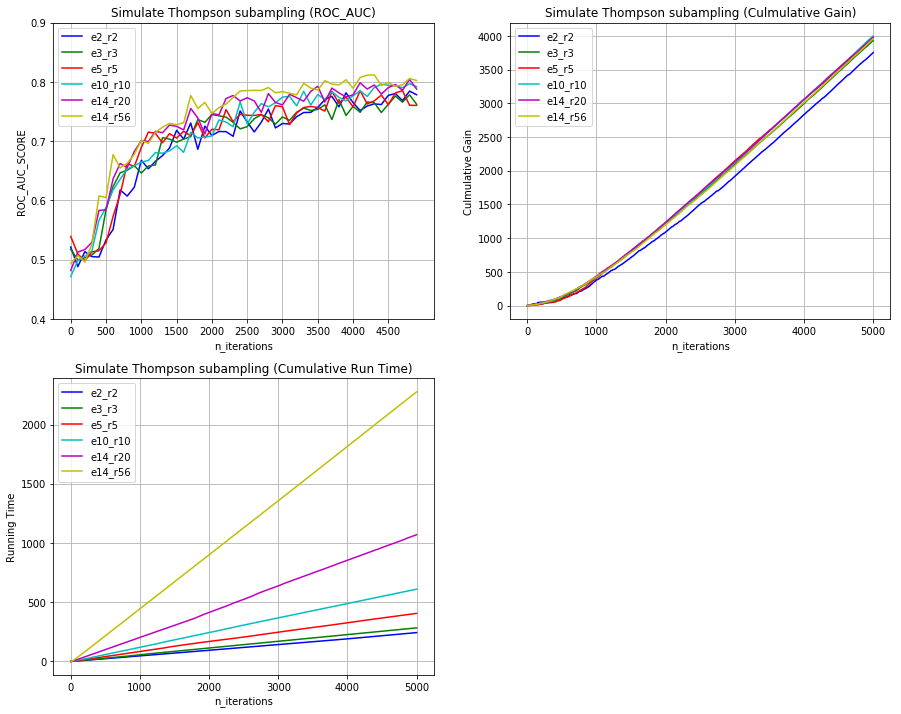

In [45]:
# with open ('outfile_sub50', 'rb') as fp:
#    results = pickle.load(fp)

plt.figure(figsize= (15,12))

subn_ent = [2,3,5,10,n_entities,n_entities]
subn_rel = [2,3,5,10,20,n_relations]
color = ['b', 'g', 'r', 'c', 'm', 'y']
    
# rtrs: repeated train ROC-AUC-SCORE
# rtes: repeated test ROC-AUC-SCORE
# rg: repeated cumulative gain

plt.subplot(221)
for i in range(len(subn_ent)):
    subn_entities = subn_ent[i]
    subn_relations = subn_rel[i]

    label = '_e' + str(subn_entities) + '_r' + str(subn_relations)
    plt.plot(results['TS_rtrs' + label][::100], label = label[1:], color = color[i])

plt.ylabel('ROC_AUC_SCORE')
plt.xlabel('n_iterations')
plt.xticks(numpy.arange(50, step = 5), numpy.arange(5000)[::500])
plt.ylim(0.4,0.9)
plt.title('Simulate Thompson subampling (ROC_AUC)')
plt.grid(True)
plt.legend()

plt.subplot(222)
for i in range(len(subn_ent)):
    subn_entities = subn_ent[i]
    subn_relations = subn_rel[i]

    label = '_e' + str(subn_entities) + '_r' + str(subn_relations)
    plt.plot(numpy.cumsum(results['TS_rg' + label]), label = label[1:], color = color[i])

plt.ylabel('Culmulative Gain')
plt.xlabel('n_iterations')
#plt.ylim(0,1300)
plt.title('Simulate Thompson subampling (Culmulative Gain)')
plt.grid(True)
plt.legend()

plt.subplot(223)
for i in range(len(subn_ent)):
    subn_entities = subn_ent[i]
    subn_relations = subn_rel[i]

    label = '_e' + str(subn_entities) + '_r' + str(subn_relations)
    plt.plot(numpy.cumsum(results['time' + label]), label = label[1:], color = color[i])

plt.ylabel('Running Time')
plt.xlabel('n_iterations')
#plt.ylim(0,1300)
plt.title('Simulate Thompson subampling (Cumulative Run Time)')
plt.grid(True)
plt.legend()


### plot gain vs running time

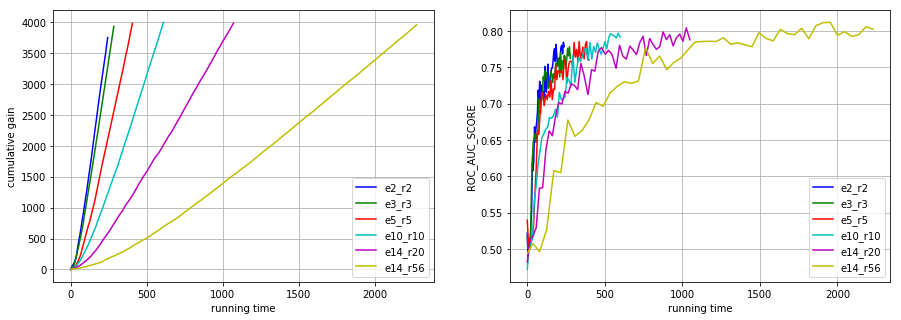

In [47]:
plt.figure(figsize= (15,5))

subn_ent = [2,3,5,10,n_entities,n_entities]
subn_rel = [2,3,5,10,20,n_relations]
color = ['b', 'g', 'r', 'c', 'm', 'y']
    
# rtrs: repeated train ROC-AUC-SCORE
# rtes: repeated test ROC-AUC-SCORE
# rg: repeated cumulative gain

plt.subplot(121)
for i in range(len(subn_ent)):
    subn_entities = subn_ent[i]
    subn_relations = subn_rel[i]

    label = '_e' + str(subn_entities) + '_r' + str(subn_relations)
    plt.plot(numpy.cumsum(results['time'+label]), 
         numpy.cumsum(results['TS_rg'+label]), label=label[1:], color = color[i])
    
plt.xlabel("running time")
plt.ylabel("cumulative gain")
plt.legend()
plt.grid(True)

plt.subplot(122)
for i in range(len(subn_ent)):
    subn_entities = subn_ent[i]
    subn_relations = subn_rel[i]

    label = '_e' + str(subn_entities) + '_r' + str(subn_relations)
    plt.plot(numpy.cumsum(results['time'+label])[::100], 
         results['TS_rtrs'+label][::100], label=label[1:], color = color[i])   
plt.xlabel("running time")
plt.ylabel("ROC_AUC_SCORE")
plt.legend()
plt.grid(True)
